Name: Yeo Chee En Luke <br>
StudentID: 46746267 <br>
Course: Comp4702 (Machine Learning) <br> 
Assignment 1 

In [1]:
!pip install mlxtend
!pip install seaborn
!pip install tensorflow
import seaborn as sns
!pip install openpyxl
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
import tensorflow as tf
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score


[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip

[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.0.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
# load the data, rename as penguin data 
nutrient_data = pd.read_excel('Rel_2_Nutrient_file.xlsx', sheet_name = None)

In [3]:
nutrient_data.keys()

dict_keys(['Index', 'All solids & liquids per 100g', 'Liquids only per 100mL'])

# 1) Information for each folder & Correlation 

## First folder : 'All solids & liquids per 100g'

## 1.1) general information 

In [4]:
nutrient_data['All solids & liquids per 100g'].shape

(1616, 293)

In [5]:
nutrient_data['All solids & liquids per 100g'].head(5)

,Public Food Key,Classification,Food Name,"Energy with dietary fibre, equated \n(kJ)","Energy, without dietary fibre, equated \n(kJ)",Moisture (water) \n(g),Protein \n(g),Nitrogen \n(g),"Fat, total \n(g)",Ash \n(g),...,Leucine \n(mg),Lysine \n(mg),Methionine \n(mg),Phenylalanine \n(mg),Proline \n(mg),Serine \n(mg),Threonine \n(mg),Tyrosine \n(mg),Tryptophan \n(mg),Valine \n(mg)
0,F002258,31302.0,"Cardamom seed, dried, ground",1236,1012,8.3,10.8,1.72,6.7,5.8,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,155,NaN
1,F002893,31302.0,"Chilli (chili), dried, ground",1280,1002,10.8,13.4,2.14,14.3,11.8,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,69,NaN
2,F002963,31302.0,"Cinnamon, dried, ground",1004,579,10.6,4.0,0.64,1.2,3.6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,49,NaN
3,F002970,31302.0,"Cloves, dried, ground",1389,1118,9.9,6.0,0.96,13.0,5.6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30,NaN
4,F003190,31302.0,"Coriander seed, dried, ground",1344,1009,8.9,12.4,1.98,17.8,6.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,178,NaN


In [6]:
nutrient_data['All solids & liquids per 100g'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1616 entries, 0 to 1615
Columns: 293 entries, Public Food Key to Valine 
(mg)
dtypes: float64(270), int64(21), object(2)
memory usage: 3.6+ MB


In [7]:
nutrient_data['All solids & liquids per 100g'].isna().sum()

Public Food Key                                     0
Classification                                      2
Food Name                                           0
Energy with dietary fibre, equated \n(kJ)           0
Energy, without dietary fibre, equated \n(kJ)       0
                                                 ... 
Serine \n(mg)                                    1435
Threonine \n(mg)                                 1435
Tyrosine \n(mg)                                  1435
Tryptophan \n(mg)                                   0
Valine \n(mg)                                    1435
Length: 293, dtype: int64

In [8]:
nan_percentage = nutrient_data['All solids & liquids per 100g'].isna().mean().mean() * 100
print(nan_percentage)

60.523181157706205


In [9]:
# Make a copy of the dataset
copied_data = nutrient_data['All solids & liquids per 100g'].copy()

In [10]:
copied_data.shape

(1616, 293)

## 1.2) dealing with missing details 

In [11]:
copied_data.loc[copied_data['Public Food Key'] == 'F009803', 'Classification'] = '28301'

In [12]:
copied_data.loc[copied_data['Public Food Key'] == 'F009834', 'Classification'] = '13104'

In [13]:
copied_data.isna().sum()

Public Food Key                                     0
Classification                                      0
Food Name                                           0
Energy with dietary fibre, equated \n(kJ)           0
Energy, without dietary fibre, equated \n(kJ)       0
                                                 ... 
Serine \n(mg)                                    1435
Threonine \n(mg)                                 1435
Tyrosine \n(mg)                                  1435
Tryptophan \n(mg)                                   0
Valine \n(mg)                                    1435
Length: 293, dtype: int64

In [14]:
# Replace all missing values with 0.0
copied_data = copied_data.fillna(0.0)

In [15]:
copied_data.isna().sum()

Public Food Key                                  0
Classification                                   0
Food Name                                        0
Energy with dietary fibre, equated \n(kJ)        0
Energy, without dietary fibre, equated \n(kJ)    0
                                                ..
Serine \n(mg)                                    0
Threonine \n(mg)                                 0
Tyrosine \n(mg)                                  0
Tryptophan \n(mg)                                0
Valine \n(mg)                                    0
Length: 293, dtype: int64

In [16]:
# Use the all() method to check which columns contain only the value 0.0
columns_with_only_zeros_mask = (copied_data == 0.0).all()

# Get the names of the columns that only contain the value 0.0
columns_with_only_zeros = columns_with_only_zeros_mask[columns_with_only_zeros_mask].index

# Print the number of columns that only contain the value 0.0
print("Number of columns with only 0.0 values:", len(columns_with_only_zeros))
print(columns_with_only_zeros)

# Drop the columns that only contain the value 0.0
copied_data = copied_data.drop(columns=columns_with_only_zeros)

Number of columns with only 0.0 values: 41
Index(['Shikimic acid \n(g)', '25-hydroxy ergocalciferol (25-OH D2) \n(ug)',
       'Delta tocotrienol \n(mg)', 'Gamma tocotrienol \n(mg)', 'C23 (%T)',
       'C10:1 (%T)', 'C18:1w5 (%T)', 'C18:1w6 (%T)', 'C18:1w7 (%T)',
       'C18:1w9 (%T)', 'C20:1w9 (%T)', 'C20:1w13 (%T)', 'C20:1w11 (%T)',
       'C22:1w9 (%T)', 'C22:1w11 (%T)', 'C24:1w9 (%T)', 'C24:1w11 (%T)',
       'C24:1w13 (%T)', 'C12:2 (%T)', 'C16:3 (%T)', 'C20:3 (%T)', 'C20:4 (%T)',
       'C23 (g)', 'C10:1 (g)', 'C12:1 (g)', 'C18:1w5 (mg)', 'C18:1w6 (mg)',
       'C18:1w7 (g)', 'C18:1w9 (mg)', 'C20:1w9 (mg)', 'C20:1w13 (mg)',
       'C20:1w11 (mg)', 'C22:1w9 (mg)', 'C22:1w11 (mg)', 'C24:1w9 (mg)',
       'C24:1w11 (mg)', 'C24:1w13 (mg)', 'C12:2 (g)', 'C16:3 (g)',
       'C20:3 (mg)', 'C20:4 (g)'],
      dtype='object')


In [17]:
copied_data.shape

(1616, 252)

In [18]:
# Select only numerical columns
num_cols = copied_data.select_dtypes(include=['float64', 'int64']).columns

# Calculate the correlation matrix for the numerical columns
corr_matrix = copied_data[num_cols].corr()

# Visualize the correlation matrix
corr_matrix.style.background_gradient(cmap='Reds')

**NOTE** : ignore classification, it is numerical but holds no value in the correlation 

## Second Folder : 'Liquids only per 100mL'

## 1.3) general information 

In [19]:
nutrient_data['Liquids only per 100mL'].shape

(190, 204)

In [20]:
nutrient_data['Liquids only per 100mL'].head(5)

,Public Food Key,Classification,Food name,"Energy with dietary fibre, equated \n(kJ)","Energy, without dietary fibre, equated \n(kJ)",Moisture (water) \n(g),Protein \n(g),Nitrogen \n(g),"Fat, total \n(g)",Ash \n(g),...,Leucine \n(mg),Lysine \n(mg),Methionine (mg),Phenylalanine (mg),Proline \n(mg),Serine (mg),Threonine (mg),Tyrosine (mg),Tryptophan (mg),Valine \n(mg)
0,NaN,NaN,NaN,per 100 mL,per 100 mL,per 100 mL,per 100 mL,per 100 mL,per 100 mL,per 100 mL,...,per 100 mL,per 100 mL,per 100 mL,per 100 mL,per 100 mL,per 100 mL,per 100 mL,per 100 mL,per 100 mL,per 100 mL
1,F009351,31401.0,"Vanilla, artificial or imitation",231,231,85.6,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN
2,F000996,29101.0,"Beer, high alcohol (5% v/v & above)",176,176,92.8,0.5,0.08,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN
3,F000994,29101.0,"Beer, full strength (alcohol 4-4.9% v/v)",153,153,93.9,0.4,0.06,0,0.1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN
4,F000995,29101.0,"Beer, full strength (alcohol 4-4.9% v/v), carb...",127,127,95.5,0.3,0.05,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN


In [21]:
nutrient_data['Liquids only per 100mL'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 190 entries, 0 to 189
Columns: 204 entries, Public Food Key to Valine 
(mg)
dtypes: float64(1), object(203)
memory usage: 302.9+ KB


In [22]:
nutrient_data['Liquids only per 100mL'].isna().sum()

Public Food Key                                    1
Classification                                     1
Food name                                          1
Energy with dietary fibre, equated \n(kJ)          0
Energy, without dietary fibre, equated \n(kJ)      0
                                                ... 
Serine (mg)                                      189
Threonine (mg)                                   189
Tyrosine (mg)                                    189
Tryptophan (mg)                                    0
Valine \n(mg)                                    189
Length: 204, dtype: int64

## 1.4) dealing with missing details 

In [23]:
# Make a copy of the dataset
copied_data2 = nutrient_data['Liquids only per 100mL'].copy()

In [24]:
#print dataset without the first 3 column
print(copied_data2.iloc[:, 3:])
# Exclude first 2 columns from the correlation matrix
copied_data2 = copied_data2.iloc[:, 3:].apply(pd.to_numeric, errors='coerce')

# Select only numerical columns
num_cols2 = copied_data2.select_dtypes(include=['float64', 'int64']).columns

    Energy with dietary fibre, equated \n(kJ)  \
0                                  per 100 mL   
1                                         231   
2                                         176   
3                                         153   
4                                         127   
..                                        ...   
185                                        80   
186                                      1762   
187                                      1662   
188                                      1732   
189                                      1439   

    Energy, without dietary fibre, equated \n(kJ) Moisture (water) \n(g)  \
0                                      per 100 mL             per 100 mL   
1                                             231                   85.6   
2                                             176                   92.8   
3                                             153                   93.9   
4                              

In [25]:
copied_data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 190 entries, 0 to 189
Columns: 201 entries, Energy with dietary fibre, equated 
(kJ) to Valine 
(mg)
dtypes: float64(201)
memory usage: 298.5 KB


In [26]:
# Replace all missing values with 0.0
copied_data2 = copied_data2.fillna(0.0)

In [27]:
copied_data2.isna().sum()

Energy with dietary fibre, equated \n(kJ)        0
Energy, without dietary fibre, equated \n(kJ)    0
Moisture (water) \n(g)                           0
Protein \n(g)                                    0
Nitrogen \n(g)                                   0
                                                ..
Serine (mg)                                      0
Threonine (mg)                                   0
Tyrosine (mg)                                    0
Tryptophan (mg)                                  0
Valine \n(mg)                                    0
Length: 201, dtype: int64

In [28]:
copied_data2.shape

(190, 201)

In [29]:
# Use the all() method to check which columns contain only the value 0.0
columns_with_only_zeros_mask2 = (copied_data2 == 0.0).all()

# Get the names of the columns that only contain the value 0.0
columns_with_only_zeros2 = columns_with_only_zeros_mask2[columns_with_only_zeros_mask2].index

# Print the number of columns that only contain the value 0.0
print("Number of columns with only 0.0 values:", len(columns_with_only_zeros2))
print(columns_with_only_zeros2)

# Drop the columns that only contain the value 0.0
copied_data2 = copied_data2.drop(columns=columns_with_only_zeros2)

Number of columns with only 0.0 values: 75
Index(['Glycerol \n(g)', 'Glycogen \n(g)', 'Inulin \n(g)', 'Erythritol\n(g)',
       'Maltitol \n(g)', 'Mannitol \n(g)', 'Xylitol \n(g)',
       'Oligosaccharides \n(g)', 'Polydextrose \n(g)',
       'Resistant starch \n(g)', 'Fumaric acid \n(g)', 'Propionic acid \n(g)',
       'Shikimic acid \n(g)', 'Antimony (Sb) \n(ug)', 'Cobalt (Co) \n(ug)',
       'Lutein \n(ug)', 'Xanthophyl \n(ug)', 'Ergocalciferol (D2) \n(ug)',
       '25-hydroxy cholecalciferol (25-OH D3) \n(ug)',
       '25-hydroxy ergocalciferol (25-OH D2) \n(ug)',
       'Alpha tocotrienol \n(mg)', 'Beta tocotrienol \n(mg)',
       'Delta tocotrienol \n(mg)', 'Gamma tocotrienol \n(mg)', 'C11 (g)',
       'C13 (g)', 'C21 (g)', 'C23 (g)', 'C10:1 (g)', 'C12:1 (g)', 'C15:1 (g)',
       'C18:1w5 (mg)', 'C18:1w6 (mg)', 'C18:1w7 (g)', 'C18:1w9 (mg)',
       'C20:1w9 (mg)', 'C20:1w13 (mg)', 'C20:1w11 (mg)', 'C22:1w9 (mg)',
       'C22:1w11 (mg)', 'C24:1w9 (mg)', 'C24:1w11 (mg)', 'C24:1w13 

In [30]:
copied_data2.shape

(190, 126)

In [31]:
# Calculate the correlation matrix
corr_matrix2 = copied_data2.corr()

# Visualize the correlation matrix
corr_matrix2.style.background_gradient(cmap='Blues')

# START OF ACTUAL ASSIGNMENT 

# Objective : 

Objective of this assignment is to predict if an item is predicted as solid or liquid.  

This will be done using : 
1) Classifying KNN model 
2) Cross-Validation 
3) Neuron network model 

- There will be a confusion matrix model or numerical results (summary) 

# MODEL STRUCTURE 

To start with the assignment, i am going to split the food and solid by using the unique numbers in the classification. <br>

Setting 0 as food,  Setting 1 as liquid <br> 

copied_data = solid & liquid <br>
copied_data2 = liquid only 



In [32]:
liquid_data = nutrient_data['Liquids only per 100mL'].copy()
liquid_data = liquid_data.drop(0)
liquid_data.head(5)

,Public Food Key,Classification,Food name,"Energy with dietary fibre, equated \n(kJ)","Energy, without dietary fibre, equated \n(kJ)",Moisture (water) \n(g),Protein \n(g),Nitrogen \n(g),"Fat, total \n(g)",Ash \n(g),...,Leucine \n(mg),Lysine \n(mg),Methionine (mg),Phenylalanine (mg),Proline \n(mg),Serine (mg),Threonine (mg),Tyrosine (mg),Tryptophan (mg),Valine \n(mg)
1,F009351,31401.0,"Vanilla, artificial or imitation",231,231,85.6,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN
2,F000996,29101.0,"Beer, high alcohol (5% v/v & above)",176,176,92.8,0.5,0.08,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN
3,F000994,29101.0,"Beer, full strength (alcohol 4-4.9% v/v)",153,153,93.9,0.4,0.06,0,0.1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN
4,F000995,29101.0,"Beer, full strength (alcohol 4-4.9% v/v), carb...",127,127,95.5,0.3,0.05,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN
5,F001006,29102.0,"Beer, mid-strength (alcohol 3-3.9% v/v)",129,129,95,0.3,0.05,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN


In [33]:
liquid_data['Classification']

1      31401.0
2      29101.0
3      29101.0
4      29101.0
5      29102.0
        ...   
185    21301.0
186    27102.0
187    27102.0
188    27102.0
189    27102.0
Name: Classification, Length: 189, dtype: float64

In [34]:
liquid_data['Classification'].unique()

array([3.1401e+04, 2.9101e+04, 2.9102e+04, 2.9301e+04, 2.9401e+04,
       2.9201e+04, 2.9202e+04, 2.9203e+04, 3.0104e+04, 1.1801e+04,
       1.1803e+04, 1.1201e+04, 1.1203e+04, 1.1208e+04, 1.1202e+04,
       1.1403e+04, 1.1401e+04, 1.1307e+04, 1.1301e+04, 2.2203e+04,
       1.1702e+04, 1.1505e+04, 1.1503e+04, 1.1504e+04, 1.1603e+04,
       1.1501e+04, 1.1502e+04, 2.9505e+04, 1.1101e+04, 1.1103e+04,
       1.1701e+04, 1.1805e+04, 2.3303e+04, 2.3301e+04, 2.3101e+04,
       2.3503e+04, 2.3302e+04, 2.3103e+04, 2.3107e+04, 2.3104e+04,
       2.3108e+04, 2.3305e+04, 1.9301e+04, 1.9305e+04, 1.9303e+04,
       1.9304e+04, 1.9501e+04, 1.9101e+04, 1.9102e+04, 1.9103e+04,
       1.9104e+04, 1.9105e+04, 1.9803e+04, 1.9106e+04, 3.2102e+04,
       1.9602e+04, 1.9701e+04, 1.9204e+04, 1.9201e+04, 1.9205e+04,
       1.9207e+04, 1.9209e+04, 1.9208e+04, 2.0106e+04, 2.0101e+04,
       2.0102e+04, 2.0104e+04, 2.0000e+01, 2.0501e+04, 2.0502e+04,
       1.4402e+04, 1.4401e+04, 1.4502e+04, 1.6404e+04, 1.6702e

In [35]:
solid_and_liquid_data = copied_data
solid_and_liquid_data['Classification'].unique() 

array([31302.0, 31301.0, 31303.0, 31501.0, 31502.0, 12103.0, 24102.0,
       31401.0, 31101.0, 29101.0, 29102.0, 29301.0, 29401.0, 29201.0,
       29202.0, 29203.0, 30105.0, 30104.0, 11804.0, 11802.0, 11803.0,
       11801.0, 11205.0, 11201.0, 11203.0, 11209.0, 11208.0, 11202.0,
       11403.0, 11401.0, 11307.0, 11301.0, 22203.0, 11702.0, 11505.0,
       11503.0, 11504.0, 11603.0, 11501.0, 11502.0, 29505.0, 11101.0,
       11103.0, 11701.0, 13204.0, 13202.0, 13201.0, 13205.0, 13203.0,
       132.0, 13101.0, 13102.0, 13105.0, '13104', 13106.0, 13104.0,
       12201.0, 12302.0, 12207.0, 12202.0, 12203.0, 12304.0, 12204.0,
       12305.0, 12307.0, 12213.0, 12210.0, 12306.0, 13606.0, 12301.0,
       11805.0, 12501.0, 12502.0, 12512.0, 12515.0, 12513.0, 12511.0,
       12503.0, 12504.0, 12509.0, 12506.0, 12505.0, 12514.0, 13303.0,
       13306.0, 13301.0, 13302.0, 13605.0, 13304.0, 13601.0, 13602.0,
       13305.0, 13307.0, 12101.0, 12601.0, 12102.0, 13511.0, 25201.0,
       12104.0, 13506.

In [36]:
solid_and_liquid_data = solid_and_liquid_data.assign(category ='0')

In [37]:
solid_and_liquid_data.head(5)

,Public Food Key,Classification,Food Name,"Energy with dietary fibre, equated \n(kJ)","Energy, without dietary fibre, equated \n(kJ)",Moisture (water) \n(g),Protein \n(g),Nitrogen \n(g),"Fat, total \n(g)",Ash \n(g),...,Lysine \n(mg),Methionine \n(mg),Phenylalanine \n(mg),Proline \n(mg),Serine \n(mg),Threonine \n(mg),Tyrosine \n(mg),Tryptophan \n(mg),Valine \n(mg),category
0,F002258,31302.0,"Cardamom seed, dried, ground",1236,1012,8.3,10.8,1.72,6.7,5.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,155,0.0,0
1,F002893,31302.0,"Chilli (chili), dried, ground",1280,1002,10.8,13.4,2.14,14.3,11.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,69,0.0,0
2,F002963,31302.0,"Cinnamon, dried, ground",1004,579,10.6,4.0,0.64,1.2,3.6,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49,0.0,0
3,F002970,31302.0,"Cloves, dried, ground",1389,1118,9.9,6.0,0.96,13.0,5.6,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,30,0.0,0
4,F003190,31302.0,"Coriander seed, dried, ground",1344,1009,8.9,12.4,1.98,17.8,6.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,178,0.0,0


In [38]:
classification_set = set(liquid_data['Classification'])

#number of change
num_changes = solid_and_liquid_data.loc[solid_and_liquid_data['Classification'].isin(classification_set), 'category'].count()

#Set it equals to 1
solid_and_liquid_data.loc[solid_and_liquid_data['Classification'].isin(classification_set), 'category'] = 1

print(f"Number of changes: {num_changes}")

Number of changes: 221


In [39]:
solid_and_liquid_data.head(5)

,Public Food Key,Classification,Food Name,"Energy with dietary fibre, equated \n(kJ)","Energy, without dietary fibre, equated \n(kJ)",Moisture (water) \n(g),Protein \n(g),Nitrogen \n(g),"Fat, total \n(g)",Ash \n(g),...,Lysine \n(mg),Methionine \n(mg),Phenylalanine \n(mg),Proline \n(mg),Serine \n(mg),Threonine \n(mg),Tyrosine \n(mg),Tryptophan \n(mg),Valine \n(mg),category
0,F002258,31302.0,"Cardamom seed, dried, ground",1236,1012,8.3,10.8,1.72,6.7,5.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,155,0.0,0
1,F002893,31302.0,"Chilli (chili), dried, ground",1280,1002,10.8,13.4,2.14,14.3,11.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,69,0.0,0
2,F002963,31302.0,"Cinnamon, dried, ground",1004,579,10.6,4.0,0.64,1.2,3.6,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49,0.0,0
3,F002970,31302.0,"Cloves, dried, ground",1389,1118,9.9,6.0,0.96,13.0,5.6,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,30,0.0,0
4,F003190,31302.0,"Coriander seed, dried, ground",1344,1009,8.9,12.4,1.98,17.8,6.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,178,0.0,0


In [40]:
changed_rows = solid_and_liquid_data.loc[solid_and_liquid_data['category'] == 1, ['Classification', 'category']]
print(changed_rows)


     Classification category
29          31401.0        1
30          31401.0        1
32          29101.0        1
33          29101.0        1
34          29101.0        1
...             ...      ...
1339        21301.0        1
1366        27102.0        1
1367        27102.0        1
1373        27102.0        1
1374        27102.0        1

[221 rows x 2 columns]


In [41]:
changed_rows = solid_and_liquid_data.loc[solid_and_liquid_data['category'] == 1, 'Classification']
print(changed_rows.unique())

[31401.0 29101.0 29102.0 29301.0 29401.0 29201.0 29202.0 29203.0 30104.0
 11803.0 11801.0 11201.0 11203.0 11208.0 11202.0 11403.0 11401.0 11307.0
 11301.0 22203.0 11702.0 11505.0 11503.0 11504.0 11603.0 11501.0 11502.0
 29505.0 11101.0 11103.0 11701.0 11805.0 23303.0 23301.0 23101.0 23503.0
 23302.0 23103.0 23107.0 23104.0 23108.0 23305.0 19301.0 19305.0 19303.0
 19304.0 19501.0 19101.0 19102.0 19103.0 19104.0 19105.0 19803.0 19106.0
 32102.0 19602.0 19701.0 19204.0 19201.0 19205.0 19207.0 19209.0 19208.0
 20106.0 20101.0 20102.0 20104.0 20.0 20501.0 20502.0 14402.0 14401.0
 14502.0 16404.0 16702.0 16304.0 16505.0 16402.0 16104.0 16202.0 22102.0
 21301.0 27102.0]


In [42]:
solid_and_liquid_data['category'] = solid_and_liquid_data['category'].astype(int)


In [43]:
solid_and_liquid_data['category']

0       0
1       0
2       0
3       0
4       0
       ..
1611    0
1612    0
1613    0
1614    0
1615    0
Name: category, Length: 1616, dtype: int32

In [44]:
solid_and_liquid_data.select_dtypes(include=[np.number])

,"Energy with dietary fibre, equated \n(kJ)","Energy, without dietary fibre, equated \n(kJ)",Moisture (water) \n(g),Protein \n(g),Nitrogen \n(g),"Fat, total \n(g)",Ash \n(g),Total dietary fibre \n(g),Alcohol \n(g),Fructose \n(g),...,Lysine \n(mg),Methionine \n(mg),Phenylalanine \n(mg),Proline \n(mg),Serine \n(mg),Threonine \n(mg),Tyrosine \n(mg),Tryptophan \n(mg),Valine \n(mg),category
0,1236,1012,8.3,10.8,1.72,6.7,5.8,28.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,155,0.0,0
1,1280,1002,10.8,13.4,2.14,14.3,11.8,34.8,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,69,0.0,0
2,1004,579,10.6,4.0,0.64,1.2,3.6,53.1,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49,0.0,0
3,1389,1118,9.9,6.0,0.96,13.0,5.6,33.9,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,30,0.0,0
4,1344,1009,8.9,12.4,1.98,17.8,6.0,41.9,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,178,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1611,92,80,92.6,1.3,0.20,0.4,0.6,1.6,0.0,1.3,...,58.0,16.0,38.0,32.0,81.0,39.0,28.0,14,53.0,0
1612,77,66,93.8,1.1,0.17,0.4,0.5,1.3,0.0,1.1,...,48.0,13.0,31.0,26.0,67.0,33.0,24.0,12,44.0,0
1613,78,70,94.1,2.2,0.35,0.3,0.6,1.0,0.0,0.6,...,100.0,27.0,64.0,54.0,138.0,67.0,48.0,25,91.0,0
1614,111,100,91.6,3.1,0.50,0.4,0.8,1.4,0.0,0.8,...,142.0,38.0,92.0,77.0,198.0,96.0,69.0,35,130.0,0


# Correlation (feature selection) -> only after split

In [45]:
X = solid_and_liquid_data.select_dtypes(include=[np.number]) #Top 20 correlation

y = solid_and_liquid_data['category']

# split the data into train-test split where 30% of data will be used as test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, shuffle=True, random_state=42)

In [46]:
# Calculate the correlation matrix
corr_matrix3 = X.corr(numeric_only=True)

# Visualize the correlation matrix
corr_matrix3.style.background_gradient(cmap='Greens')

In [47]:
# Select the 'A' column and take the absolute value of the correlations
corr_with_A = corr_matrix3['category'].abs()

# Sort the absolute correlations in descending order
sorted_corr_with_A = corr_with_A.sort_values(ascending=False)

# Select the top 20 correlations
top_20_corr_with_A = sorted_corr_with_A.head(21)

# Print the top 20 correlations
print(top_20_corr_with_A)

category                                        1.000000
Nitrogen \n(g)                                  0.387011
Protein \n(g)                                   0.386514
Tryptophan \n(mg)                               0.383890
Niacin derived from tryptophan \n(mg)           0.383775
Phosphorus (P) \n(mg)                           0.345831
Niacin derived equivalents \n(mg)               0.299194
Zinc (Zn) \n(mg)                                0.284724
Alcohol \n(g)                                   0.275428
C20:4w6 (mg)                                    0.232458
C10 (%T)                                        0.231035
Moisture (water) \n(g)                          0.218761
Niacin (B3) \n(mg)                              0.212431
C8 (%T)                                         0.207888
Cholesterol \n(mg)                              0.192631
Vitamin D3 equivalents \n(ug)                   0.191616
C6 (%T)                                         0.188427
Starch \n(g)                   

In [48]:
specific_columns_to_exclude = ['Public Food Key','Classification','Food Name', 'category']

# Select all columns except the specific columns
solid_and_liquid_data_numerical = solid_and_liquid_data.drop(specific_columns_to_exclude, axis=1)

# Logistic Regression

Training loss LR, ratio 70-30: 0.05216622458001763
Test loss LR, ratio 70-30: 0.0597938144329897
Training accuracy LR, ratio 70-30: 0.9478337754199824
Test accuracy LR, ratio 70-30: 0.9402061855670103


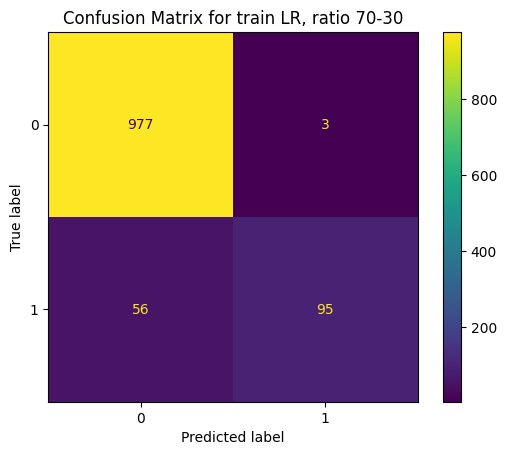

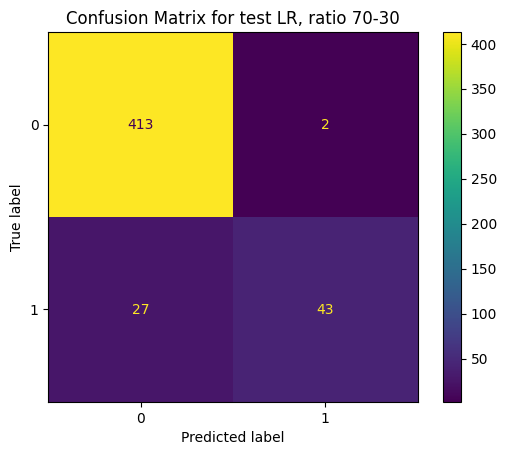

Classification Report for train set, LR, ratio 70-30:
              precision    recall  f1-score   support

           0       0.95      1.00      0.97       980
           1       0.97      0.63      0.76       151

    accuracy                           0.95      1131
   macro avg       0.96      0.81      0.87      1131
weighted avg       0.95      0.95      0.94      1131

Classification Report for test set, LR, ratio 70-30:
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       415
           1       0.96      0.61      0.75        70

    accuracy                           0.94       485
   macro avg       0.95      0.80      0.86       485
weighted avg       0.94      0.94      0.93       485



In [49]:
#Set what is X and what is Y 
# Specify the list of specific columns to exclude

X1 = solid_and_liquid_data_numerical #All columns
y1 = solid_and_liquid_data['category']


# split the data into train-test split where 30% of data will be used as the test set
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.3, shuffle=True, random_state=42)

# Apply MinMaxScaler to scale the features, this is because the dataset is not uniformly distributed
scaler = MinMaxScaler()
X1_train_scaled = scaler.fit_transform(X1_train)
X1_test_scaled = scaler.transform(X1_test)

# build the logistic regression model
logreg = LogisticRegression()
logreg.fit(X1_train_scaled, y1_train)

# Predicting for both train and test
y1_train_pred = logreg.predict(X1_train_scaled)
y1_test_pred = logreg.predict(X1_test_scaled)

# Compute the training and test loss score
train_loss = 1 - logreg.score(X1_train_scaled, y1_train)
test_loss = 1 - logreg.score(X1_test_scaled, y1_test)

accuracy_train = accuracy_score(y1_train, y1_train_pred)
accuracy_test = accuracy_score(y1_test, y1_test_pred)

print('Training loss LR, ratio 70-30:', train_loss)
print('Test loss LR, ratio 70-30:', test_loss)
print('Training accuracy LR, ratio 70-30:', accuracy_train)
print('Test accuracy LR, ratio 70-30:', accuracy_test)

cm1 = confusion_matrix(y1_train, y1_train_pred)
display = ConfusionMatrixDisplay(confusion_matrix=cm1)
display.plot();
plt.title("Confusion Matrix for train LR, ratio 70-30")
plt.show()

cm2 = confusion_matrix(y1_test, y1_test_pred)
display = ConfusionMatrixDisplay(confusion_matrix=cm2)
display.plot();
plt.title("Confusion Matrix for test LR, ratio 70-30")
plt.show()

# Classification report for training set
print("Classification Report for train set, LR, ratio 70-30:")
print(classification_report(y1_train, y1_train_pred))

# Classification report for test set
print("Classification Report for test set, LR, ratio 70-30:")
print(classification_report(y1_test, y1_test_pred))

Training loss LR, ratio 50-50: 0.05074257425742579
Test loss LR, ratio 50-50: 0.0606435643564357
Training accuracy LR, ratio 50-50: 0.9492574257425742
Test accuracy LR, ratio 50-50: 0.9393564356435643


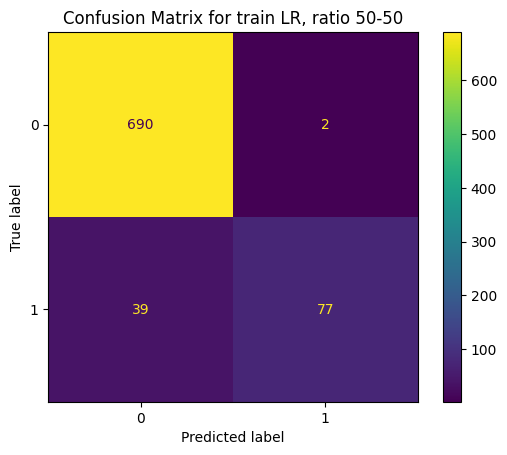

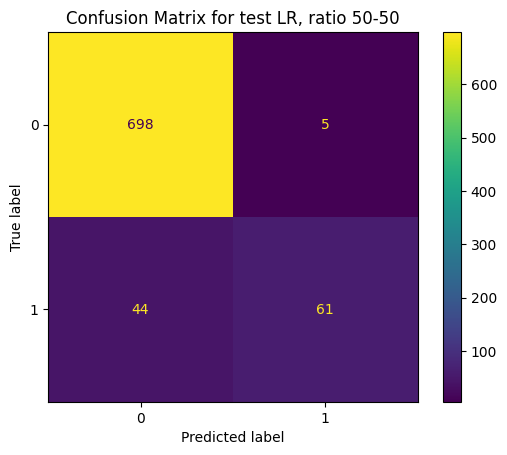

Classification Report for train set, LR, ratio 50-50:
              precision    recall  f1-score   support

           0       0.95      1.00      0.97       692
           1       0.97      0.66      0.79       116

    accuracy                           0.95       808
   macro avg       0.96      0.83      0.88       808
weighted avg       0.95      0.95      0.95       808

Classification Report for test set, LR, ratio 50-50:
              precision    recall  f1-score   support

           0       0.94      0.99      0.97       703
           1       0.92      0.58      0.71       105

    accuracy                           0.94       808
   macro avg       0.93      0.79      0.84       808
weighted avg       0.94      0.94      0.93       808



In [50]:
#Set what is X and what is Y 
X2 = solid_and_liquid_data_numerical #Top 20 correlation
y2 = solid_and_liquid_data['category']

# split the data into train-test split where 30% of data will be used as the test set
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.5, shuffle=True, random_state=42)

# Apply MinMaxScaler to scale the features, this is because the dataset is not uniformly distributed
scaler = MinMaxScaler()
X2_train_scaled = scaler.fit_transform(X2_train)
X2_test_scaled = scaler.transform(X2_test)

# build the logistic regression model
logreg = LogisticRegression()
logreg.fit(X2_train_scaled, y2_train)

# Predicting for both train and test
y2_train_pred = logreg.predict(X2_train_scaled)
y2_test_pred = logreg.predict(X2_test_scaled)

# Compute the training and test loss score
train_loss = 1 - logreg.score(X2_train_scaled, y2_train)
test_loss = 1 - logreg.score(X2_test_scaled, y2_test)

accuracy_train = accuracy_score(y2_train, y2_train_pred)
accuracy_test = accuracy_score(y2_test, y2_test_pred)

print('Training loss LR, ratio 50-50:', train_loss)
print('Test loss LR, ratio 50-50:', test_loss)
print('Training accuracy LR, ratio 50-50:', accuracy_train)
print('Test accuracy LR, ratio 50-50:', accuracy_test)

cm3 = confusion_matrix(y2_train, y2_train_pred)
display = ConfusionMatrixDisplay(confusion_matrix=cm3)
display.plot();
plt.title("Confusion Matrix for train LR, ratio 50-50")
plt.show()

cm4 = confusion_matrix(y2_test, y2_test_pred)
display = ConfusionMatrixDisplay(confusion_matrix=cm4)
display.plot();
plt.title("Confusion Matrix for test LR, ratio 50-50")
plt.show()

# Classification report for training set
print("Classification Report for train set, LR, ratio 50-50:")
print(classification_report(y2_train, y2_train_pred))

# Classification report for test set
print("Classification Report for test set, LR, ratio 50-50:")
print(classification_report(y2_test, y2_test_pred))

Training loss LR, ratio 30-70: 0.07644628099173556
Test loss LR, ratio 30-70: 0.08127208480565373
Training accuracy LR, ratio 30-70: 0.9235537190082644
Test accuracy LR, ratio 30-70: 0.9187279151943463


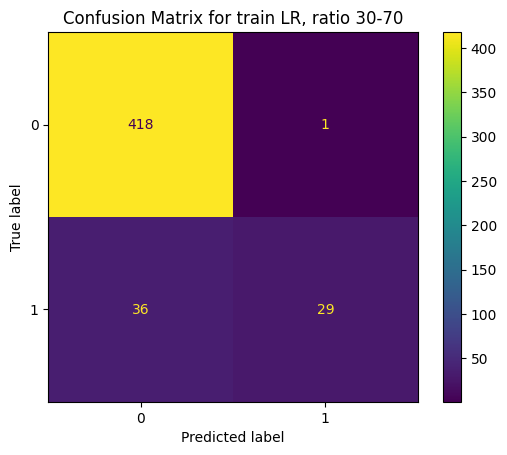

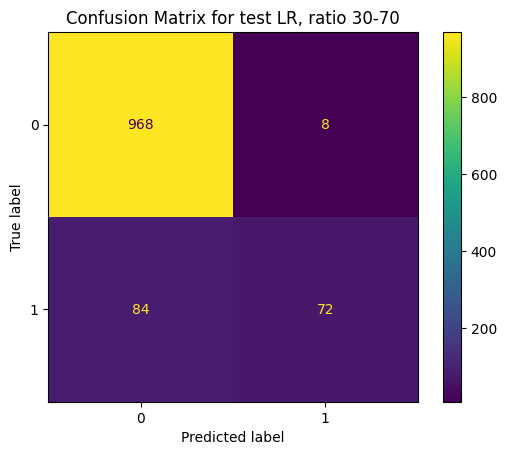

Classification Report for train set, LR, ratio 30-70:
              precision    recall  f1-score   support

           0       0.92      1.00      0.96       419
           1       0.97      0.45      0.61        65

    accuracy                           0.92       484
   macro avg       0.94      0.72      0.78       484
weighted avg       0.93      0.92      0.91       484

Classification Report for test set, LR, ratio 30-70:
              precision    recall  f1-score   support

           0       0.92      0.99      0.95       976
           1       0.90      0.46      0.61       156

    accuracy                           0.92      1132
   macro avg       0.91      0.73      0.78      1132
weighted avg       0.92      0.92      0.91      1132



In [51]:
#Set what is X and what is Y 
X3 = solid_and_liquid_data_numerical #Top 20 correlation
y3 = solid_and_liquid_data['category']

# split the data into train-test split where 30% of data will be used as the test set
X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y3, test_size=0.7, shuffle=True, random_state=42)

# Apply MinMaxScaler to scale the features, this is because the dataset is not uniformly distributed
scaler = MinMaxScaler()
X3_train_scaled = scaler.fit_transform(X3_train)
X3_test_scaled = scaler.transform(X3_test)

# build the logistic regression model
logreg = LogisticRegression()
logreg.fit(X3_train_scaled, y3_train)

# Predicting for both train and test
y3_train_pred = logreg.predict(X3_train_scaled)
y3_test_pred = logreg.predict(X3_test_scaled)

# Compute the training and test loss score
train_loss = 1 - logreg.score(X3_train_scaled, y3_train)
test_loss = 1 - logreg.score(X3_test_scaled, y3_test)

accuracy_train = accuracy_score(y3_train, y3_train_pred)
accuracy_test = accuracy_score(y3_test, y3_test_pred)

print('Training loss LR, ratio 30-70:', train_loss)
print('Test loss LR, ratio 30-70:', test_loss)
print('Training accuracy LR, ratio 30-70:', accuracy_train)
print('Test accuracy LR, ratio 30-70:', accuracy_test)

cm5 = confusion_matrix(y3_train, y3_train_pred)
display = ConfusionMatrixDisplay(confusion_matrix=cm5)
display.plot();
plt.title("Confusion Matrix for train LR, ratio 30-70")
plt.show()

cm6 = confusion_matrix(y3_test, y3_test_pred)
display = ConfusionMatrixDisplay(confusion_matrix=cm6)
display.plot();
plt.title("Confusion Matrix for test LR, ratio 30-70")
plt.show()

# Classification report for training set
print("Classification Report for train set, LR, ratio 30-70:")
print(classification_report(y3_train, y3_train_pred))

# Classification report for test set
print("Classification Report for test set, LR, ratio 30-70:")
print(classification_report(y3_test, y3_test_pred))

# KNN-Classifier

## Finding Best K-value (hyper-parameter)

Average: 0.9460720385033381
Standard deviation: 0.023545954859757592
Average: 0.9283884489986025
Standard deviation: 0.019137053896047508
Average: 0.9310510790249962
Standard deviation: 0.022251131516196693
Average: 0.9283806862288465
Standard deviation: 0.01916873548068842
Average: 0.9292811675205714
Standard deviation: 0.021614679305036674
Average: 0.9328132277596646
Standard deviation: 0.01729280457404331
Average: 0.934598664803602
Standard deviation: 0.020124454709082817
Average: 0.9328209905294209
Standard deviation: 0.017247756411514215
Average: 0.9354603322465456
Standard deviation: 0.017700483690208206
Average: 0.927526781555659
Standard deviation: 0.017877414369721012
Average: 0.9319360347772084
Standard deviation: 0.017633377129842774
Average: 0.9266340630336904
Standard deviation: 0.01760757897660069
Average: 0.929273404750815
Standard deviation: 0.015792856652868444
Average: 0.9239791957770531
Standard deviation: 0.016778075302126494
Average: 0.9222015215028723
Standard dev

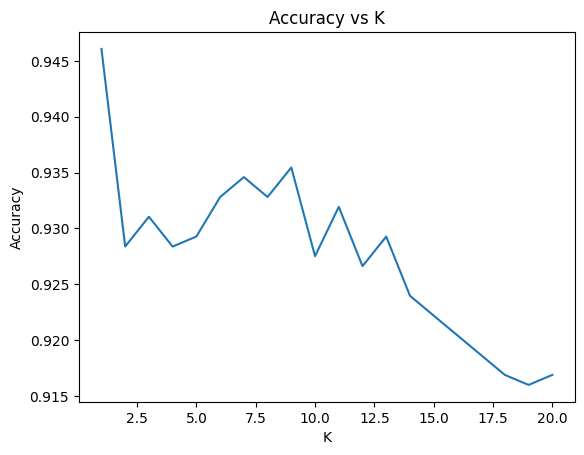

In [52]:
X_train = X_train[['Nitrogen \n(g)','Protein \n(g)','Tryptophan \n(mg)','Niacin derived from tryptophan \n(mg)',
                           'Phosphorus (P) \n(mg)','Niacin derived equivalents \n(mg)','Zinc (Zn) \n(mg)','Alcohol \n(g)',
                           'C20:4w6 (mg)','C10 (%T)','Moisture (water) \n(g)','Niacin (B3) \n(mg)','C8 (%T)',
                           'Cholesterol \n(mg)','Vitamin D3 equivalents \n(ug)','C6 (%T)','Starch \n(g)',
                           'C12 (%T)','C14 (%T)','25-hydroxy cholecalciferol (25-OH D3) \n(ug)']] #Top 20 correlation#Top 20 correlati
X_test = X_test[['Nitrogen \n(g)','Protein \n(g)','Tryptophan \n(mg)','Niacin derived from tryptophan \n(mg)',
                           'Phosphorus (P) \n(mg)','Niacin derived equivalents \n(mg)','Zinc (Zn) \n(mg)','Alcohol \n(g)',
                           'C20:4w6 (mg)','C10 (%T)','Moisture (water) \n(g)','Niacin (B3) \n(mg)','C8 (%T)',
                           'Cholesterol \n(mg)','Vitamin D3 equivalents \n(ug)','C6 (%T)','Starch \n(g)',
                           'C12 (%T)','C14 (%T)','25-hydroxy cholecalciferol (25-OH D3) \n(ug)']] #Top 20 correlation#Top 20 correlation

# Apply MinMaxScaler to scale the features , this is because the dataset is not uniformly distributed
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

accuracy = []

for k in range(1, 21):
    # build the k-NN regression model with k for the training/test data
    knn = KNeighborsClassifier(n_neighbors=k)
#     knn.fit(X_train_scaled, y_train)
    scores = cross_val_score(knn, X_train_scaled, y_train, cv=10)

    # print the average score and the standard deviation
    print("Average:", scores.mean())
    print("Standard deviation:", scores.std())

    # Predicting for test set
#     y_test_pred = knn.predict(X_test_scaled)

    # Compute the test accuracy score
#     accuracy_test = accuracy_score(y_test, y_test_pred)
    accuracy.append(scores.mean())
    
    

# plot accuracy vs K
plt.plot(range(1,21), accuracy)
plt.xlabel('K')
plt.ylabel('Accuracy')
plt.title('Accuracy vs K')
plt.show()

F1 score for k = 1 : 0.8787173124447356
F1 score for k = 2 : 0.814453693769169
F1 score for k = 3 : 0.8436867181119629
F1 score for k = 4 : 0.8155004482562127
F1 score for k = 5 : 0.8352632434388054
F1 score for k = 6 : 0.8342009456840499
F1 score for k = 7 : 0.8532975777740189
F1 score for k = 8 : 0.8394106861673555
F1 score for k = 9 : 0.8535872074984938
F1 score for k = 10 : 0.8258555525049969
F1 score for k = 11 : 0.8447756388690613
F1 score for k = 12 : 0.8192927744193644
F1 score for k = 13 : 0.8329219930820635
F1 score for k = 14 : 0.8086815372622919
F1 score for k = 15 : 0.8101416218555583
F1 score for k = 16 : 0.7936995143958347
F1 score for k = 17 : 0.7972693643157105
F1 score for k = 18 : 0.7798356129610718
F1 score for k = 19 : 0.7823412923766643
F1 score for k = 20 : 0.778164201444545


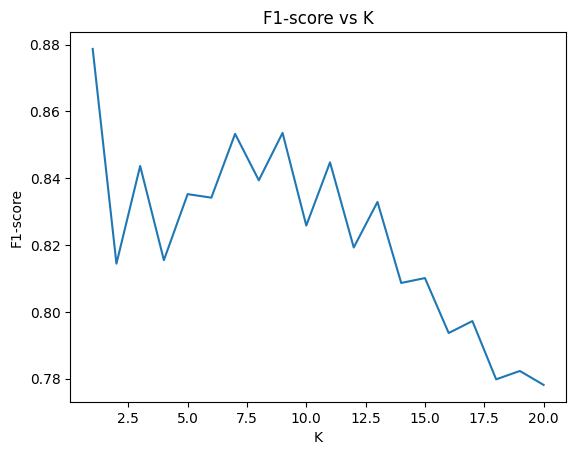

In [53]:
X_train = X_train[['Nitrogen \n(g)','Protein \n(g)','Tryptophan \n(mg)','Niacin derived from tryptophan \n(mg)',
                           'Phosphorus (P) \n(mg)','Niacin derived equivalents \n(mg)','Zinc (Zn) \n(mg)','Alcohol \n(g)',
                           'C20:4w6 (mg)','C10 (%T)','Moisture (water) \n(g)','Niacin (B3) \n(mg)','C8 (%T)',
                           'Cholesterol \n(mg)','Vitamin D3 equivalents \n(ug)','C6 (%T)','Starch \n(g)',
                           'C12 (%T)','C14 (%T)','25-hydroxy cholecalciferol (25-OH D3) \n(ug)']] #Top 20 correlation#Top 20 correlation

X_test = X_test[['Nitrogen \n(g)','Protein \n(g)','Tryptophan \n(mg)','Niacin derived from tryptophan \n(mg)',
                           'Phosphorus (P) \n(mg)','Niacin derived equivalents \n(mg)','Zinc (Zn) \n(mg)','Alcohol \n(g)',
                           'C20:4w6 (mg)','C10 (%T)','Moisture (water) \n(g)','Niacin (B3) \n(mg)','C8 (%T)',
                           'Cholesterol \n(mg)','Vitamin D3 equivalents \n(ug)','C6 (%T)','Starch \n(g)',
                           'C12 (%T)','C14 (%T)','25-hydroxy cholecalciferol (25-OH D3) \n(ug)']] #Top 20 correlation#Top 20 correlation

# Apply MinMaxScaler to scale the features, this is because the dataset is not uniformly distributed
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

f1_scores = []

for k in range(1, 21):
    # Build the k-NN classifier model with k for the training/test data
    knn = KNeighborsClassifier(n_neighbors=k)
    f1 = cross_val_score(knn, X_train_scaled, y_train, cv=10, scoring='f1_macro')
    f1_scores.append(f1.mean())
    print("F1 score for k =", k, ":", f1.mean())

# Plot F1-score vs K
plt.plot(range(1, 21), f1_scores)
plt.xlabel('K')
plt.ylabel('F1-score')
plt.title('F1-score vs K')
plt.show()

# KNN Classification
model with best K

Training loss KNN: 70-30: 0.0
Test loss KNN: 70-30: 0.0
Training accuracy KNN: 70-30: 1.0
Test accuracy KNN: 70-30: 1.0


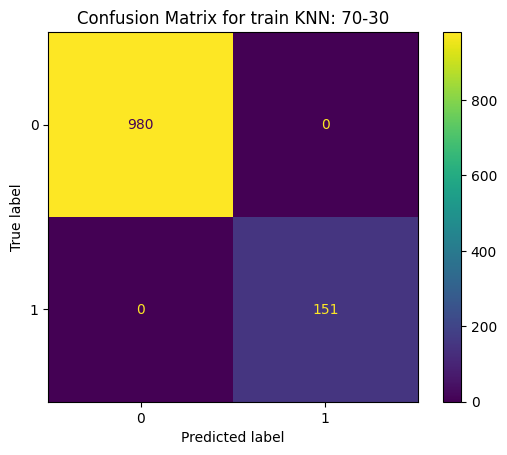

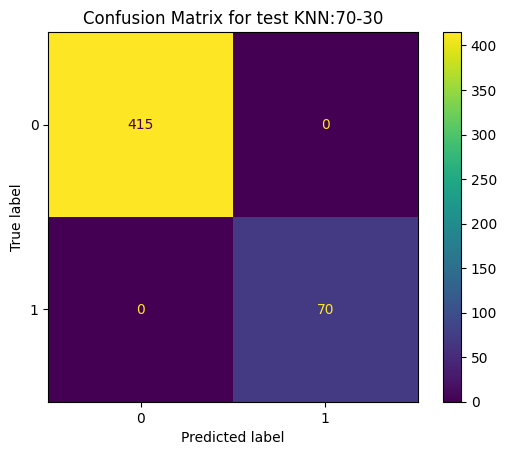

Classification Report for Training Data, KNN: 70-30:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       980
           1       1.00      1.00      1.00       151

    accuracy                           1.00      1131
   macro avg       1.00      1.00      1.00      1131
weighted avg       1.00      1.00      1.00      1131

Classification Report for Test Data, KNN: 70-30:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       415
           1       1.00      1.00      1.00        70

    accuracy                           1.00       485
   macro avg       1.00      1.00      1.00       485
weighted avg       1.00      1.00      1.00       485



In [54]:
#Set what is X and what is Y 
X4 = solid_and_liquid_data_numerical #Top 20 correlation
y4 = solid_and_liquid_data['category']

# split the data into train-test split where 30% of data will be used as test set
X4_train, X4_test, y4_train, y4_test = train_test_split(X4, y4, test_size=0.3, shuffle=True, random_state=42)

# Apply MinMaxScaler to scale the features , this is because the dataset is not uniformly distributed
scaler = MinMaxScaler()
X4_train_scaled = scaler.fit_transform(X4_train)
X4_test_scaled = scaler.transform(X4_test)

# build the k-NN regression model with k=3 for the training/test data
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X4_train_scaled, y4_train)

knn2 = KNeighborsClassifier(n_neighbors=1)
knn2.fit(X4_test_scaled, y4_test)

# Predicting for both train and test
y4_train_pred = knn.predict(X4_train_scaled)
y4_test_pred = knn2.predict(X4_test_scaled)

# Compute the training and test loss score

# NOTE: knn.score uses the same thing as accuracy_score
train_loss =  knn.score(X4_train_scaled, y4_train)
test_loss = knn2.score(X4_test_scaled, y4_test)

accuracy_train = accuracy_score(y4_train, y4_train_pred)
accuracy_test = accuracy_score(y4_test, y4_test_pred)

print('Training loss KNN: 70-30:', 1-train_loss)
print('Test loss KNN: 70-30:', 1-test_loss)
print('Training accuracy KNN: 70-30:', accuracy_train)
print('Test accuracy KNN: 70-30:', accuracy_test)

cm7 = confusion_matrix(y4_train, y4_train_pred)
display = ConfusionMatrixDisplay(confusion_matrix=cm7)
display.plot();
plt.title("Confusion Matrix for train KNN: 70-30")
plt.show()

cm8 = confusion_matrix(y4_test, y4_test_pred)
display = ConfusionMatrixDisplay(confusion_matrix=cm8)
display.plot();
plt.title("Confusion Matrix for test KNN:70-30")
plt.show()

# Classification report
print("Classification Report for Training Data, KNN: 70-30:")
print(classification_report(y4_train, y4_train_pred))

print("Classification Report for Test Data, KNN: 70-30:")
print(classification_report(y4_test, y4_test_pred))

Training loss KNN: 50-50: 0.0
Test loss KNN: 50-50: 0.0
Training accuracy KNN: 50-50: 1.0
Test accuracy KNN: 50-50: 1.0


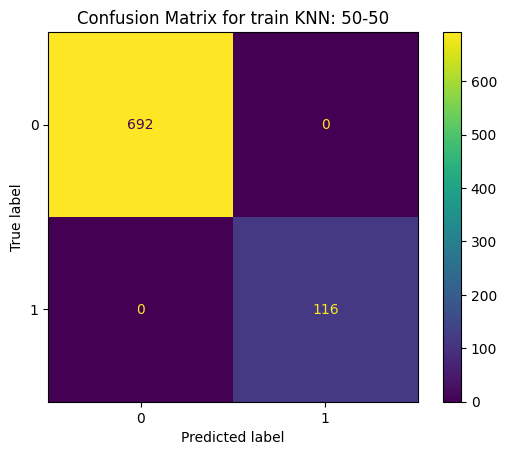

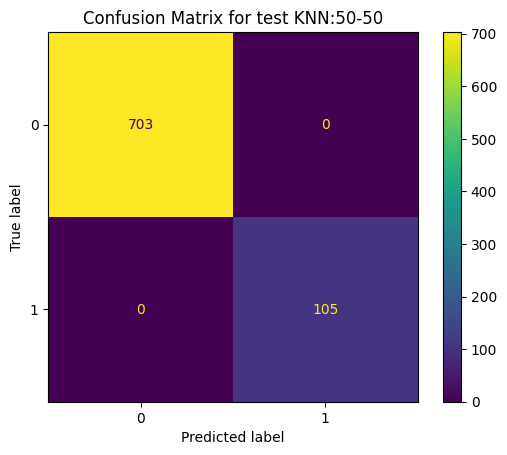

Classification Report for Training Data, KNN: 50-50:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       692
           1       1.00      1.00      1.00       116

    accuracy                           1.00       808
   macro avg       1.00      1.00      1.00       808
weighted avg       1.00      1.00      1.00       808

Classification Report for Test Data, KNN: 50-50:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       703
           1       1.00      1.00      1.00       105

    accuracy                           1.00       808
   macro avg       1.00      1.00      1.00       808
weighted avg       1.00      1.00      1.00       808



In [55]:
#Set what is X and what is Y 
X5 = solid_and_liquid_data_numerical #Top 20 correlation
y5 = solid_and_liquid_data['category']

# split the data into train-test split where 30% of data will be used as test set
X5_train, X5_test, y5_train, y5_test = train_test_split(X5, y5, test_size=0.5, shuffle=True, random_state=42)


# Apply MinMaxScaler to scale the features , this is because the dataset is not uniformly distributed
scaler = MinMaxScaler()
X5_train_scaled = scaler.fit_transform(X5_train)
X5_test_scaled = scaler.transform(X5_test)

# build the k-NN regression model with k=3 for the training/test data
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X5_train_scaled, y5_train)

knn2 = KNeighborsClassifier(n_neighbors=1)
knn2.fit(X5_test_scaled, y5_test)

# Predicting for both train and test
y5_train_pred = knn.predict(X5_train_scaled)
y5_test_pred = knn2.predict(X5_test_scaled)

# Compute the training and test loss score

# NOTE: knn.score uses the same thing as accuracy_score
train_loss =  knn.score(X5_train_scaled, y5_train)
test_loss = knn2.score(X5_test_scaled, y5_test)

accuracy_train = accuracy_score(y5_train, y5_train_pred)
accuracy_test = accuracy_score(y5_test, y5_test_pred)

print('Training loss KNN: 50-50:', 1-train_loss)
print('Test loss KNN: 50-50:', 1-test_loss)
print('Training accuracy KNN: 50-50:', accuracy_train)
print('Test accuracy KNN: 50-50:', accuracy_test)

cm9 = confusion_matrix(y5_train, y5_train_pred)
display = ConfusionMatrixDisplay(confusion_matrix=cm9)
display.plot();
plt.title("Confusion Matrix for train KNN: 50-50")
plt.show()

cm10 = confusion_matrix(y5_test, y5_test_pred)
display = ConfusionMatrixDisplay(confusion_matrix=cm10)
display.plot();
plt.title("Confusion Matrix for test KNN:50-50")
plt.show()

# Classification report
print("Classification Report for Training Data, KNN: 50-50:")
print(classification_report(y5_train, y5_train_pred))

print("Classification Report for Test Data, KNN: 50-50:")
print(classification_report(y5_test, y5_test_pred))

Training loss KNN: 30-70: 0.0
Test loss KNN: 30-70: 0.0
Training accuracy KNN: 30-70: 1.0
Test accuracy KNN: 30-70: 1.0


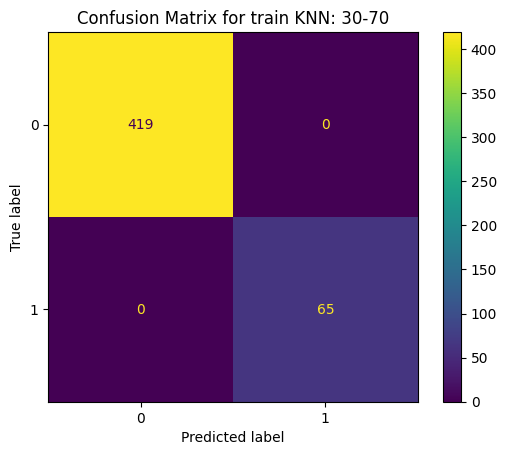

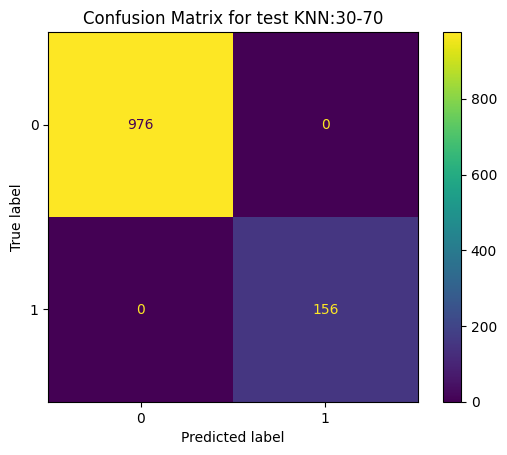

Classification Report for Training Data, KNN:30-70:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       419
           1       1.00      1.00      1.00        65

    accuracy                           1.00       484
   macro avg       1.00      1.00      1.00       484
weighted avg       1.00      1.00      1.00       484

Classification Report for Test Data, KNN:30-70:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       976
           1       1.00      1.00      1.00       156

    accuracy                           1.00      1132
   macro avg       1.00      1.00      1.00      1132
weighted avg       1.00      1.00      1.00      1132



In [56]:
#Set what is X and what is Y 
X6 = solid_and_liquid_data_numerical #Top 20 correlation
y6 = solid_and_liquid_data['category']

# split the data into train-test split where 30% of data will be used as test set
X6_train, X6_test, y6_train, y6_test = train_test_split(X6, y6, test_size=0.7, shuffle=True, random_state=42)

# Apply MinMaxScaler to scale the features , this is because the dataset is not uniformly distributed
scaler = MinMaxScaler()
X6_train_scaled = scaler.fit_transform(X6_train)
X6_test_scaled = scaler.transform(X6_test)

# build the k-NN regression model with k=3 for the training/test data
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X6_train_scaled, y6_train)

knn2 = KNeighborsClassifier(n_neighbors=1)
knn2.fit(X6_test_scaled, y6_test)

# Predicting for both train and test
y6_train_pred = knn.predict(X6_train_scaled)
y6_test_pred = knn2.predict(X6_test_scaled)

# Compute the training and test loss score

# NOTE: knn.score uses the same thing as accuracy_score
train_loss =  knn.score(X6_train_scaled, y6_train)
test_loss = knn2.score(X6_test_scaled, y6_test)

accuracy_train = accuracy_score(y6_train, y6_train_pred)
accuracy_test = accuracy_score(y6_test, y6_test_pred)

print('Training loss KNN: 30-70:', 1-train_loss)
print('Test loss KNN: 30-70:', 1-test_loss)
print('Training accuracy KNN: 30-70:', accuracy_train)
print('Test accuracy KNN: 30-70:', accuracy_test)

cm11 = confusion_matrix(y6_train, y6_train_pred)
display = ConfusionMatrixDisplay(confusion_matrix=cm11)
display.plot();
plt.title("Confusion Matrix for train KNN: 30-70")
plt.show()

cm12 = confusion_matrix(y6_test, y6_test_pred)
display = ConfusionMatrixDisplay(confusion_matrix=cm12)
display.plot();
plt.title("Confusion Matrix for test KNN:30-70")
plt.show()

# Classification report
print("Classification Report for Training Data, KNN:30-70:")
print(classification_report(y6_train, y6_train_pred))

print("Classification Report for Test Data, KNN:30-70:")
print(classification_report(y6_test, y6_test_pred))

# Neural-Network : RELU

C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


36/36 [==============================] - 0s 3ms/step


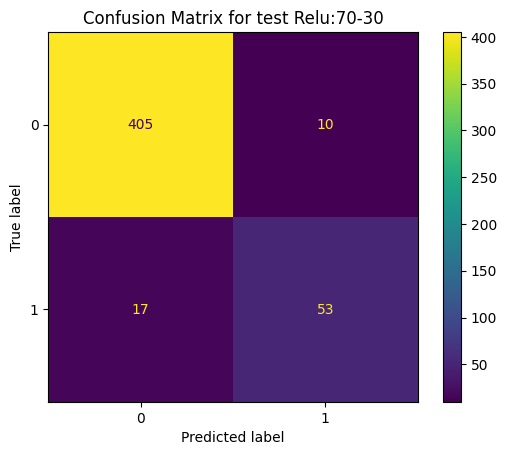

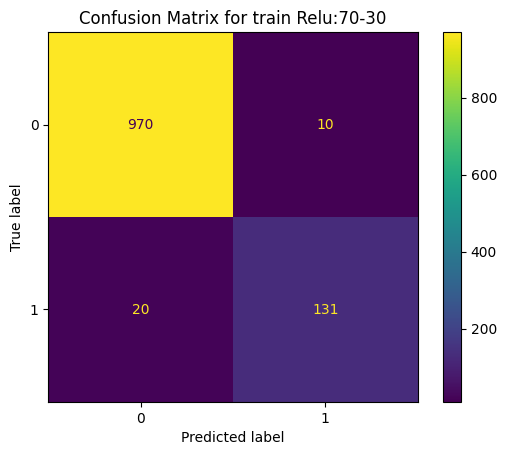

Iteration 1
Training loss Relu:70-30: 0.12186601012945175
Test loss Relu:70-30: 0.36345988512039185
Training accuracy Relu:70-30: 0.9734748005867004
Test accuracy Relu:70-30: 0.9443299174308777
F1 score Relu:70-30: 0.7969924812030075
              precision    recall  f1-score   support

      class1       0.96      0.98      0.97       415
      class2       0.84      0.76      0.80        70

    accuracy                           0.94       485
   macro avg       0.90      0.87      0.88       485
weighted avg       0.94      0.94      0.94       485



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


36/36 [==============================] - 0s 1ms/step


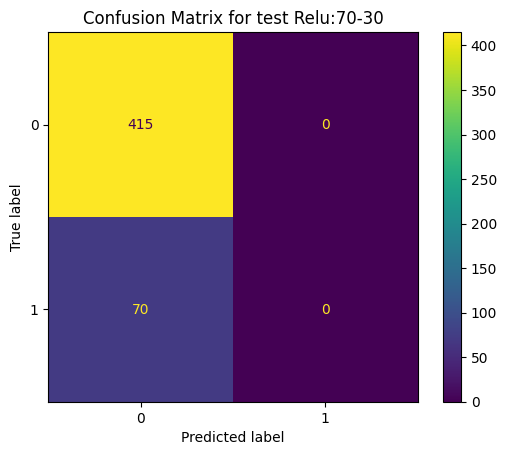

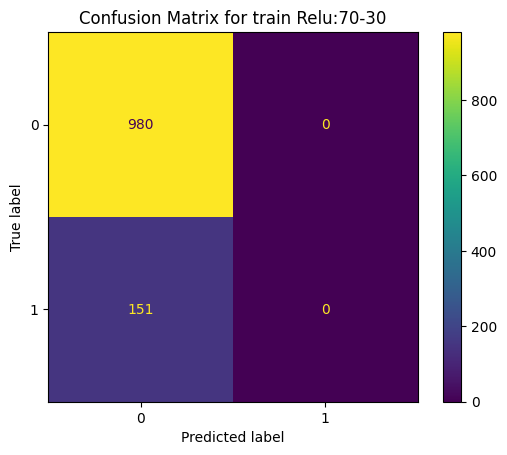

Iteration 2
Training loss Relu:70-30: 2.059387683868408
Test loss Relu:70-30: 2.22628116607666
Training accuracy Relu:70-30: 0.866489827632904
Test accuracy Relu:70-30: 0.8556700944900513
F1 score Relu:70-30: 0.0
              precision    recall  f1-score   support

      class1       0.86      1.00      0.92       415
      class2       0.00      0.00      0.00        70

    accuracy                           0.86       485
   macro avg       0.43      0.50      0.46       485
weighted avg       0.73      0.86      0.79       485



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf

36/36 [==============================] - 0s 1ms/step


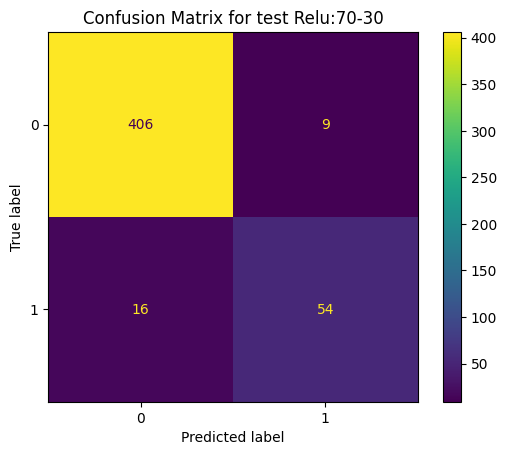

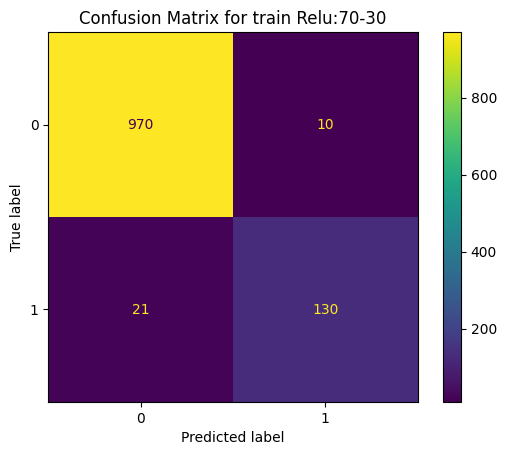

Iteration 3
Training loss Relu:70-30: 0.14849774539470673
Test loss Relu:70-30: 0.3756794333457947
Training accuracy Relu:70-30: 0.9725906252861023
Test accuracy Relu:70-30: 0.9484536051750183
F1 score Relu:70-30: 0.81203007518797
              precision    recall  f1-score   support

      class1       0.96      0.98      0.97       415
      class2       0.86      0.77      0.81        70

    accuracy                           0.95       485
   macro avg       0.91      0.87      0.89       485
weighted avg       0.95      0.95      0.95       485



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


36/36 [==============================] - 0s 1ms/step


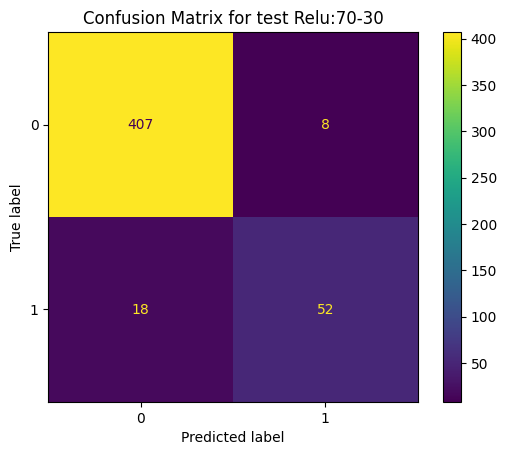

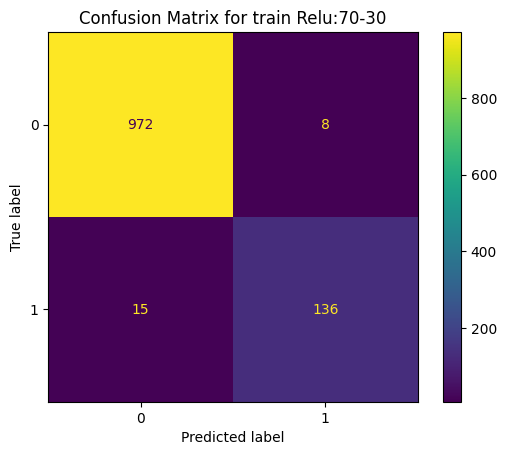

Iteration 4
Training loss Relu:70-30: 0.07852742075920105
Test loss Relu:70-30: 0.28058335185050964
Training accuracy Relu:70-30: 0.9796640276908875
Test accuracy Relu:70-30: 0.946391761302948
F1 score Relu:70-30: 0.8
              precision    recall  f1-score   support

      class1       0.96      0.98      0.97       415
      class2       0.87      0.74      0.80        70

    accuracy                           0.95       485
   macro avg       0.91      0.86      0.88       485
weighted avg       0.94      0.95      0.94       485



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


36/36 [==============================] - 0s 1ms/step


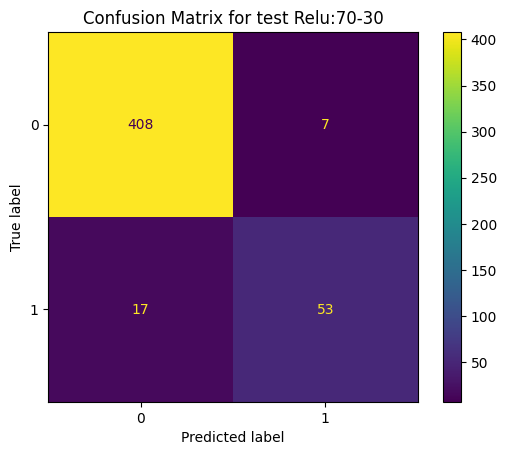

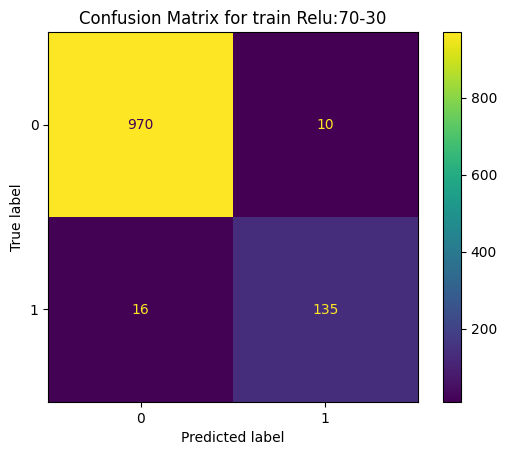

Iteration 5
Training loss Relu:70-30: 0.10410959273576736
Test loss Relu:70-30: 0.41150525212287903
Training accuracy Relu:70-30: 0.977011501789093
Test accuracy Relu:70-30: 0.9505154490470886
F1 score Relu:70-30: 0.8153846153846154
              precision    recall  f1-score   support

      class1       0.96      0.98      0.97       415
      class2       0.88      0.76      0.82        70

    accuracy                           0.95       485
   macro avg       0.92      0.87      0.89       485
weighted avg       0.95      0.95      0.95       485



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


36/36 [==============================] - 0s 1ms/step


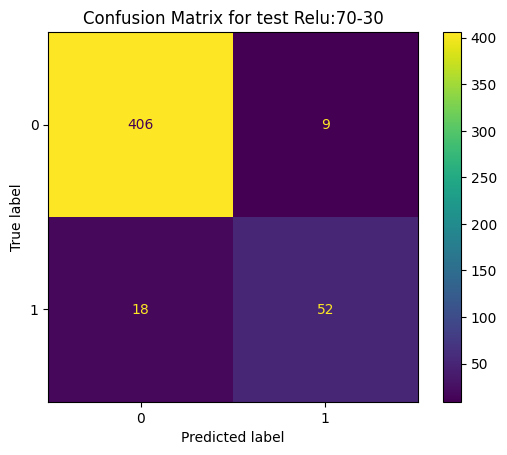

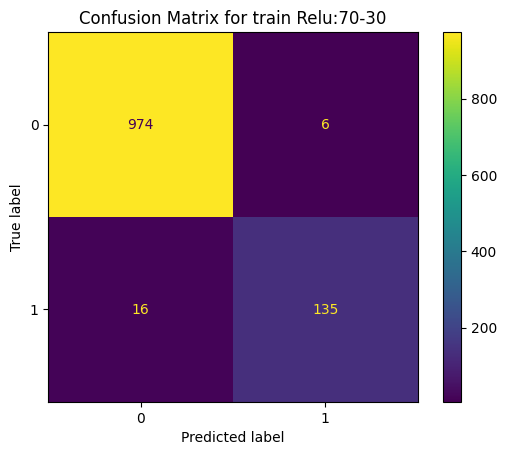

Iteration 6
Training loss Relu:70-30: 0.10049477964639664
Test loss Relu:70-30: 0.32953932881355286
Training accuracy Relu:70-30: 0.9805482029914856
Test accuracy Relu:70-30: 0.9443299174308777
F1 score Relu:70-30: 0.7938931297709924
              precision    recall  f1-score   support

      class1       0.96      0.98      0.97       415
      class2       0.85      0.74      0.79        70

    accuracy                           0.94       485
   macro avg       0.91      0.86      0.88       485
weighted avg       0.94      0.94      0.94       485



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


36/36 [==============================] - 0s 1ms/step


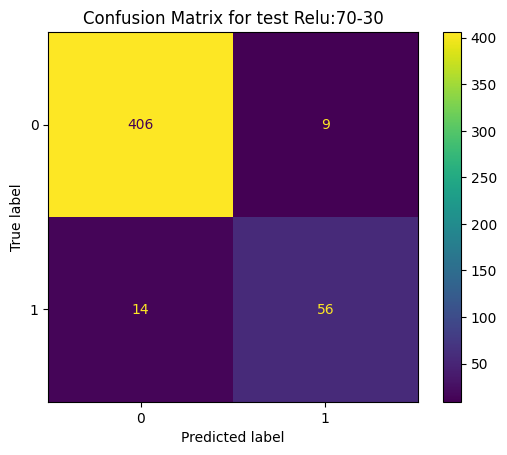

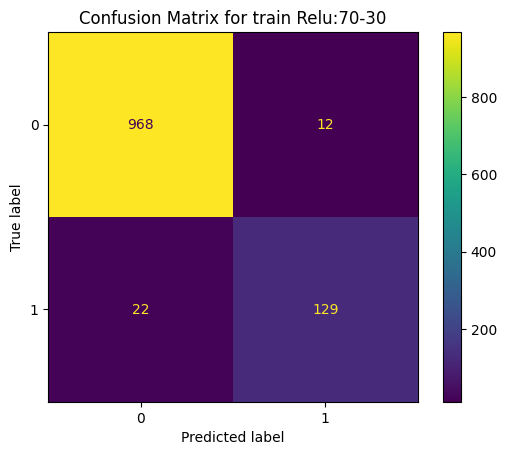

Iteration 7
Training loss Relu:70-30: 0.1188235878944397
Test loss Relu:70-30: 0.2593230903148651
Training accuracy Relu:70-30: 0.9699380993843079
Test accuracy Relu:70-30: 0.9525772929191589
F1 score Relu:70-30: 0.8296296296296297
              precision    recall  f1-score   support

      class1       0.97      0.98      0.97       415
      class2       0.86      0.80      0.83        70

    accuracy                           0.95       485
   macro avg       0.91      0.89      0.90       485
weighted avg       0.95      0.95      0.95       485



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


36/36 [==============================] - 0s 1ms/step


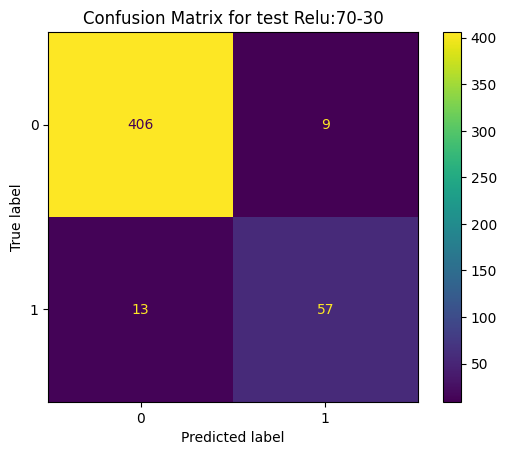

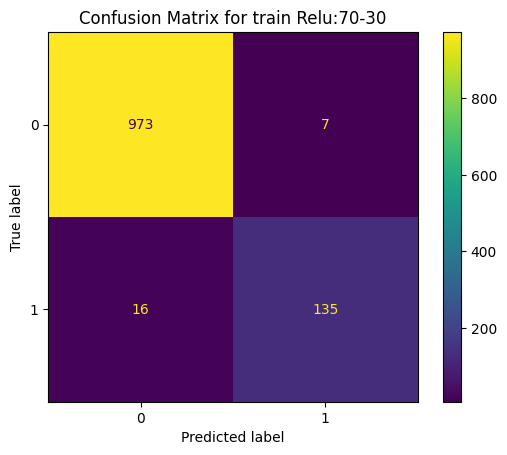

Iteration 8
Training loss Relu:70-30: 0.09229505062103271
Test loss Relu:70-30: 0.31094545125961304
Training accuracy Relu:70-30: 0.9796640276908875
Test accuracy Relu:70-30: 0.954639196395874
F1 score Relu:70-30: 0.8382352941176471
              precision    recall  f1-score   support

      class1       0.97      0.98      0.97       415
      class2       0.86      0.81      0.84        70

    accuracy                           0.95       485
   macro avg       0.92      0.90      0.91       485
weighted avg       0.95      0.95      0.95       485



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


36/36 [==============================] - 0s 2ms/step


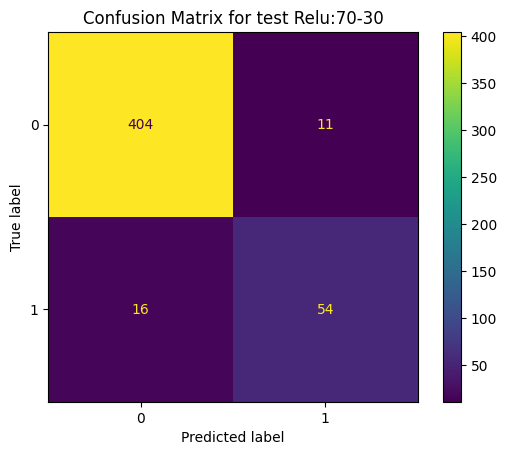

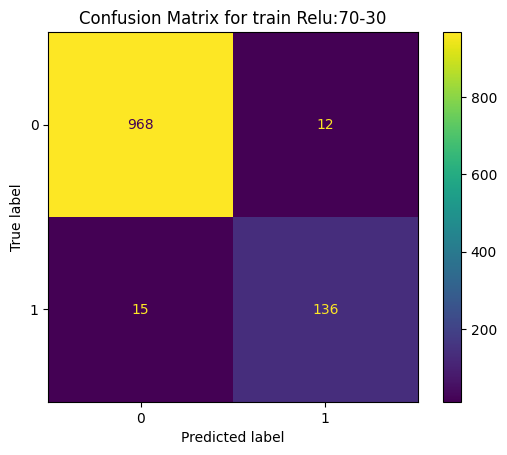

Iteration 9
Training loss Relu:70-30: 0.08577261120080948
Test loss Relu:70-30: 0.41367363929748535
Training accuracy Relu:70-30: 0.9761273264884949
Test accuracy Relu:70-30: 0.9443299174308777
F1 score Relu:70-30: 0.8
              precision    recall  f1-score   support

      class1       0.96      0.97      0.97       415
      class2       0.83      0.77      0.80        70

    accuracy                           0.94       485
   macro avg       0.90      0.87      0.88       485
weighted avg       0.94      0.94      0.94       485



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


36/36 [==============================] - 0s 1ms/step


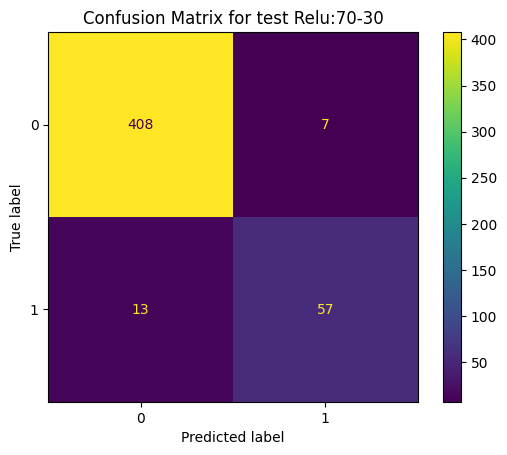

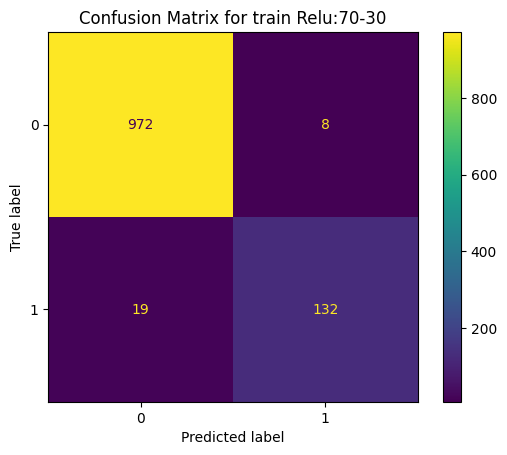

Iteration 10
Training loss Relu:70-30: 0.11299451440572739
Test loss Relu:70-30: 0.25496193766593933
Training accuracy Relu:70-30: 0.9761273264884949
Test accuracy Relu:70-30: 0.9587628841400146
F1 score Relu:70-30: 0.8507462686567163
              precision    recall  f1-score   support

      class1       0.97      0.98      0.98       415
      class2       0.89      0.81      0.85        70

    accuracy                           0.96       485
   macro avg       0.93      0.90      0.91       485
weighted avg       0.96      0.96      0.96       485

Average Training loss Relu:70-30: 0.3022768996655941
Average Test loss Relu:70-30: 0.5225952535867691
Average Training accuracy Relu:70-30: 0.9651635766029358
Average Test accuracy Relu:70-30: 0.9400000035762787
Average F1 score Relu:70-30: 0.7336911493950578


In [57]:
# Set what is X and what is Y 
X7 = solid_and_liquid_data_numerical #Top 20 correlation
y7 = solid_and_liquid_data['category']

# split the data into train-test split where 30% of data will be used as the test set
X7_train, X7_test, y7_train, y7_test = train_test_split(X7, y7, test_size=0.3, shuffle=True, random_state=42)

# Apply MinMaxScaler to scale the features, this is because the dataset is not uniformly distributed
scaler = MinMaxScaler()
X7_train_scaled = scaler.fit_transform(X7_train)
X7_test_scaled = scaler.transform(X7_test)

train_loss_total = 0.0
test_loss_total = 0.0
train_accuracy_total = 0.0
test_accuracy_total = 0.0
num_iterations = 10
f1_score_total = 0.0

for i in range(num_iterations):
    # Build a neural network model with sigmoid activation function in the output layer
    model = Sequential()
    model.add(Dense(16, activation='relu', input_shape=(X7_train_scaled.shape[1],)))
    model.add(Dense(8, activation='relu'))
    model.add(Dense(1, activation='relu'))

    # Compile the model
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    # Fit the model to the training data
    history = model.fit(X7_train_scaled, y7_train, epochs=50, batch_size=32, validation_split=0.2, verbose=0)

    # Evaluate the model on the training and test data
    train_loss, train_accuracy = model.evaluate(X7_train_scaled, y7_train, verbose=0)
    test_loss, test_accuracy = model.evaluate(X7_test_scaled, y7_test, verbose=0)

    train_loss_total += train_loss
    test_loss_total += test_loss
    train_accuracy_total += train_accuracy
    test_accuracy_total += test_accuracy
    
    
    # Evaluate the model on the test data
    y7_test_pred = model.predict(X7_test_scaled)
    y7_test_pred_binary = np.where(y7_test_pred > 0.5, 1, 0)

    # Compute confusion matrix
    cm13 = confusion_matrix(y7_test, y7_test_pred_binary)

    # Evaluate the model on the test data
    y7_train_pred = model.predict(X7_train_scaled)
    y7_train_pred_binary = np.where(y7_train_pred > 0.5, 1, 0)
    
    # Compute confusion matrix
    cm14 = confusion_matrix(y7_train, y7_train_pred_binary)

    # Display confusion matrix
    display = ConfusionMatrixDisplay(confusion_matrix=cm13, display_labels=['0', '1'])
    display.plot()
    plt.title("Confusion Matrix for test Relu:70-30")
    plt.show()

    display2 = ConfusionMatrixDisplay(confusion_matrix=cm14, display_labels=['0', '1'])
    display2.plot()
    plt.title("Confusion Matrix for train Relu:70-30")
    plt.show()
    
    f1 = f1_score(y7_test, y7_test_pred_binary)
    f1_score_total += f1


    print('Iteration', i+1)
    print('Training loss Relu:70-30:', train_loss)
    print('Test loss Relu:70-30:', test_loss)
    print('Training accuracy Relu:70-30:', train_accuracy)
    print('Test accuracy Relu:70-30:', test_accuracy)
    print('F1 score Relu:70-30:', f1)
    
    # Calculate precision, recall, and F1-score
    report = classification_report(y7_test, y7_test_pred_binary, target_names=['class1', 'class2'])
    print(report)

# Calculate the averages
avg_train_loss = train_loss_total / num_iterations
avg_test_loss = test_loss_total / num_iterations
avg_train_accuracy = train_accuracy_total / num_iterations
avg_test_accuracy = test_accuracy_total / num_iterations
avg_f1_score = f1_score_total/ num_iterations

print('Average Training loss Relu:70-30:', avg_train_loss)
print('Average Test loss Relu:70-30:', avg_test_loss)
print('Average Training accuracy Relu:70-30:', avg_train_accuracy)
print('Average Test accuracy Relu:70-30:', avg_test_accuracy)
print('Average F1 score Relu:70-30:', avg_f1_score)
          


C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


26/26 [==============================] - 0s 4ms/step


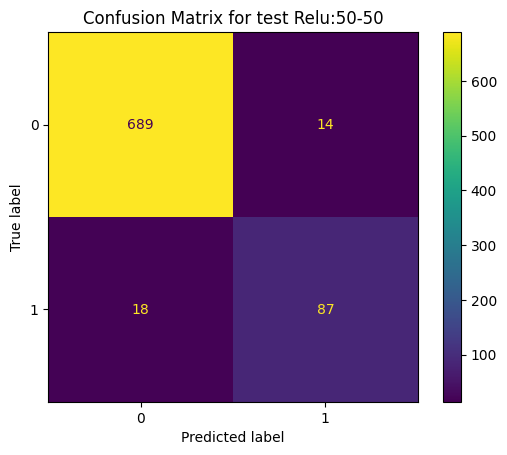

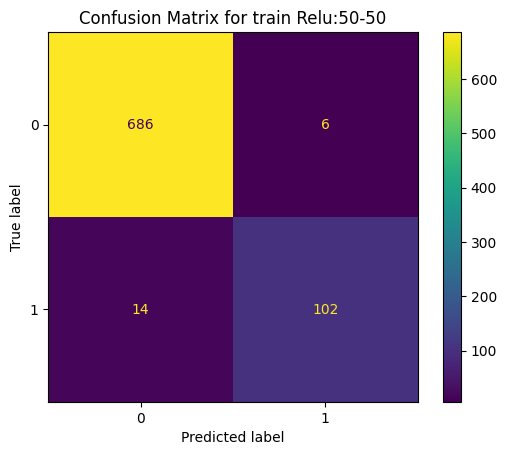

Iteration 1
Training loss Relu:50-50: 0.12956643104553223
Test loss Relu:50-50: 0.307558536529541
Training accuracy Relu:50-50: 0.9752475023269653
Test accuracy Relu:50-50: 0.9603960514068604
F1 score Relu:50-50: 0.8446601941747574
              precision    recall  f1-score   support

      class1       0.97      0.98      0.98       703
      class2       0.86      0.83      0.84       105

    accuracy                           0.96       808
   macro avg       0.92      0.90      0.91       808
weighted avg       0.96      0.96      0.96       808



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


26/26 [==============================] - 0s 1ms/step


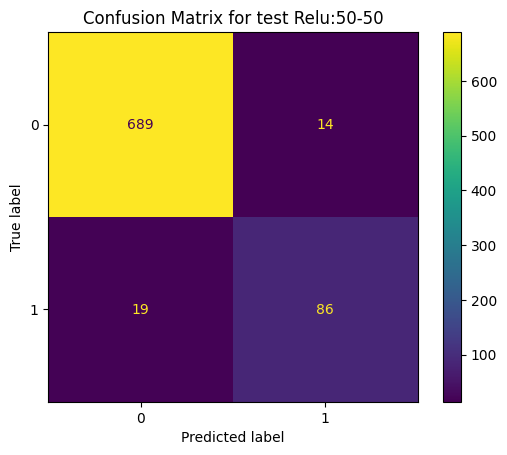

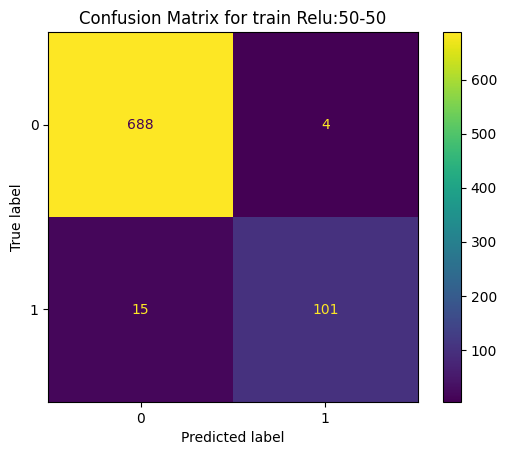

Iteration 2
Training loss Relu:50-50: 0.15627430379390717
Test loss Relu:50-50: 0.2717266082763672
Training accuracy Relu:50-50: 0.9764851331710815
Test accuracy Relu:50-50: 0.9591584205627441
F1 score Relu:50-50: 0.8390243902439023
              precision    recall  f1-score   support

      class1       0.97      0.98      0.98       703
      class2       0.86      0.82      0.84       105

    accuracy                           0.96       808
   macro avg       0.92      0.90      0.91       808
weighted avg       0.96      0.96      0.96       808



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


26/26 [==============================] - 0s 5ms/step


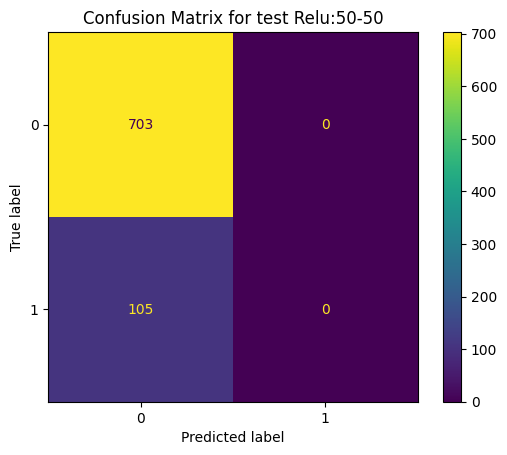

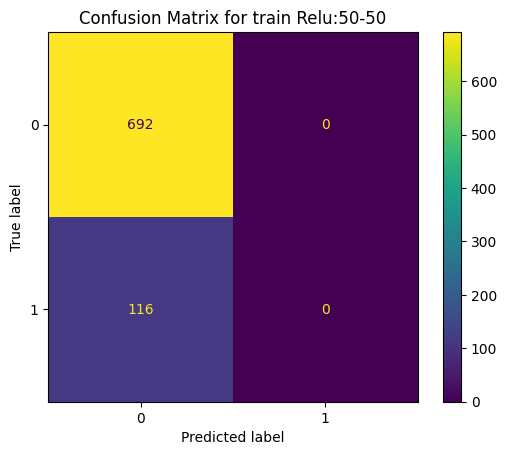

Iteration 3
Training loss Relu:50-50: 2.214473009109497
Test loss Relu:50-50: 2.0044806003570557
Training accuracy Relu:50-50: 0.8564356565475464
Test accuracy Relu:50-50: 0.8700494766235352
F1 score Relu:50-50: 0.0
              precision    recall  f1-score   support

      class1       0.87      1.00      0.93       703
      class2       0.00      0.00      0.00       105

    accuracy                           0.87       808
   macro avg       0.44      0.50      0.47       808
weighted avg       0.76      0.87      0.81       808



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf

26/26 [==============================] - 0s 1ms/step


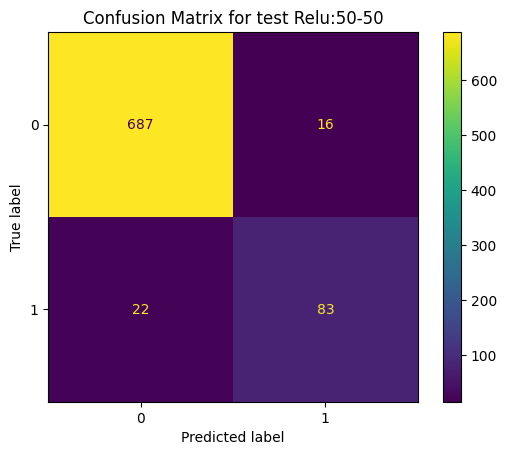

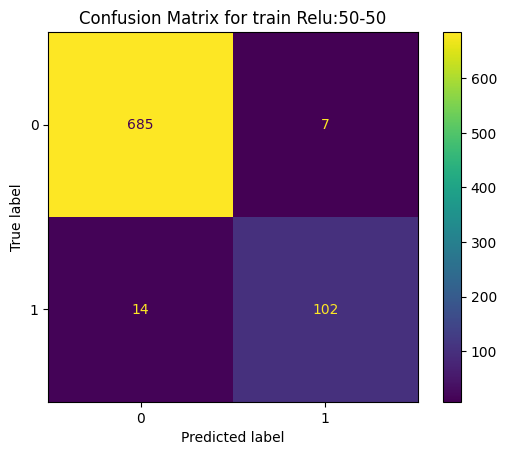

Iteration 4
Training loss Relu:50-50: 0.1134793683886528
Test loss Relu:50-50: 0.2820749282836914
Training accuracy Relu:50-50: 0.9740098714828491
Test accuracy Relu:50-50: 0.9529703259468079
F1 score Relu:50-50: 0.8137254901960784
              precision    recall  f1-score   support

      class1       0.97      0.98      0.97       703
      class2       0.84      0.79      0.81       105

    accuracy                           0.95       808
   macro avg       0.90      0.88      0.89       808
weighted avg       0.95      0.95      0.95       808



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


26/26 [==============================] - 0s 1ms/step


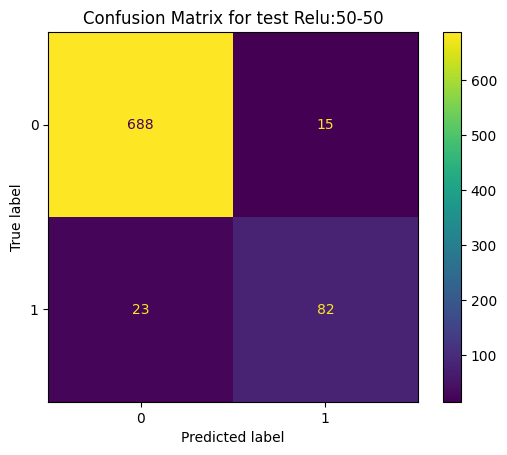

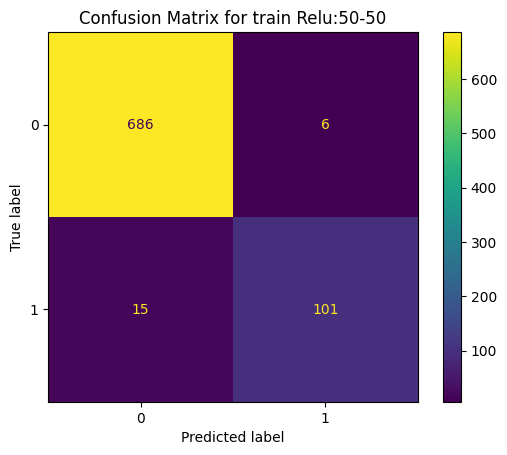

Iteration 5
Training loss Relu:50-50: 0.16702990233898163
Test loss Relu:50-50: 0.29966986179351807
Training accuracy Relu:50-50: 0.9740098714828491
Test accuracy Relu:50-50: 0.9529703259468079
F1 score Relu:50-50: 0.8118811881188118
              precision    recall  f1-score   support

      class1       0.97      0.98      0.97       703
      class2       0.85      0.78      0.81       105

    accuracy                           0.95       808
   macro avg       0.91      0.88      0.89       808
weighted avg       0.95      0.95      0.95       808



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


26/26 [==============================] - 0s 1ms/step


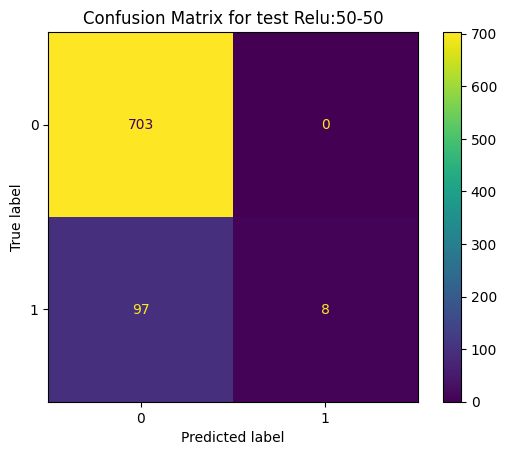

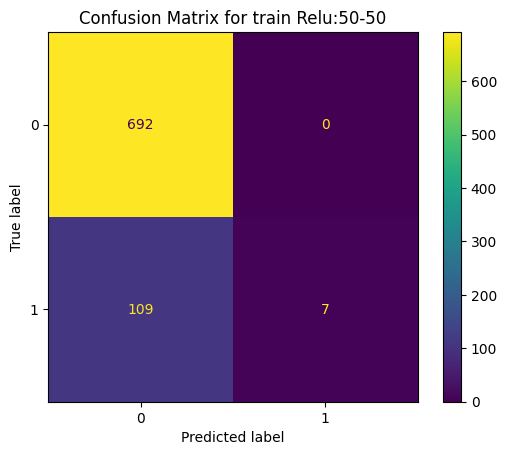

Iteration 6
Training loss Relu:50-50: 2.0323143005371094
Test loss Relu:50-50: 1.7851437330245972
Training accuracy Relu:50-50: 0.8650990128517151
Test accuracy Relu:50-50: 0.8799505233764648
F1 score Relu:50-50: 0.14159292035398233
              precision    recall  f1-score   support

      class1       0.88      1.00      0.94       703
      class2       1.00      0.08      0.14       105

    accuracy                           0.88       808
   macro avg       0.94      0.54      0.54       808
weighted avg       0.89      0.88      0.83       808



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


26/26 [==============================] - 0s 1ms/step


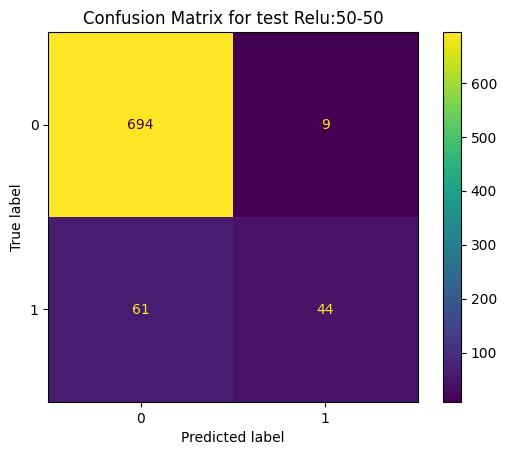

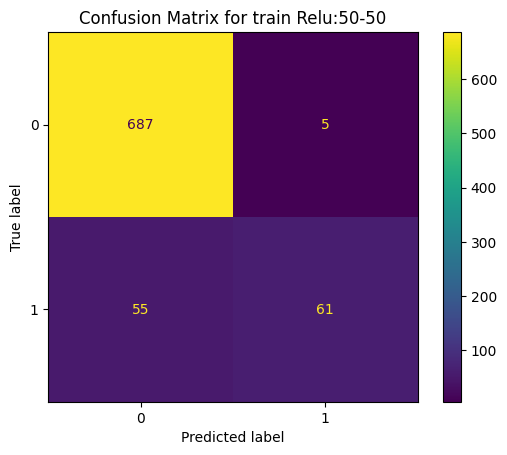

Iteration 7
Training loss Relu:50-50: 0.2897666394710541
Test loss Relu:50-50: 0.4217427670955658
Training accuracy Relu:50-50: 0.9257425665855408
Test accuracy Relu:50-50: 0.9133663177490234
F1 score Relu:50-50: 0.5569620253164557
              precision    recall  f1-score   support

      class1       0.92      0.99      0.95       703
      class2       0.83      0.42      0.56       105

    accuracy                           0.91       808
   macro avg       0.87      0.70      0.75       808
weighted avg       0.91      0.91      0.90       808



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


26/26 [==============================] - 0s 2ms/step


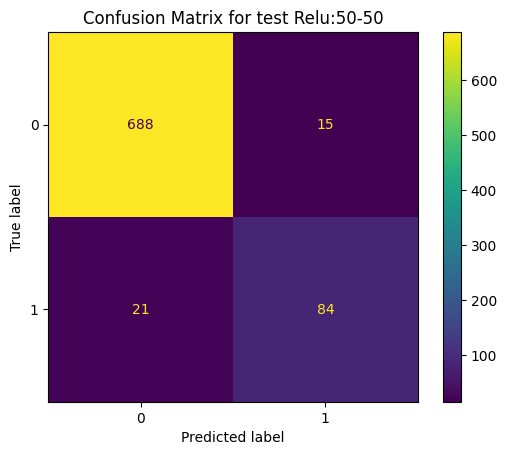

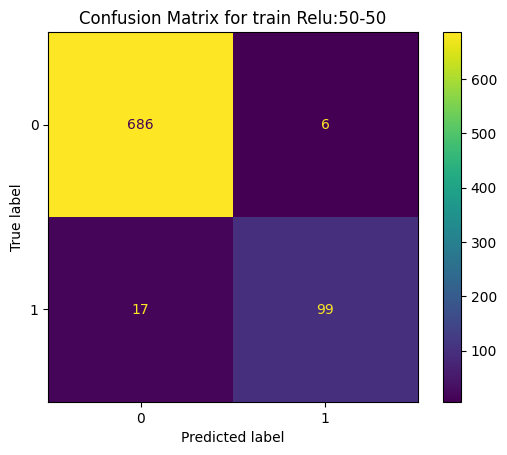

Iteration 8
Training loss Relu:50-50: 0.13213837146759033
Test loss Relu:50-50: 0.27814820408821106
Training accuracy Relu:50-50: 0.9715346693992615
Test accuracy Relu:50-50: 0.9554455280303955
F1 score Relu:50-50: 0.823529411764706
              precision    recall  f1-score   support

      class1       0.97      0.98      0.97       703
      class2       0.85      0.80      0.82       105

    accuracy                           0.96       808
   macro avg       0.91      0.89      0.90       808
weighted avg       0.95      0.96      0.95       808



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


26/26 [==============================] - 0s 1ms/step


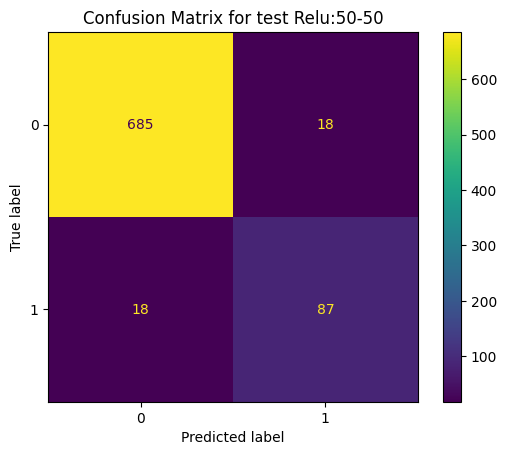

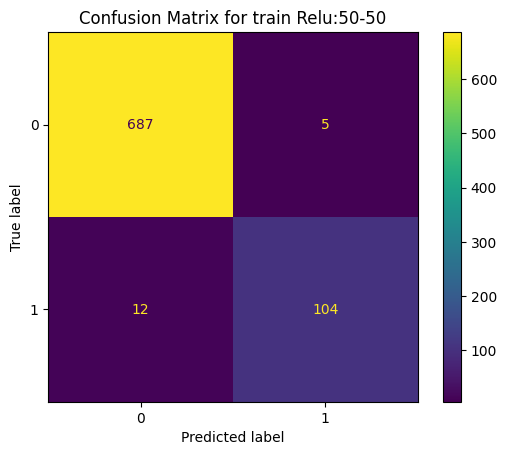

Iteration 9
Training loss Relu:50-50: 0.09864429384469986
Test loss Relu:50-50: 0.29803740978240967
Training accuracy Relu:50-50: 0.978960394859314
Test accuracy Relu:50-50: 0.9554455280303955
F1 score Relu:50-50: 0.8285714285714286
              precision    recall  f1-score   support

      class1       0.97      0.97      0.97       703
      class2       0.83      0.83      0.83       105

    accuracy                           0.96       808
   macro avg       0.90      0.90      0.90       808
weighted avg       0.96      0.96      0.96       808



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


26/26 [==============================] - 0s 1ms/step


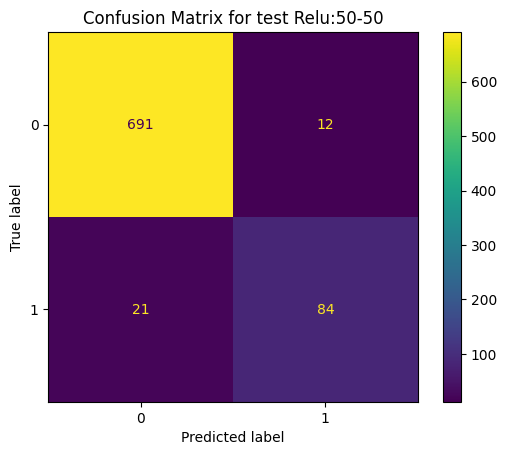

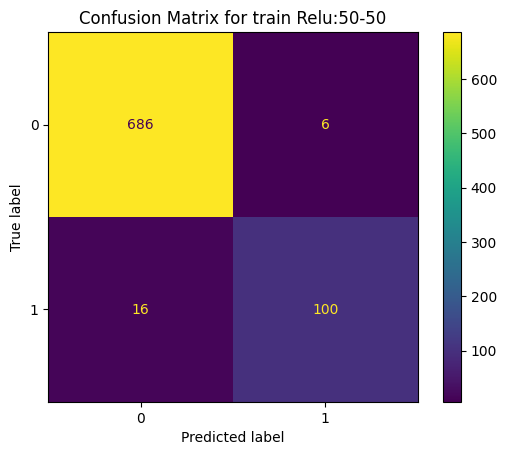

Iteration 10
Training loss Relu:50-50: 0.17682895064353943
Test loss Relu:50-50: 0.2765570878982544
Training accuracy Relu:50-50: 0.9727723002433777
Test accuracy Relu:50-50: 0.9591584205627441
F1 score Relu:50-50: 0.8358208955223881
              precision    recall  f1-score   support

      class1       0.97      0.98      0.98       703
      class2       0.88      0.80      0.84       105

    accuracy                           0.96       808
   macro avg       0.92      0.89      0.91       808
weighted avg       0.96      0.96      0.96       808

Average Training loss Relu:50-50: 0.5510515570640564
Average Test loss Relu:50-50: 0.6225139737129212
Average Training accuracy Relu:50-50: 0.9470296978950501
Average Test accuracy Relu:50-50: 0.9358910918235779
Average F1 score Relu:50-50: 0.6495767944262509


In [58]:
# Set what is X and what is Y 
X8 = solid_and_liquid_data_numerical #Top 20 correlation
y8 = solid_and_liquid_data['category']

# split the data into train-test split where 30% of data will be used as the test set
X8_train, X8_test, y8_train, y8_test = train_test_split(X8, y8, test_size=0.5, shuffle=True, random_state=42)

# Apply MinMaxScaler to scale the features, this is because the dataset is not uniformly distributed
scaler = MinMaxScaler()
X8_train_scaled = scaler.fit_transform(X8_train)
X8_test_scaled = scaler.transform(X8_test)

train_loss_total = 0.0
test_loss_total = 0.0
train_accuracy_total = 0.0
test_accuracy_total = 0.0
num_iterations = 10
f1_score_total = 0.0

for i in range(num_iterations):
    # Build a neural network model with sigmoid activation function in the output layer
    model = Sequential()
    model.add(Dense(16, activation='relu', input_shape=(X8_train_scaled.shape[1],)))
    model.add(Dense(8, activation='relu'))
    model.add(Dense(1, activation='relu'))

    # Compile the model
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    # Fit the model to the training data
    history = model.fit(X8_train_scaled, y8_train, epochs=50, batch_size=32, validation_split=0.2, verbose=0)

    # Evaluate the model on the training and test data
    train_loss, train_accuracy = model.evaluate(X8_train_scaled, y8_train, verbose=0)
    test_loss, test_accuracy = model.evaluate(X8_test_scaled, y8_test, verbose=0)

    train_loss_total += train_loss
    test_loss_total += test_loss
    train_accuracy_total += train_accuracy
    test_accuracy_total += test_accuracy


    # Evaluate the model on the test data
    y8_test_pred = model.predict(X8_test_scaled)
    y8_test_pred_binary = np.where(y8_test_pred > 0.5, 1, 0)
    
    f1 = f1_score(y8_test, y8_test_pred_binary)
    f1_score_total += f1

    # Compute confusion matrix
    cm15 = confusion_matrix(y8_test, y8_test_pred_binary)

    # Evaluate the model on the test data
    y8_train_pred = model.predict(X8_train_scaled)
    y8_train_pred_binary = np.where(y8_train_pred > 0.5, 1, 0)

    # Compute confusion matrix
    cm16 = confusion_matrix(y8_train, y8_train_pred_binary)

    # Display confusion matrix
    display = ConfusionMatrixDisplay(confusion_matrix=cm15, display_labels=['0', '1'])
    display.plot()
    plt.title("Confusion Matrix for test Relu:50-50")
    plt.show()
    display2 = ConfusionMatrixDisplay(confusion_matrix=cm16, display_labels=['0', '1'])
    display2.plot()
    plt.title("Confusion Matrix for train Relu:50-50")
    plt.show()


    print('Iteration', i+1)
    print('Training loss Relu:50-50:', train_loss)
    print('Test loss Relu:50-50:', test_loss)
    print('Training accuracy Relu:50-50:', train_accuracy)
    print('Test accuracy Relu:50-50:', test_accuracy)
    print('F1 score Relu:50-50:', f1)

    # Calculate precision, recall, and F1-score
    report = classification_report(y8_test, y8_test_pred_binary, target_names=['class1', 'class2'])
    print(report)

# Calculate the averages
avg_train_loss = train_loss_total / num_iterations
avg_test_loss = test_loss_total / num_iterations
avg_train_accuracy = train_accuracy_total / num_iterations
avg_test_accuracy = test_accuracy_total / num_iterations
avg_f1_score = f1_score_total/ num_iterations

print('Average Training loss Relu:50-50:', avg_train_loss)
print('Average Test loss Relu:50-50:', avg_test_loss)
print('Average Training accuracy Relu:50-50:', avg_train_accuracy)
print('Average Test accuracy Relu:50-50:', avg_test_accuracy)
print('Average F1 score Relu:50-50:', avg_f1_score)
          


C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


16/16 [==============================] - 0s 2ms/step


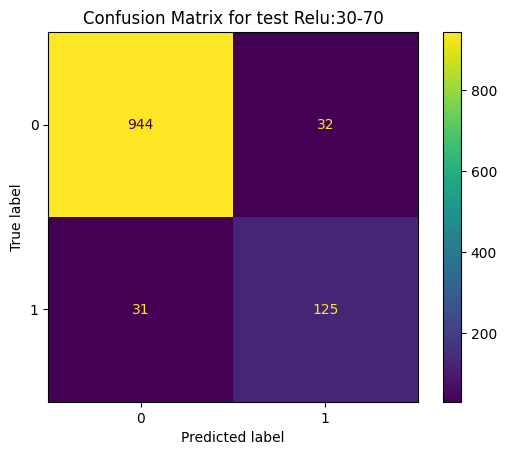

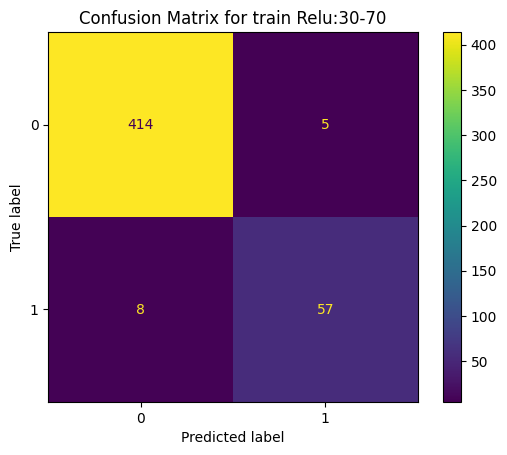

Iteration 1
Training loss Relu:30-70: 0.12351521849632263
Test loss Relu:30-70: 0.3473440706729889
Training accuracy Relu:30-70: 0.9731404781341553
Test accuracy Relu:30-70: 0.9443463087081909
F1 score Relu:30-70: 0.7987220447284346
              precision    recall  f1-score   support

      class1       0.97      0.97      0.97       976
      class2       0.80      0.80      0.80       156

    accuracy                           0.94      1132
   macro avg       0.88      0.88      0.88      1132
weighted avg       0.94      0.94      0.94      1132



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


16/16 [==============================] - 0s 1ms/step


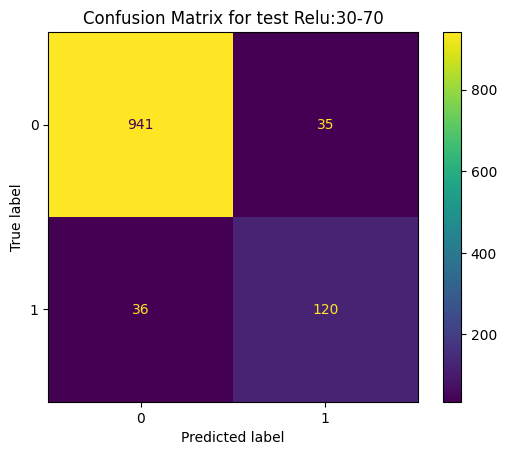

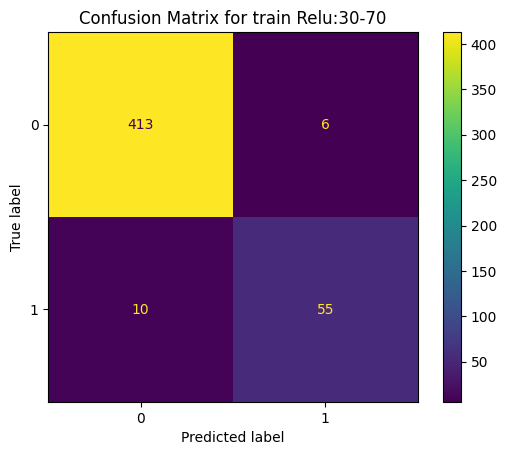

Iteration 2
Training loss Relu:30-70: 0.18755494058132172
Test loss Relu:30-70: 0.41290655732154846
Training accuracy Relu:30-70: 0.9669421315193176
Test accuracy Relu:30-70: 0.9372791647911072
F1 score Relu:30-70: 0.7717041800643087
              precision    recall  f1-score   support

      class1       0.96      0.96      0.96       976
      class2       0.77      0.77      0.77       156

    accuracy                           0.94      1132
   macro avg       0.87      0.87      0.87      1132
weighted avg       0.94      0.94      0.94      1132



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


16/16 [==============================] - 0s 1ms/step


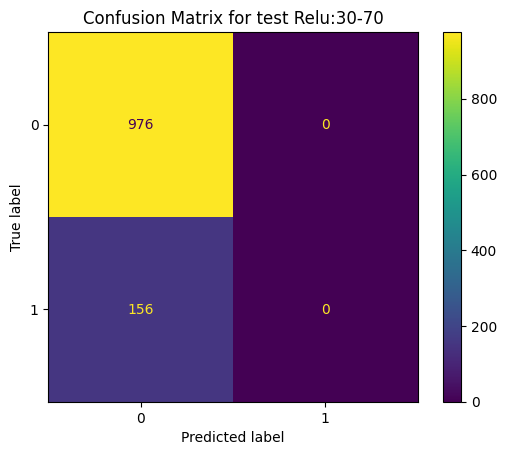

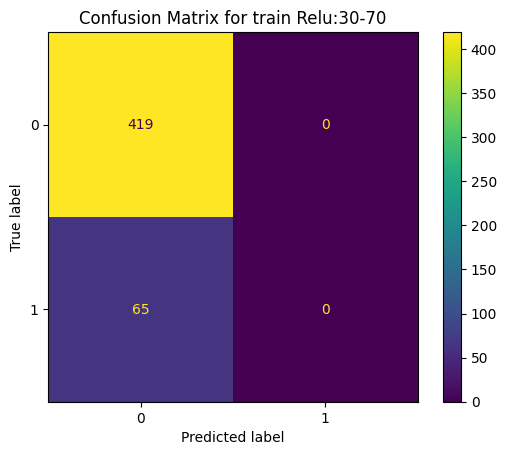

Iteration 3
Training loss Relu:30-70: 2.0715322494506836
Test loss Relu:30-70: 2.1262669563293457
Training accuracy Relu:30-70: 0.8657024502754211
Test accuracy Relu:30-70: 0.8621907830238342
F1 score Relu:30-70: 0.0
              precision    recall  f1-score   support

      class1       0.86      1.00      0.93       976
      class2       0.00      0.00      0.00       156

    accuracy                           0.86      1132
   macro avg       0.43      0.50      0.46      1132
weighted avg       0.74      0.86      0.80      1132



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf

16/16 [==============================] - 0s 1ms/step


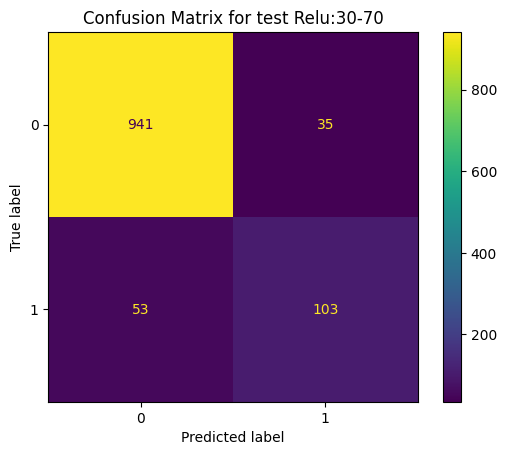

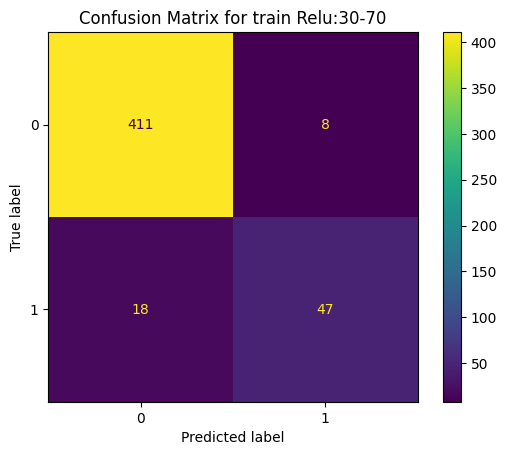

Iteration 4
Training loss Relu:30-70: 0.15420280396938324
Test loss Relu:30-70: 0.3549589216709137
Training accuracy Relu:30-70: 0.9462810158729553
Test accuracy Relu:30-70: 0.9222614765167236
F1 score Relu:30-70: 0.7006802721088434
              precision    recall  f1-score   support

      class1       0.95      0.96      0.96       976
      class2       0.75      0.66      0.70       156

    accuracy                           0.92      1132
   macro avg       0.85      0.81      0.83      1132
weighted avg       0.92      0.92      0.92      1132



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


16/16 [==============================] - 0s 1ms/step


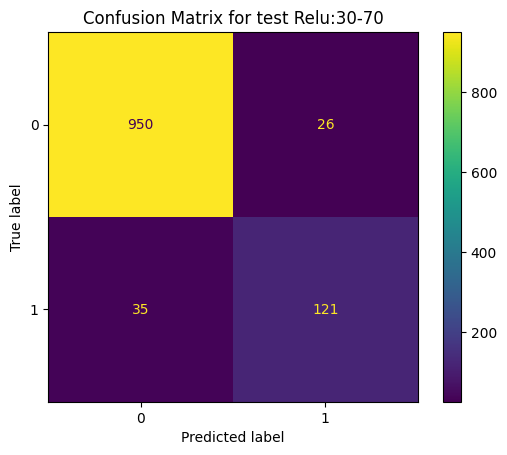

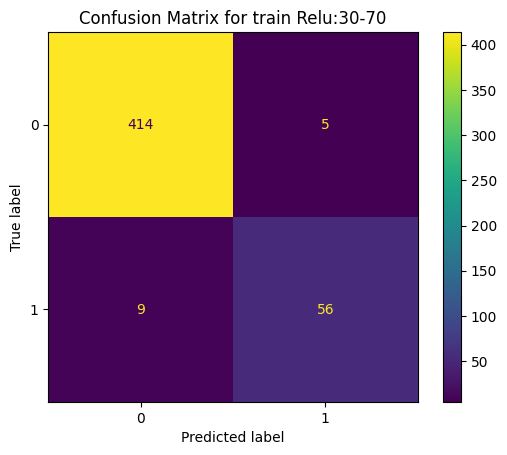

Iteration 5
Training loss Relu:30-70: 0.08883950859308243
Test loss Relu:30-70: 0.33050382137298584
Training accuracy Relu:30-70: 0.9710744023323059
Test accuracy Relu:30-70: 0.9461130499839783
F1 score Relu:30-70: 0.7986798679867986
              precision    recall  f1-score   support

      class1       0.96      0.97      0.97       976
      class2       0.82      0.78      0.80       156

    accuracy                           0.95      1132
   macro avg       0.89      0.87      0.88      1132
weighted avg       0.94      0.95      0.95      1132



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


16/16 [==============================] - 0s 3ms/step


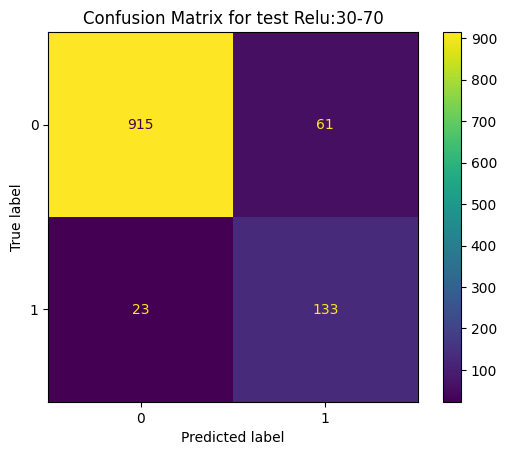

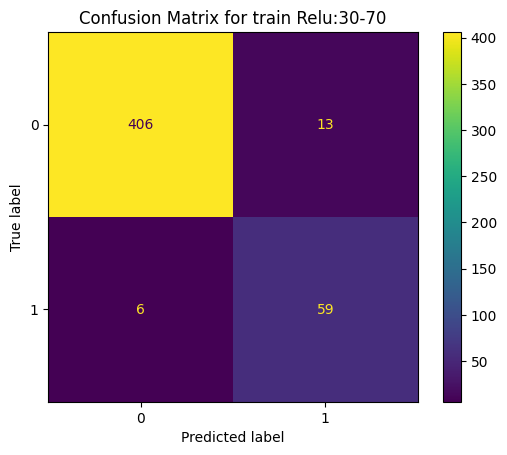

Iteration 6
Training loss Relu:30-70: 0.13524699211120605
Test loss Relu:30-70: 0.42879417538642883
Training accuracy Relu:30-70: 0.96074378490448
Test accuracy Relu:30-70: 0.9257950782775879
F1 score Relu:30-70: 0.7600000000000001
              precision    recall  f1-score   support

      class1       0.98      0.94      0.96       976
      class2       0.69      0.85      0.76       156

    accuracy                           0.93      1132
   macro avg       0.83      0.90      0.86      1132
weighted avg       0.94      0.93      0.93      1132



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


16/16 [==============================] - 0s 2ms/step


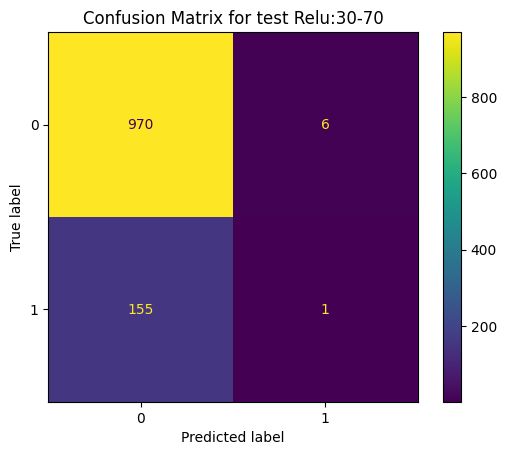

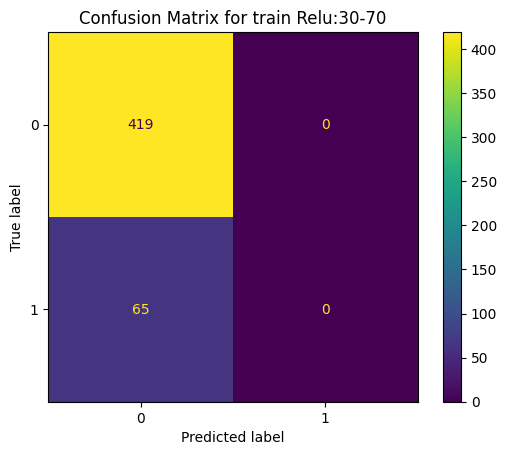

Iteration 7
Training loss Relu:30-70: 2.0715322494506836
Test loss Relu:30-70: 2.1936938762664795
Training accuracy Relu:30-70: 0.8657024502754211
Test accuracy Relu:30-70: 0.8577738404273987
F1 score Relu:30-70: 0.012269938650306747
              precision    recall  f1-score   support

      class1       0.86      0.99      0.92       976
      class2       0.14      0.01      0.01       156

    accuracy                           0.86      1132
   macro avg       0.50      0.50      0.47      1132
weighted avg       0.76      0.86      0.80      1132



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


16/16 [==============================] - 0s 1ms/step


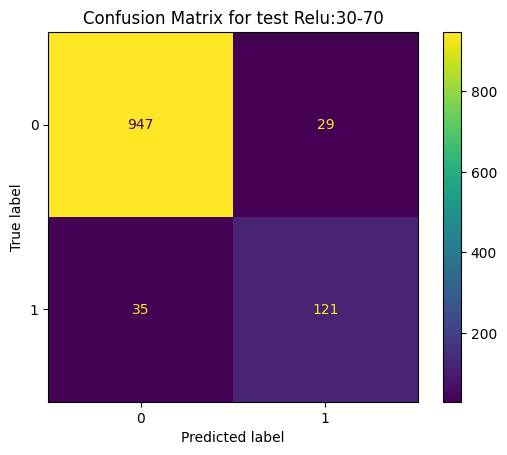

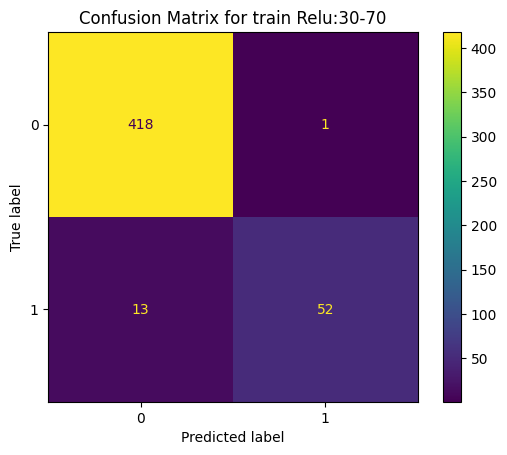

Iteration 8
Training loss Relu:30-70: 0.15348373353481293
Test loss Relu:30-70: 0.42570629715919495
Training accuracy Relu:30-70: 0.9710744023323059
Test accuracy Relu:30-70: 0.9434629082679749
F1 score Relu:30-70: 0.7908496732026143
              precision    recall  f1-score   support

      class1       0.96      0.97      0.97       976
      class2       0.81      0.78      0.79       156

    accuracy                           0.94      1132
   macro avg       0.89      0.87      0.88      1132
weighted avg       0.94      0.94      0.94      1132



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


16/16 [==============================] - 0s 1ms/step


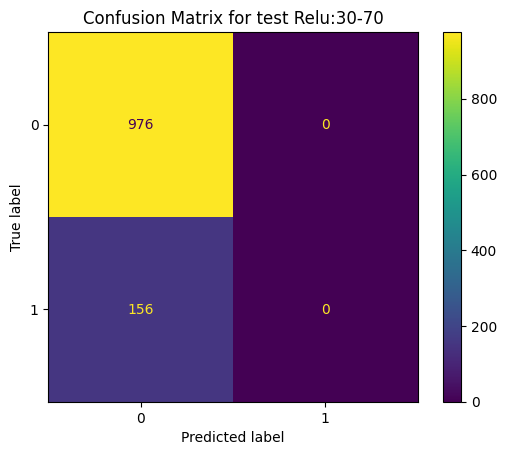

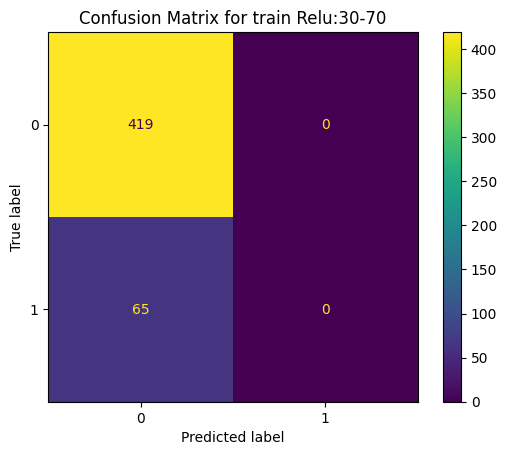

Iteration 9
Training loss Relu:30-70: 2.0715322494506836
Test loss Relu:30-70: 2.125699758529663
Training accuracy Relu:30-70: 0.8657024502754211
Test accuracy Relu:30-70: 0.8621907830238342
F1 score Relu:30-70: 0.0
              precision    recall  f1-score   support

      class1       0.86      1.00      0.93       976
      class2       0.00      0.00      0.00       156

    accuracy                           0.86      1132
   macro avg       0.43      0.50      0.46      1132
weighted avg       0.74      0.86      0.80      1132



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf

16/16 [==============================] - 0s 2ms/step


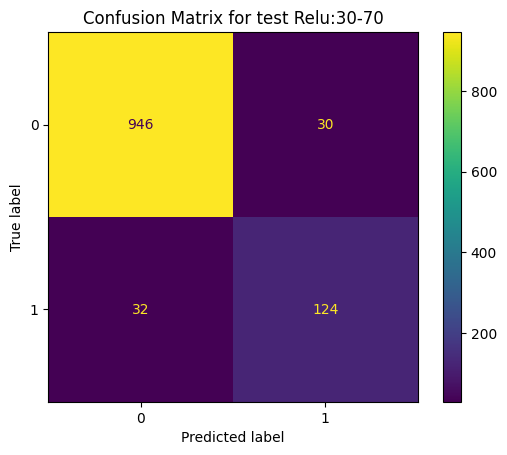

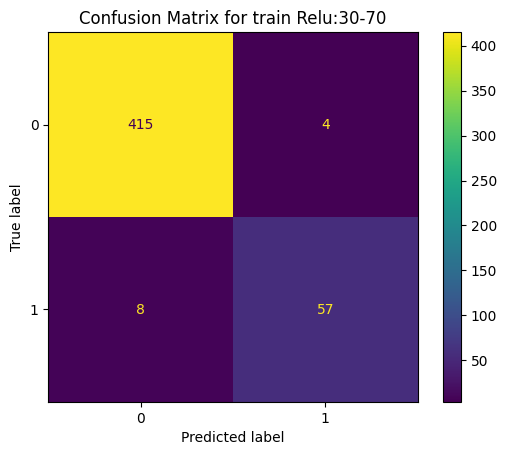

Iteration 10
Training loss Relu:30-70: 0.11330686509609222
Test loss Relu:30-70: 0.289522260427475
Training accuracy Relu:30-70: 0.9752066135406494
Test accuracy Relu:30-70: 0.945229709148407
F1 score Relu:30-70: 0.8
              precision    recall  f1-score   support

      class1       0.97      0.97      0.97       976
      class2       0.81      0.79      0.80       156

    accuracy                           0.95      1132
   macro avg       0.89      0.88      0.88      1132
weighted avg       0.94      0.95      0.95      1132

Average Training loss Relu:30-70: 0.7170746810734272
Average Test loss Relu:30-70: 0.9035396695137023
Average Training accuracy Relu:30-70: 0.9361570179462433
Average Test accuracy Relu:30-70: 0.9146643102169036
Average F1 score Relu:30-70: 0.5432905976741307


In [59]:
# Set what is X and what is Y 
X9 = solid_and_liquid_data_numerical #Top 20 correlation
y9 = solid_and_liquid_data['category']

# split the data into train-test split where 30% of data will be used as the test set
X9_train, X9_test, y9_train, y9_test = train_test_split(X9, y9, test_size=0.7, shuffle=True, random_state=42)

# Apply MinMaxScaler to scale the features, this is because the dataset is not uniformly distributed
scaler = MinMaxScaler()
X9_train_scaled = scaler.fit_transform(X9_train)
X9_test_scaled = scaler.transform(X9_test)

train_loss_total = 0.0
test_loss_total = 0.0
train_accuracy_total = 0.0
test_accuracy_total = 0.0
f1_score_total = 0.0
num_iterations = 10
for i in range(num_iterations):
    # Build a neural network model with sigmoid activation function in the output layer
    model = Sequential()
    model.add(Dense(16, activation='relu', input_shape=(X9_train_scaled.shape[1],)))
    model.add(Dense(8, activation='relu'))
    model.add(Dense(1, activation='relu'))

    # Compile the model
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    # Fit the model to the training data
    history = model.fit(X9_train_scaled, y9_train, epochs=50, batch_size=32, validation_split=0.2, verbose=0)

    # Evaluate the model on the training and test data
    train_loss, train_accuracy = model.evaluate(X9_train_scaled, y9_train, verbose=0)
    test_loss, test_accuracy = model.evaluate(X9_test_scaled, y9_test, verbose=0)

    train_loss_total += train_loss
    test_loss_total += test_loss
    train_accuracy_total += train_accuracy
    test_accuracy_total += test_accuracy

    # Evaluate the model on the test data
    y9_test_pred = model.predict(X9_test_scaled)
    y9_test_pred_binary = np.where(y9_test_pred > 0.5, 1, 0)
    
    f1 = f1_score(y9_test, y9_test_pred_binary)
    f1_score_total += f1

    # Compute confusion matrix
    cm17 = confusion_matrix(y9_test, y9_test_pred_binary)

    # Evaluate the model on the test data
    y9_train_pred = model.predict(X9_train_scaled)
    y9_train_pred_binary = np.where(y9_train_pred > 0.5, 1, 0)

    # Compute confusion matrix
    cm18 = confusion_matrix(y9_train, y9_train_pred_binary)

    # Display confusion matrix
    display = ConfusionMatrixDisplay(confusion_matrix=cm17, display_labels=['0', '1'])
    display.plot()
    plt.title("Confusion Matrix for test Relu:30-70")
    plt.show()

    display2 = ConfusionMatrixDisplay(confusion_matrix=cm18, display_labels=['0', '1'])
    display2.plot()
    plt.title("Confusion Matrix for train Relu:30-70")
    plt.show()


    print('Iteration', i+1)
    print('Training loss Relu:30-70:', train_loss)
    print('Test loss Relu:30-70:', test_loss)
    print('Training accuracy Relu:30-70:', train_accuracy)
    print('Test accuracy Relu:30-70:', test_accuracy)
    print('F1 score Relu:30-70:', f1)

    # Calculate precision, recall, and F1-score
    report = classification_report(y9_test, y9_test_pred_binary, target_names=['class1', 'class2'])
    print(report)

# Calculate the averages
avg_train_loss = train_loss_total / num_iterations
avg_test_loss = test_loss_total / num_iterations
avg_train_accuracy = train_accuracy_total / num_iterations
avg_test_accuracy = test_accuracy_total / num_iterations
avg_f1_score = f1_score_total/ num_iterations

print('Average Training loss Relu:30-70:', avg_train_loss)
print('Average Test loss Relu:30-70:', avg_test_loss)
print('Average Training accuracy Relu:30-70:', avg_train_accuracy)
print('Average Test accuracy Relu:30-70:', avg_test_accuracy)
print('Average F1 score Relu:30-70:', avg_f1_score)



# NEURON-NETWORK - Sigmoid

C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


36/36 [==============================] - 0s 1ms/step


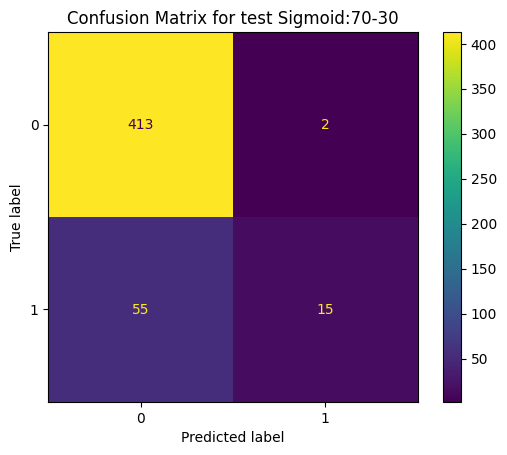

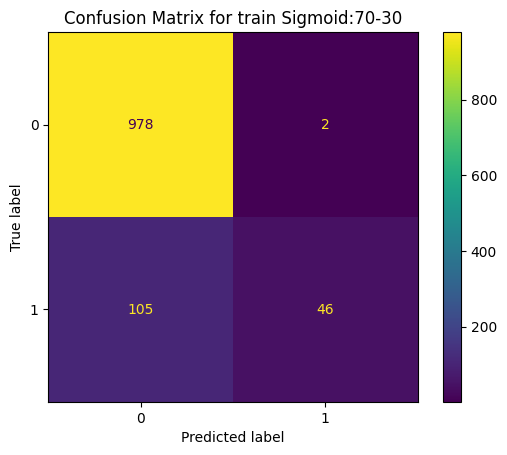

Iteration 1
Training loss Sigmoid:70-30: 0.24590814113616943
Test loss Sigmoid:70-30: 0.28347519040107727
Training accuracy Sigmoid:70-30: 0.9053934812545776
Test accuracy Sigmoid:70-30: 0.8824742436408997
F1 score Sigmoid:70-30: 0.3448275862068966
              precision    recall  f1-score   support

      class1       0.88      1.00      0.94       415
      class2       0.88      0.21      0.34        70

    accuracy                           0.88       485
   macro avg       0.88      0.60      0.64       485
weighted avg       0.88      0.88      0.85       485



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


36/36 [==============================] - 0s 1ms/step


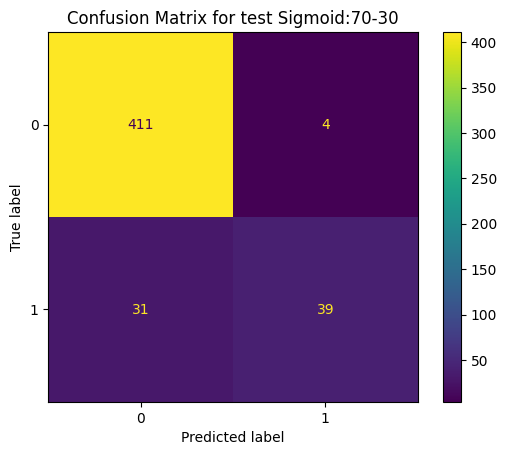

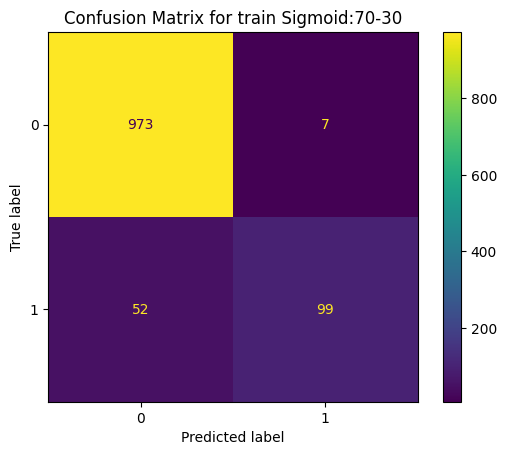

Iteration 2
Training loss Sigmoid:70-30: 0.1603468656539917
Test loss Sigmoid:70-30: 0.19191867113113403
Training accuracy Sigmoid:70-30: 0.947833776473999
Test accuracy Sigmoid:70-30: 0.9278350472450256
F1 score Sigmoid:70-30: 0.6902654867256637
              precision    recall  f1-score   support

      class1       0.93      0.99      0.96       415
      class2       0.91      0.56      0.69        70

    accuracy                           0.93       485
   macro avg       0.92      0.77      0.82       485
weighted avg       0.93      0.93      0.92       485



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


36/36 [==============================] - 0s 1ms/step


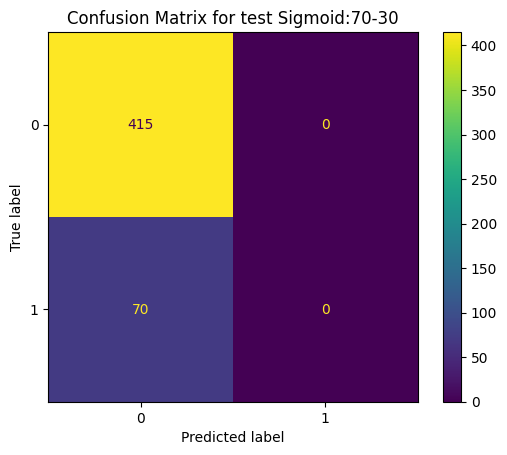

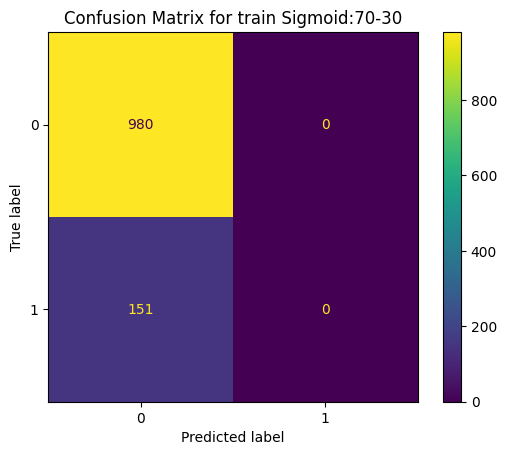

Iteration 3
Training loss Sigmoid:70-30: 0.3637865483760834
Test loss Sigmoid:70-30: 0.38619181513786316
Training accuracy Sigmoid:70-30: 0.866489827632904
Test accuracy Sigmoid:70-30: 0.8556700944900513
F1 score Sigmoid:70-30: 0.0
              precision    recall  f1-score   support

      class1       0.86      1.00      0.92       415
      class2       0.00      0.00      0.00        70

    accuracy                           0.86       485
   macro avg       0.43      0.50      0.46       485
weighted avg       0.73      0.86      0.79       485



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf

36/36 [==============================] - 0s 2ms/step


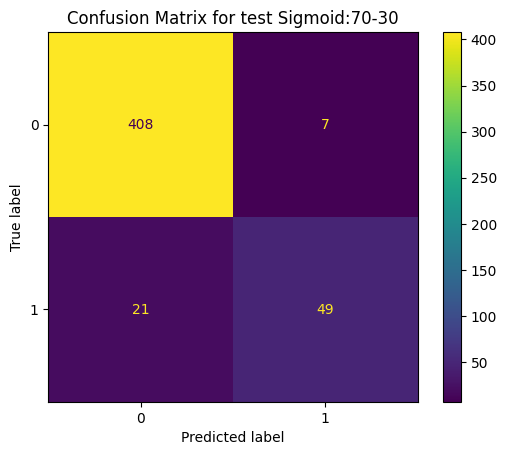

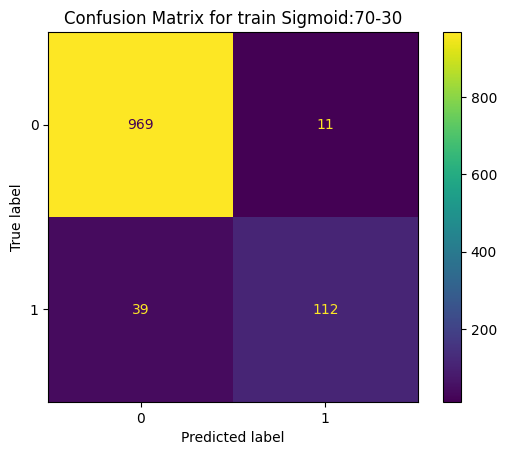

Iteration 4
Training loss Sigmoid:70-30: 0.1412530243396759
Test loss Sigmoid:70-30: 0.17704951763153076
Training accuracy Sigmoid:70-30: 0.9557913541793823
Test accuracy Sigmoid:70-30: 0.9422680139541626
F1 score Sigmoid:70-30: 0.7777777777777777
              precision    recall  f1-score   support

      class1       0.95      0.98      0.97       415
      class2       0.88      0.70      0.78        70

    accuracy                           0.94       485
   macro avg       0.91      0.84      0.87       485
weighted avg       0.94      0.94      0.94       485



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


36/36 [==============================] - 0s 1ms/step


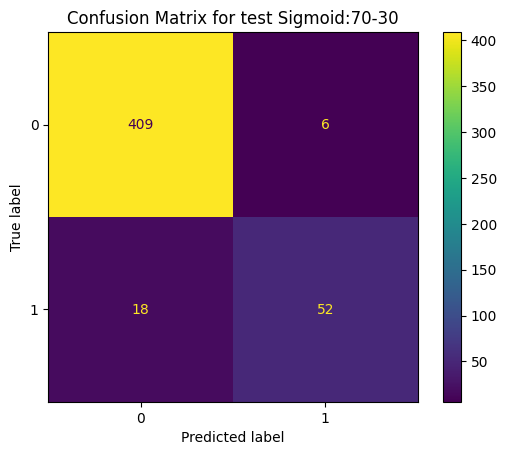

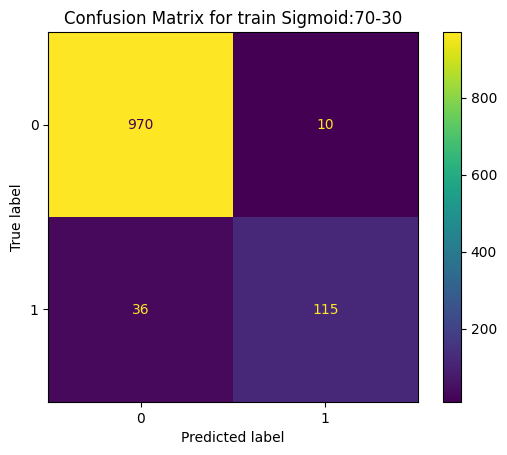

Iteration 5
Training loss Sigmoid:70-30: 0.1261586993932724
Test loss Sigmoid:70-30: 0.1630801111459732
Training accuracy Sigmoid:70-30: 0.9593280553817749
Test accuracy Sigmoid:70-30: 0.9505154490470886
F1 score Sigmoid:70-30: 0.8125
              precision    recall  f1-score   support

      class1       0.96      0.99      0.97       415
      class2       0.90      0.74      0.81        70

    accuracy                           0.95       485
   macro avg       0.93      0.86      0.89       485
weighted avg       0.95      0.95      0.95       485



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


36/36 [==============================] - 0s 2ms/step


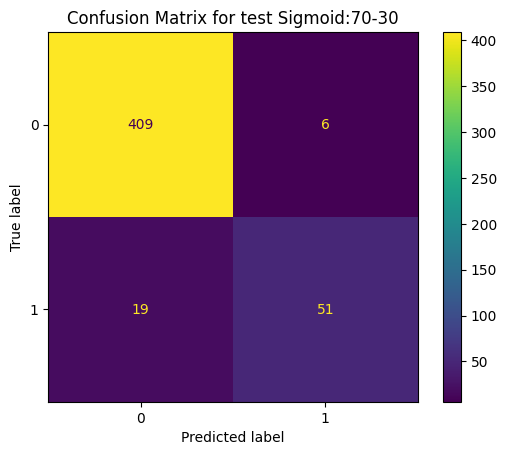

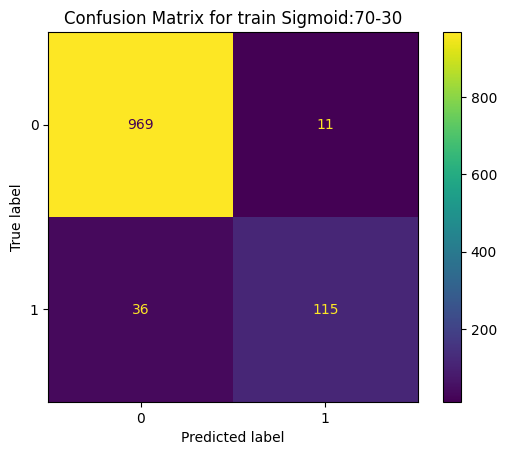

Iteration 6
Training loss Sigmoid:70-30: 0.1255066692829132
Test loss Sigmoid:70-30: 0.16336292028427124
Training accuracy Sigmoid:70-30: 0.9584438800811768
Test accuracy Sigmoid:70-30: 0.9484536051750183
F1 score Sigmoid:70-30: 0.8031496062992126
              precision    recall  f1-score   support

      class1       0.96      0.99      0.97       415
      class2       0.89      0.73      0.80        70

    accuracy                           0.95       485
   macro avg       0.93      0.86      0.89       485
weighted avg       0.95      0.95      0.95       485



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


36/36 [==============================] - 0s 1ms/step


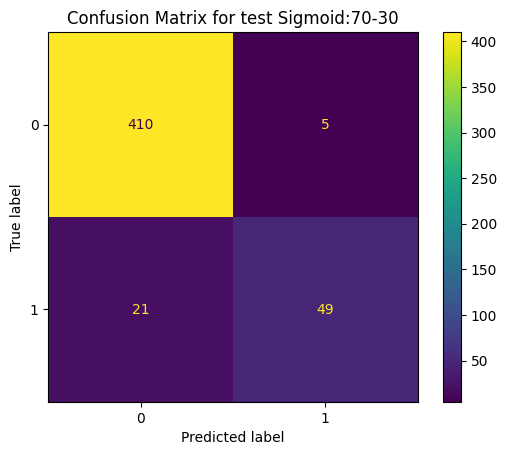

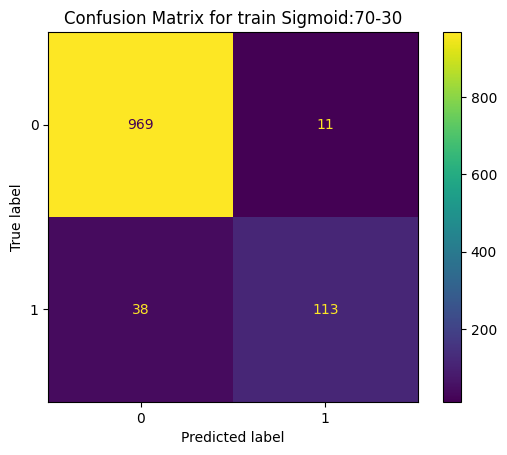

Iteration 7
Training loss Sigmoid:70-30: 0.14015844464302063
Test loss Sigmoid:70-30: 0.17304372787475586
Training accuracy Sigmoid:70-30: 0.9566755294799805
Test accuracy Sigmoid:70-30: 0.946391761302948
F1 score Sigmoid:70-30: 0.7903225806451613
              precision    recall  f1-score   support

      class1       0.95      0.99      0.97       415
      class2       0.91      0.70      0.79        70

    accuracy                           0.95       485
   macro avg       0.93      0.84      0.88       485
weighted avg       0.94      0.95      0.94       485



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


36/36 [==============================] - 0s 1ms/step


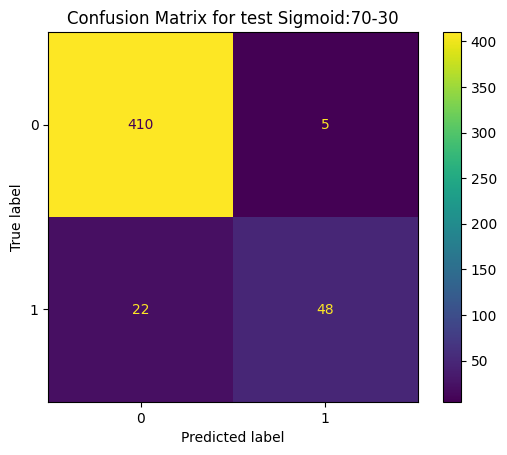

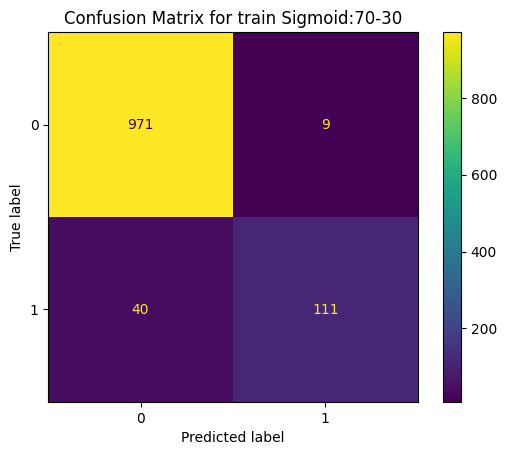

Iteration 8
Training loss Sigmoid:70-30: 0.14061735570430756
Test loss Sigmoid:70-30: 0.17472441494464874
Training accuracy Sigmoid:70-30: 0.9566755294799805
Test accuracy Sigmoid:70-30: 0.9443299174308777
F1 score Sigmoid:70-30: 0.7804878048780488
              precision    recall  f1-score   support

      class1       0.95      0.99      0.97       415
      class2       0.91      0.69      0.78        70

    accuracy                           0.94       485
   macro avg       0.93      0.84      0.87       485
weighted avg       0.94      0.94      0.94       485



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


36/36 [==============================] - 0s 1ms/step


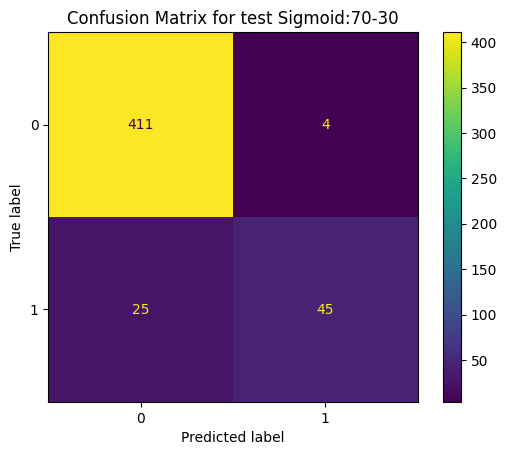

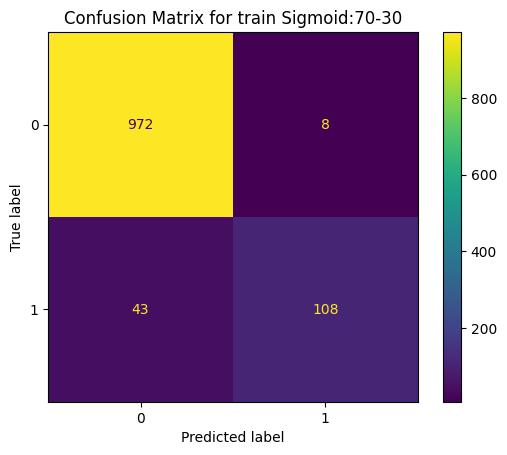

Iteration 9
Training loss Sigmoid:70-30: 0.15143752098083496
Test loss Sigmoid:70-30: 0.18394233286380768
Training accuracy Sigmoid:70-30: 0.9549071788787842
Test accuracy Sigmoid:70-30: 0.9402061700820923
F1 score Sigmoid:70-30: 0.7563025210084034
              precision    recall  f1-score   support

      class1       0.94      0.99      0.97       415
      class2       0.92      0.64      0.76        70

    accuracy                           0.94       485
   macro avg       0.93      0.82      0.86       485
weighted avg       0.94      0.94      0.94       485



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


36/36 [==============================] - 0s 1ms/step


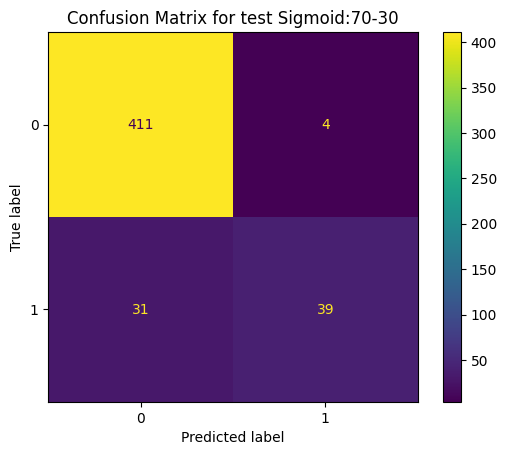

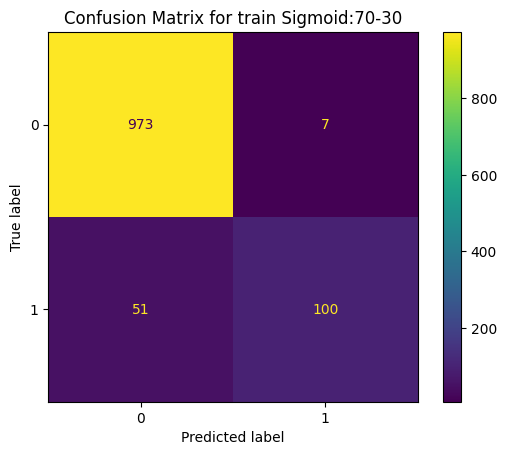

Iteration 10
Training loss Sigmoid:70-30: 0.15929950773715973
Test loss Sigmoid:70-30: 0.19119733572006226
Training accuracy Sigmoid:70-30: 0.9487179517745972
Test accuracy Sigmoid:70-30: 0.9278350472450256
F1 score Sigmoid:70-30: 0.6902654867256637
              precision    recall  f1-score   support

      class1       0.93      0.99      0.96       415
      class2       0.91      0.56      0.69        70

    accuracy                           0.93       485
   macro avg       0.92      0.77      0.82       485
weighted avg       0.93      0.93      0.92       485

Average Training loss Sigmoid:70-30: 0.1754472777247429
Average Test loss Sigmoid:70-30: 0.20879860371351242
Average Training accuracy Sigmoid:70-30: 0.9410256564617157
Average Test accuracy Sigmoid:70-30: 0.9265979349613189
Average F1 score Sigmoid:70-30: 0.6445898850266827


In [60]:
# Set what is X and what is Y 
X10 = solid_and_liquid_data_numerical #Top 20 correlation
y10 = solid_and_liquid_data['category']

# split the data into train-test split where 30% of data will be used as the test set
X10_train, X10_test, y10_train, y10_test = train_test_split(X10, y10, test_size=0.3, shuffle=True, random_state=42)

# Apply MinMaxScaler to scale the features, this is because the dataset is not uniformly distributed
scaler = MinMaxScaler()
X10_train_scaled = scaler.fit_transform(X10_train)
X10_test_scaled = scaler.transform(X10_test)

train_loss_total = 0.0
test_loss_total = 0.0
train_accuracy_total = 0.0
test_accuracy_total = 0.0
f1_score_total = 0.0
num_iterations = 10
for i in range(num_iterations):
    # Build a neural network model with sigmoid activation function in the output layer
    model = Sequential()
    model.add(Dense(16, activation='sigmoid', input_shape=(X10_train_scaled.shape[1],)))
    model.add(Dense(8, activation='sigmoid'))
    model.add(Dense(1, activation='sigmoid'))

    # Compile the model
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    # Fit the model to the training data
    history = model.fit(X10_train_scaled, y10_train, epochs=50, batch_size=32, validation_split=0.2, verbose=0)

    # Evaluate the model on the training and test data
    train_loss, train_accuracy = model.evaluate(X10_train_scaled, y10_train, verbose=0)
    test_loss, test_accuracy = model.evaluate(X10_test_scaled, y10_test, verbose=0)

    train_loss_total += train_loss
    test_loss_total += test_loss
    train_accuracy_total += train_accuracy
    test_accuracy_total += test_accuracy

    # Evaluate the model on the test data
    y10_test_pred = model.predict(X10_test_scaled)
    y10_test_pred_binary = np.where(y10_test_pred > 0.5, 1, 0)
    
    f1 = f1_score(y10_test, y10_test_pred_binary)
    f1_score_total += f1

    # Compute confusion matrix
    cm19 = confusion_matrix(y10_test, y10_test_pred_binary)

    # Evaluate the model on the test data
    y10_train_pred = model.predict(X10_train_scaled)
    y10_train_pred_binary = np.where(y10_train_pred > 0.5, 1, 0)

    # Compute confusion matrix
    cm20 = confusion_matrix(y10_train, y10_train_pred_binary)

    # Display confusion matrix
    display = ConfusionMatrixDisplay(confusion_matrix=cm19, display_labels=['0', '1'])
    display.plot()
    plt.title("Confusion Matrix for test Sigmoid:70-30")
    plt.show()

    display2 = ConfusionMatrixDisplay(confusion_matrix=cm20, display_labels=['0', '1'])
    display2.plot()
    plt.title("Confusion Matrix for train Sigmoid:70-30")
    plt.show()

    print('Iteration', i+1)
    print('Training loss Sigmoid:70-30:', train_loss)
    print('Test loss Sigmoid:70-30:', test_loss)
    print('Training accuracy Sigmoid:70-30:', train_accuracy)
    print('Test accuracy Sigmoid:70-30:', test_accuracy)
    print('F1 score Sigmoid:70-30:', f1)

    # Calculate precision, recall, and F1-score
    report = classification_report(y10_test, y10_test_pred_binary, target_names=['class1', 'class2'])
    print(report)

# Calculate the averages
avg_train_loss = train_loss_total / num_iterations
avg_test_loss = test_loss_total / num_iterations
avg_train_accuracy = train_accuracy_total / num_iterations
avg_test_accuracy = test_accuracy_total / num_iterations
avg_f1_score = f1_score_total/ num_iterations

print('Average Training loss Sigmoid:70-30:', avg_train_loss)
print('Average Test loss Sigmoid:70-30:', avg_test_loss)
print('Average Training accuracy Sigmoid:70-30:', avg_train_accuracy)
print('Average Test accuracy Sigmoid:70-30:', avg_test_accuracy)
print('Average F1 score Sigmoid:70-30:', avg_f1_score)



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


26/26 [==============================] - 0s 2ms/step


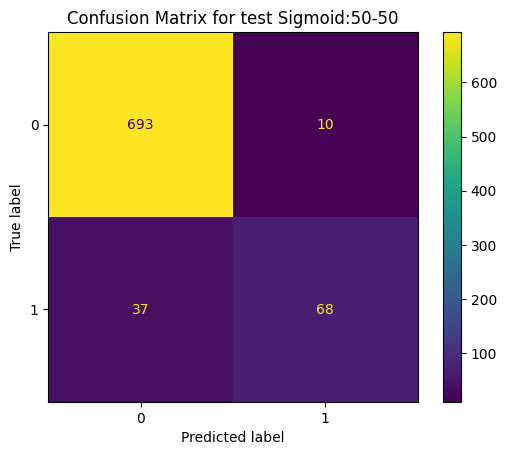

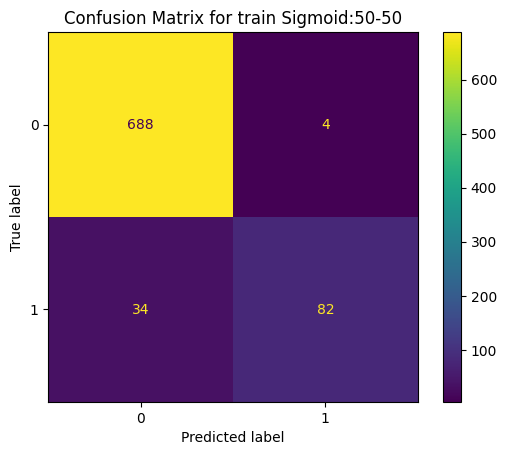

Iteration 1
Training loss Sigmoid:50-50: 0.16230453550815582
Test loss Sigmoid:50-50: 0.1767996847629547
Training accuracy Sigmoid:50-50: 0.9529703259468079
Test accuracy Sigmoid:50-50: 0.9418317079544067
F1 score Sigmoid:50-50: 0.7431693989071039
              precision    recall  f1-score   support

      class1       0.95      0.99      0.97       703
      class2       0.87      0.65      0.74       105

    accuracy                           0.94       808
   macro avg       0.91      0.82      0.86       808
weighted avg       0.94      0.94      0.94       808



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


26/26 [==============================] - 0s 1ms/step


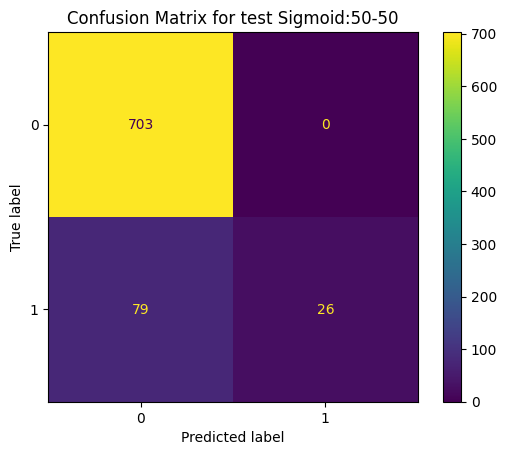

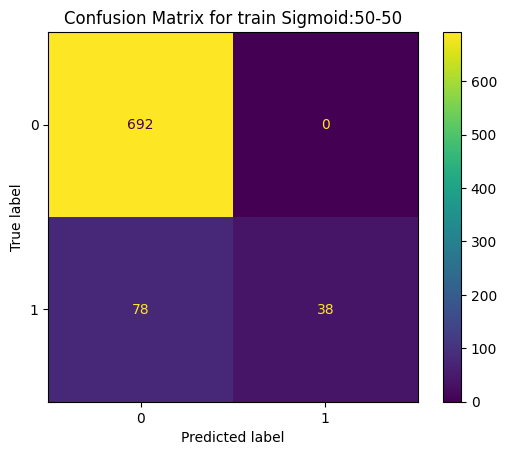

Iteration 2
Training loss Sigmoid:50-50: 0.1991196572780609
Test loss Sigmoid:50-50: 0.20583854615688324
Training accuracy Sigmoid:50-50: 0.9034653306007385
Test accuracy Sigmoid:50-50: 0.9022276997566223
F1 score Sigmoid:50-50: 0.3969465648854962
              precision    recall  f1-score   support

      class1       0.90      1.00      0.95       703
      class2       1.00      0.25      0.40       105

    accuracy                           0.90       808
   macro avg       0.95      0.62      0.67       808
weighted avg       0.91      0.90      0.88       808



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


26/26 [==============================] - 0s 1ms/step


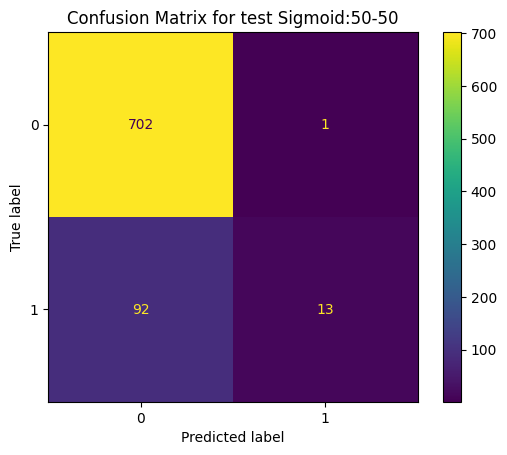

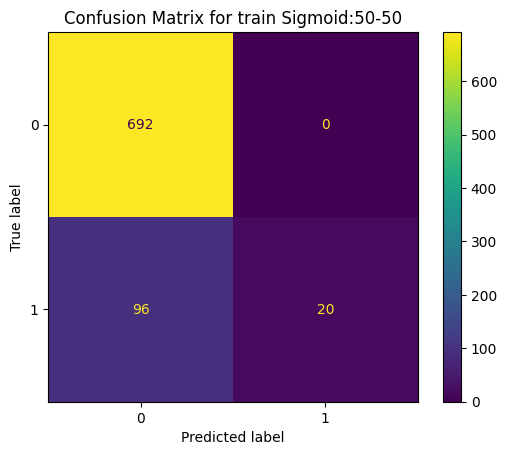

Iteration 3
Training loss Sigmoid:50-50: 0.2953967750072479
Test loss Sigmoid:50-50: 0.3007183074951172
Training accuracy Sigmoid:50-50: 0.8811880946159363
Test accuracy Sigmoid:50-50: 0.8849009871482849
F1 score Sigmoid:50-50: 0.21848739495798322
              precision    recall  f1-score   support

      class1       0.88      1.00      0.94       703
      class2       0.93      0.12      0.22       105

    accuracy                           0.88       808
   macro avg       0.91      0.56      0.58       808
weighted avg       0.89      0.88      0.84       808



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


26/26 [==============================] - 0s 1ms/step


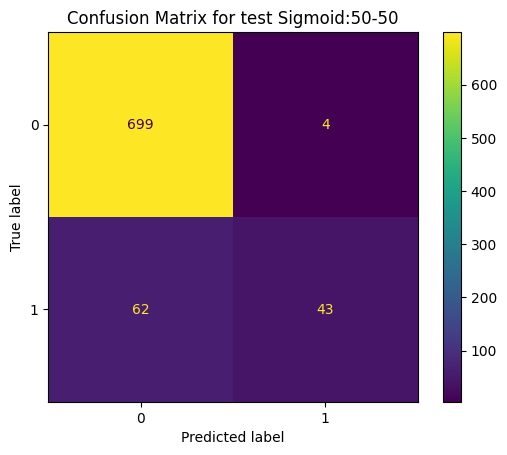

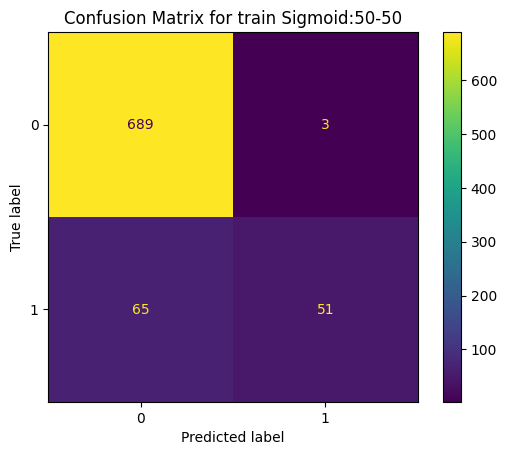

Iteration 4
Training loss Sigmoid:50-50: 0.18491575121879578
Test loss Sigmoid:50-50: 0.19384527206420898
Training accuracy Sigmoid:50-50: 0.9158415794372559
Test accuracy Sigmoid:50-50: 0.9183168411254883
F1 score Sigmoid:50-50: 0.5657894736842105
              precision    recall  f1-score   support

      class1       0.92      0.99      0.95       703
      class2       0.91      0.41      0.57       105

    accuracy                           0.92       808
   macro avg       0.92      0.70      0.76       808
weighted avg       0.92      0.92      0.90       808



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


26/26 [==============================] - 0s 1ms/step


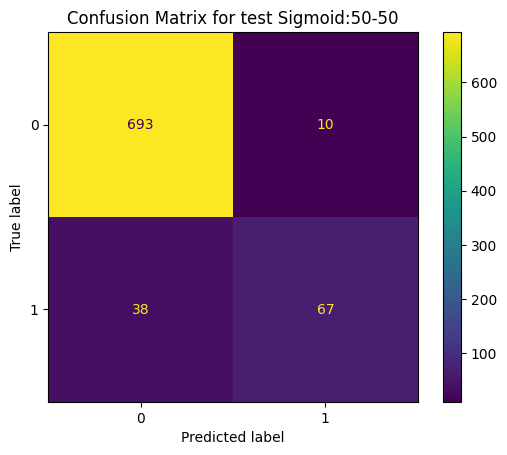

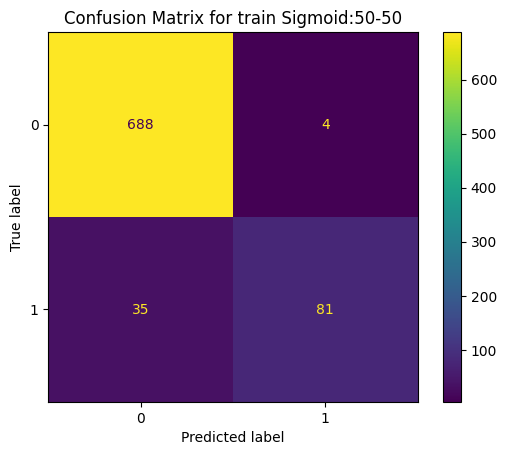

Iteration 5
Training loss Sigmoid:50-50: 0.1626342386007309
Test loss Sigmoid:50-50: 0.17619840800762177
Training accuracy Sigmoid:50-50: 0.9517326951026917
Test accuracy Sigmoid:50-50: 0.9405940771102905
F1 score Sigmoid:50-50: 0.7362637362637362
              precision    recall  f1-score   support

      class1       0.95      0.99      0.97       703
      class2       0.87      0.64      0.74       105

    accuracy                           0.94       808
   macro avg       0.91      0.81      0.85       808
weighted avg       0.94      0.94      0.94       808



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


26/26 [==============================] - 0s 1ms/step


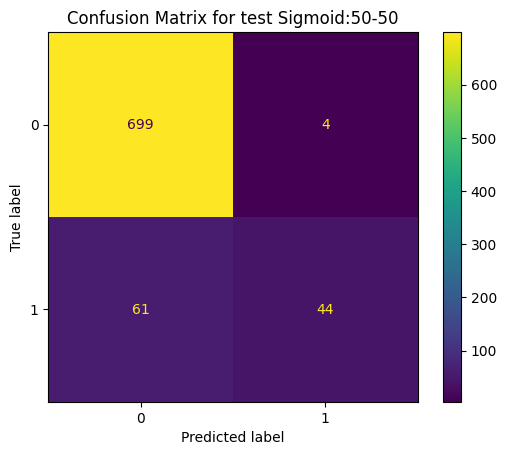

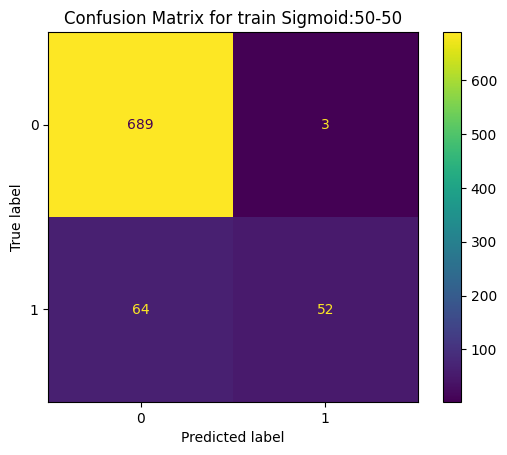

Iteration 6
Training loss Sigmoid:50-50: 0.18695180118083954
Test loss Sigmoid:50-50: 0.19673413038253784
Training accuracy Sigmoid:50-50: 0.9170792102813721
Test accuracy Sigmoid:50-50: 0.9195544719696045
F1 score Sigmoid:50-50: 0.5751633986928104
              precision    recall  f1-score   support

      class1       0.92      0.99      0.96       703
      class2       0.92      0.42      0.58       105

    accuracy                           0.92       808
   macro avg       0.92      0.71      0.77       808
weighted avg       0.92      0.92      0.91       808



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


26/26 [==============================] - 0s 1ms/step


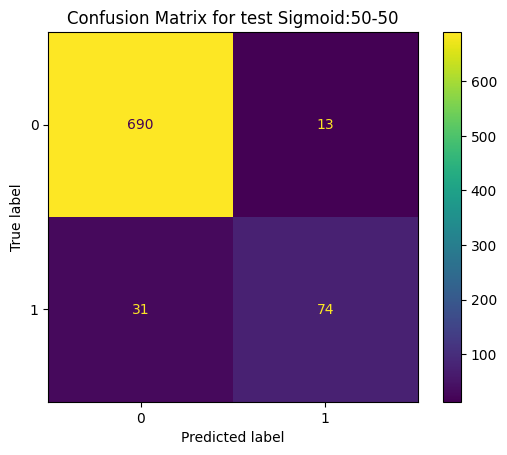

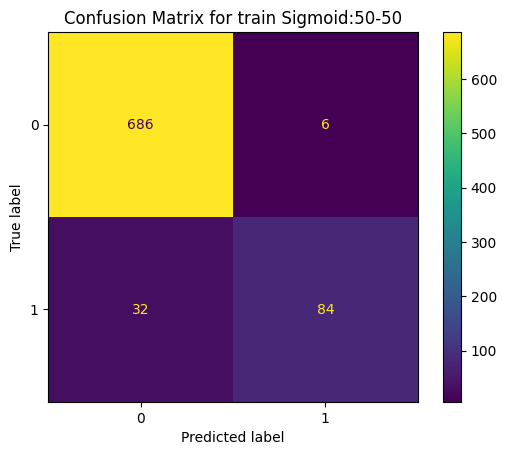

Iteration 7
Training loss Sigmoid:50-50: 0.1610572189092636
Test loss Sigmoid:50-50: 0.17444823682308197
Training accuracy Sigmoid:50-50: 0.9529703259468079
Test accuracy Sigmoid:50-50: 0.9455445408821106
F1 score Sigmoid:50-50: 0.7708333333333334
              precision    recall  f1-score   support

      class1       0.96      0.98      0.97       703
      class2       0.85      0.70      0.77       105

    accuracy                           0.95       808
   macro avg       0.90      0.84      0.87       808
weighted avg       0.94      0.95      0.94       808



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


26/26 [==============================] - 0s 2ms/step


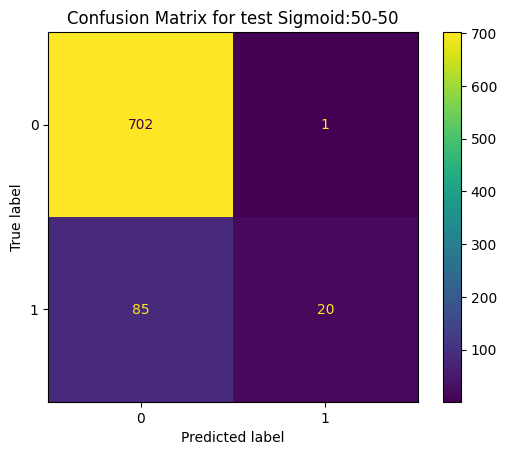

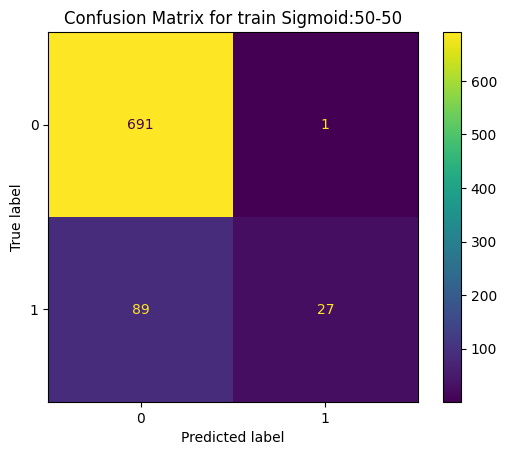

Iteration 8
Training loss Sigmoid:50-50: 0.26435521245002747
Test loss Sigmoid:50-50: 0.2728824019432068
Training accuracy Sigmoid:50-50: 0.8886138796806335
Test accuracy Sigmoid:50-50: 0.8935643434524536
F1 score Sigmoid:50-50: 0.31746031746031744
              precision    recall  f1-score   support

      class1       0.89      1.00      0.94       703
      class2       0.95      0.19      0.32       105

    accuracy                           0.89       808
   macro avg       0.92      0.59      0.63       808
weighted avg       0.90      0.89      0.86       808



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


26/26 [==============================] - 0s 1ms/step


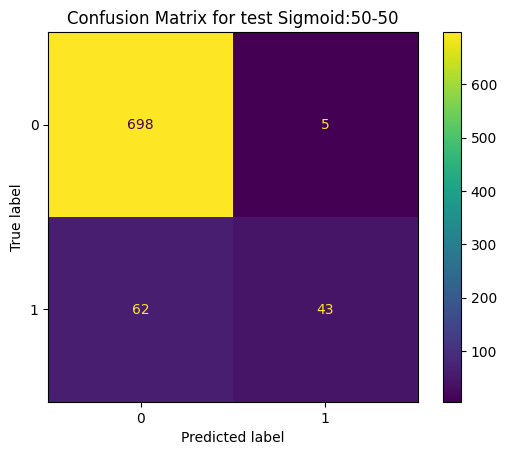

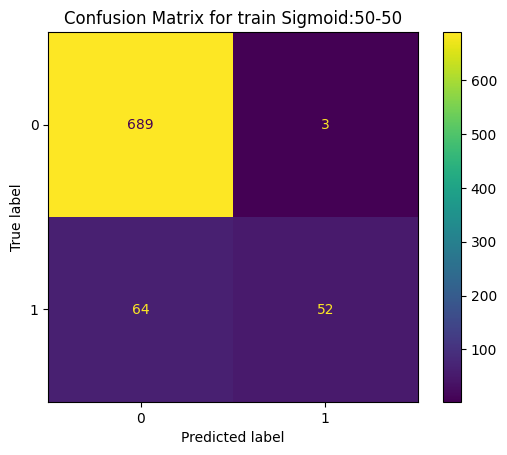

Iteration 9
Training loss Sigmoid:50-50: 0.19251161813735962
Test loss Sigmoid:50-50: 0.2018003761768341
Training accuracy Sigmoid:50-50: 0.9170792102813721
Test accuracy Sigmoid:50-50: 0.9170792102813721
F1 score Sigmoid:50-50: 0.5620915032679739
              precision    recall  f1-score   support

      class1       0.92      0.99      0.95       703
      class2       0.90      0.41      0.56       105

    accuracy                           0.92       808
   macro avg       0.91      0.70      0.76       808
weighted avg       0.92      0.92      0.90       808



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


26/26 [==============================] - 0s 2ms/step


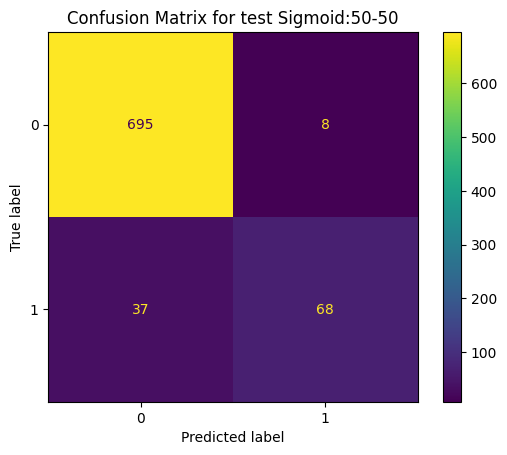

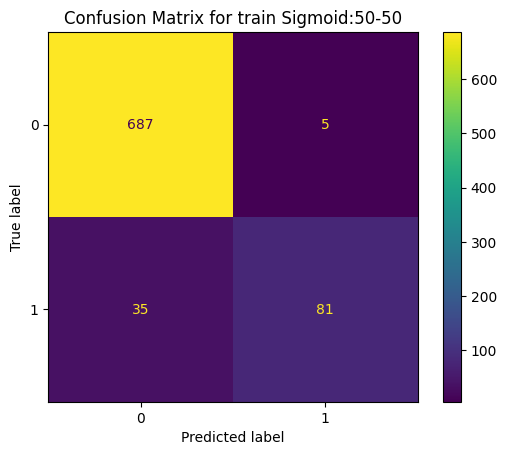

Iteration 10
Training loss Sigmoid:50-50: 0.16548903286457062
Test loss Sigmoid:50-50: 0.17962299287319183
Training accuracy Sigmoid:50-50: 0.9504950642585754
Test accuracy Sigmoid:50-50: 0.9443069100379944
F1 score Sigmoid:50-50: 0.7513812154696133
              precision    recall  f1-score   support

      class1       0.95      0.99      0.97       703
      class2       0.89      0.65      0.75       105

    accuracy                           0.94       808
   macro avg       0.92      0.82      0.86       808
weighted avg       0.94      0.94      0.94       808

Average Training loss Sigmoid:50-50: 0.19747358411550522
Average Test loss Sigmoid:50-50: 0.20788883566856384
Average Training accuracy Sigmoid:50-50: 0.9231435716152191
Average Test accuracy Sigmoid:50-50: 0.9207920789718628
Average F1 score Sigmoid:50-50: 0.5637586336922578


In [61]:
# Set what is X and what is Y 
X11 = solid_and_liquid_data_numerical #Top 20 correlation
y11 = solid_and_liquid_data['category']

# split the data into train-test split where 30% of data will be used as the test set
X11_train, X11_test, y11_train, y11_test = train_test_split(X11, y11, test_size=0.5, shuffle=True, random_state=42)

# Apply MinMaxScaler to scale the features, this is because the dataset is not uniformly distributed
scaler = MinMaxScaler()
X11_train_scaled = scaler.fit_transform(X11_train)
X11_test_scaled = scaler.transform(X11_test)

train_loss_total = 0.0
test_loss_total = 0.0
train_accuracy_total = 0.0
test_accuracy_total = 0.0
f1_score_total = 0.0
num_iterations = 10
for i in range(num_iterations):
    # Build a neural network model with sigmoid activation function in the output layer
    model = Sequential()
    model.add(Dense(16, activation='sigmoid', input_shape=(X11_train_scaled.shape[1],)))
    model.add(Dense(8, activation='sigmoid'))
    model.add(Dense(1, activation='sigmoid'))

    # Compile the model
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    # Fit the model to the training data
    history = model.fit(X11_train_scaled, y11_train, epochs=50, batch_size=32, validation_split=0.2, verbose=0)

    # Evaluate the model on the training and test data
    train_loss, train_accuracy = model.evaluate(X11_train_scaled, y11_train, verbose=0)
    test_loss, test_accuracy = model.evaluate(X11_test_scaled, y11_test, verbose=0)

    train_loss_total += train_loss
    test_loss_total += test_loss
    train_accuracy_total += train_accuracy
    test_accuracy_total += test_accuracy

    # Evaluate the model on the test data
    y11_test_pred = model.predict(X11_test_scaled)
    y11_test_pred_binary = np.where(y11_test_pred > 0.5, 1, 0)
    
    f1 = f1_score(y11_test, y11_test_pred_binary)
    f1_score_total += f1
    
    # Compute confusion matrix
    cm21 = confusion_matrix(y11_test, y11_test_pred_binary)

    # Evaluate the model on the test data
    y11_train_pred = model.predict(X11_train_scaled)
    y11_train_pred_binary = np.where(y11_train_pred > 0.5, 1, 0)

    # Compute confusion matrix
    cm22 = confusion_matrix(y11_train, y11_train_pred_binary)

    # Display confusion matrix
    display = ConfusionMatrixDisplay(confusion_matrix=cm21, display_labels=['0', '1'])
    display.plot()
    plt.title("Confusion Matrix for test Sigmoid:50-50")
    plt.show()

    display2 = ConfusionMatrixDisplay(confusion_matrix=cm22, display_labels=['0', '1'])
    display2.plot()
    plt.title("Confusion Matrix for train Sigmoid:50-50")
    plt.show()


    print('Iteration', i+1)
    print('Training loss Sigmoid:50-50:', train_loss)
    print('Test loss Sigmoid:50-50:', test_loss)
    print('Training accuracy Sigmoid:50-50:', train_accuracy)
    print('Test accuracy Sigmoid:50-50:', test_accuracy)
    print('F1 score Sigmoid:50-50:', f1)

    # Calculate precision, recall, and F1-score
    report = classification_report(y11_test, y11_test_pred_binary, target_names=['class1', 'class2'])
    print(report)

# Calculate the averages
avg_train_loss = train_loss_total / num_iterations
avg_test_loss = test_loss_total / num_iterations
avg_train_accuracy = train_accuracy_total / num_iterations
avg_test_accuracy = test_accuracy_total / num_iterations
avg_f1_score = f1_score_total/ num_iterations

print('Average Training loss Sigmoid:50-50:', avg_train_loss)
print('Average Test loss Sigmoid:50-50:', avg_test_loss)
print('Average Training accuracy Sigmoid:50-50:', avg_train_accuracy)
print('Average Test accuracy Sigmoid:50-50:', avg_test_accuracy)
print('Average F1 score Sigmoid:50-50:', avg_f1_score)


C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


16/16 [==============================] - 0s 2ms/step


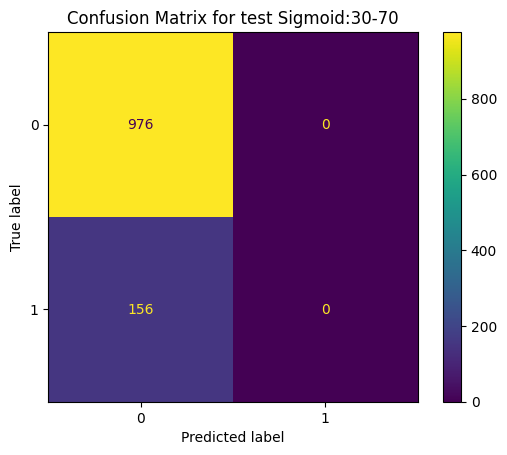

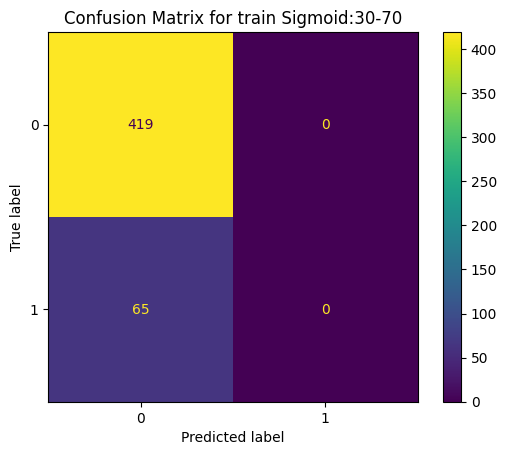

Iteration 1
Training loss Sigmoid:30-70: 0.37329310178756714
Test loss Sigmoid:30-70: 0.3779470920562744
Training accuracy Sigmoid:30-70: 0.8657024502754211
Test accuracy Sigmoid:30-70: 0.8621907830238342
F1 score Sigmoid:30-70: 0.0
              precision    recall  f1-score   support

      class1       0.86      1.00      0.93       976
      class2       0.00      0.00      0.00       156

    accuracy                           0.86      1132
   macro avg       0.43      0.50      0.46      1132
weighted avg       0.74      0.86      0.80      1132



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf

16/16 [==============================] - 0s 1ms/step


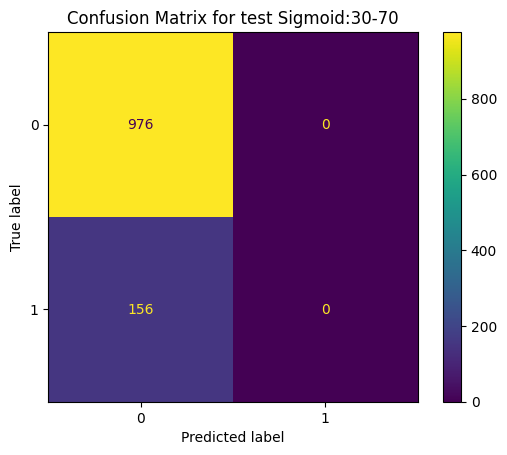

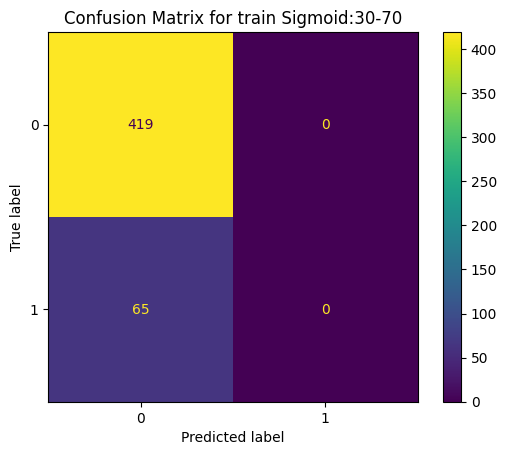

Iteration 2
Training loss Sigmoid:30-70: 0.34989264607429504
Test loss Sigmoid:30-70: 0.3564898371696472
Training accuracy Sigmoid:30-70: 0.8657024502754211
Test accuracy Sigmoid:30-70: 0.8621907830238342
F1 score Sigmoid:30-70: 0.0
              precision    recall  f1-score   support

      class1       0.86      1.00      0.93       976
      class2       0.00      0.00      0.00       156

    accuracy                           0.86      1132
   macro avg       0.43      0.50      0.46      1132
weighted avg       0.74      0.86      0.80      1132



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf

16/16 [==============================] - 0s 2ms/step


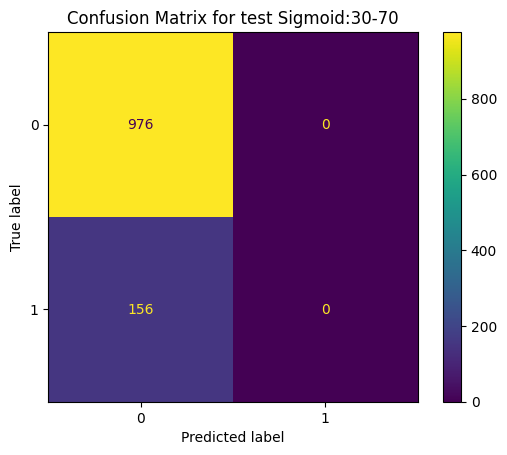

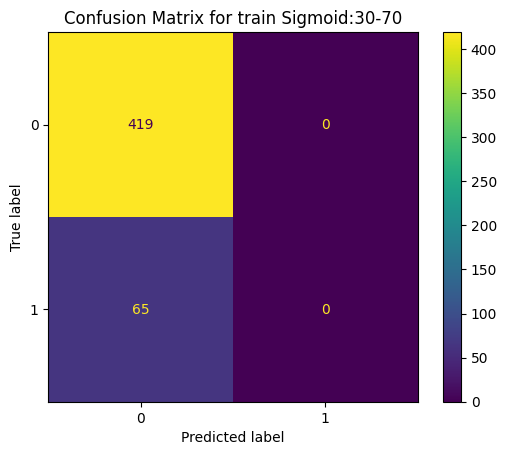

Iteration 3
Training loss Sigmoid:30-70: 0.3433426022529602
Test loss Sigmoid:30-70: 0.3504589796066284
Training accuracy Sigmoid:30-70: 0.8657024502754211
Test accuracy Sigmoid:30-70: 0.8621907830238342
F1 score Sigmoid:30-70: 0.0
              precision    recall  f1-score   support

      class1       0.86      1.00      0.93       976
      class2       0.00      0.00      0.00       156

    accuracy                           0.86      1132
   macro avg       0.43      0.50      0.46      1132
weighted avg       0.74      0.86      0.80      1132



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf

16/16 [==============================] - 0s 2ms/step


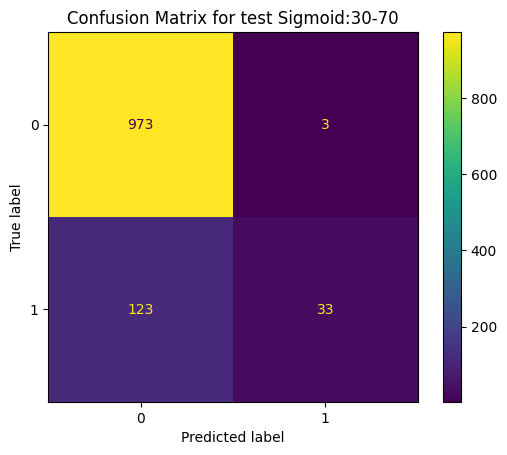

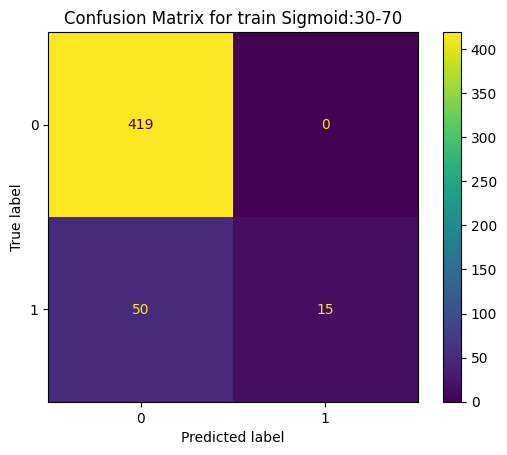

Iteration 4
Training loss Sigmoid:30-70: 0.22111836075782776
Test loss Sigmoid:30-70: 0.2353014200925827
Training accuracy Sigmoid:30-70: 0.8966942429542542
Test accuracy Sigmoid:30-70: 0.8886925578117371
F1 score Sigmoid:30-70: 0.34374999999999994
              precision    recall  f1-score   support

      class1       0.89      1.00      0.94       976
      class2       0.92      0.21      0.34       156

    accuracy                           0.89      1132
   macro avg       0.90      0.60      0.64      1132
weighted avg       0.89      0.89      0.86      1132



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


16/16 [==============================] - 0s 1ms/step


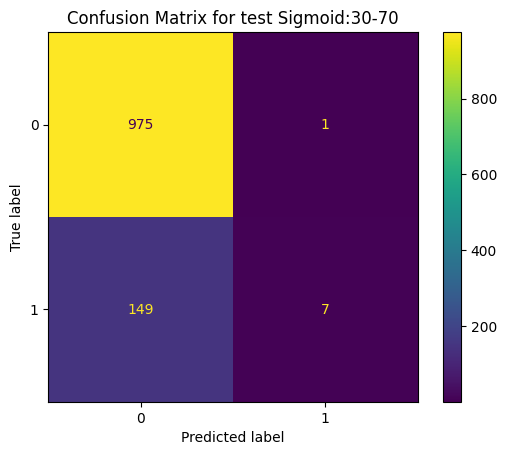

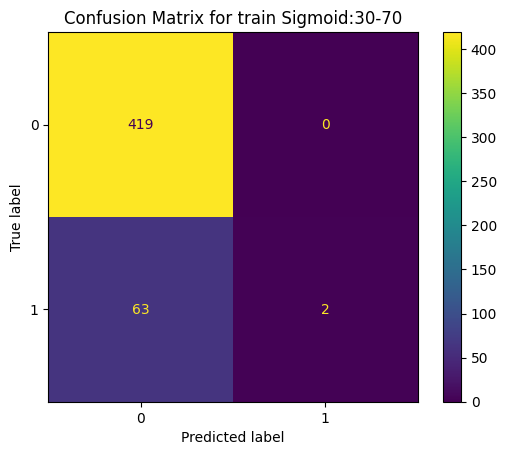

Iteration 5
Training loss Sigmoid:30-70: 0.27910172939300537
Test loss Sigmoid:30-70: 0.28968894481658936
Training accuracy Sigmoid:30-70: 0.8698347210884094
Test accuracy Sigmoid:30-70: 0.8674911856651306
F1 score Sigmoid:30-70: 0.08536585365853659
              precision    recall  f1-score   support

      class1       0.87      1.00      0.93       976
      class2       0.88      0.04      0.09       156

    accuracy                           0.87      1132
   macro avg       0.87      0.52      0.51      1132
weighted avg       0.87      0.87      0.81      1132



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


16/16 [==============================] - 0s 1ms/step


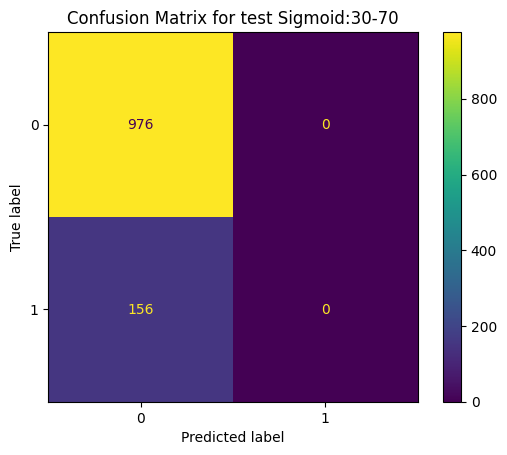

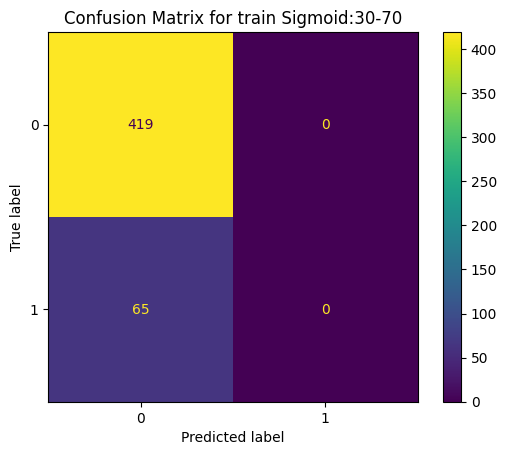

Iteration 6
Training loss Sigmoid:30-70: 0.34380224347114563
Test loss Sigmoid:30-70: 0.3508681356906891
Training accuracy Sigmoid:30-70: 0.8657024502754211
Test accuracy Sigmoid:30-70: 0.8621907830238342
F1 score Sigmoid:30-70: 0.0
              precision    recall  f1-score   support

      class1       0.86      1.00      0.93       976
      class2       0.00      0.00      0.00       156

    accuracy                           0.86      1132
   macro avg       0.43      0.50      0.46      1132
weighted avg       0.74      0.86      0.80      1132



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf

16/16 [==============================] - 0s 1ms/step


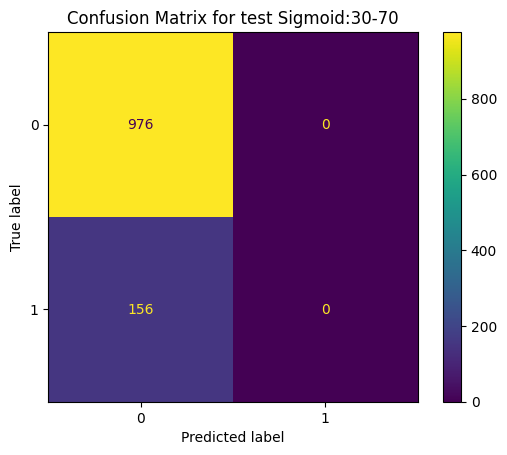

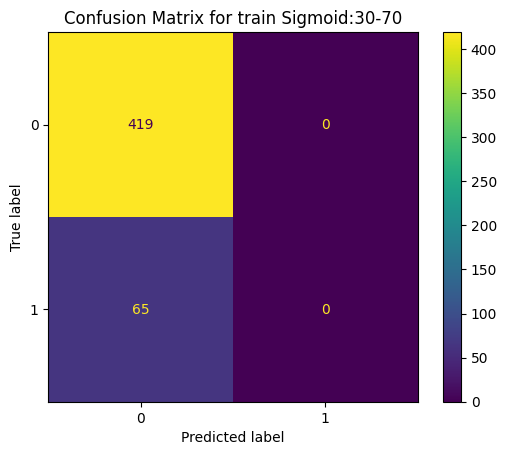

Iteration 7
Training loss Sigmoid:30-70: 0.3137832581996918
Test loss Sigmoid:30-70: 0.3252561688423157
Training accuracy Sigmoid:30-70: 0.8657024502754211
Test accuracy Sigmoid:30-70: 0.8621907830238342
F1 score Sigmoid:30-70: 0.0
              precision    recall  f1-score   support

      class1       0.86      1.00      0.93       976
      class2       0.00      0.00      0.00       156

    accuracy                           0.86      1132
   macro avg       0.43      0.50      0.46      1132
weighted avg       0.74      0.86      0.80      1132



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf

16/16 [==============================] - 0s 2ms/step


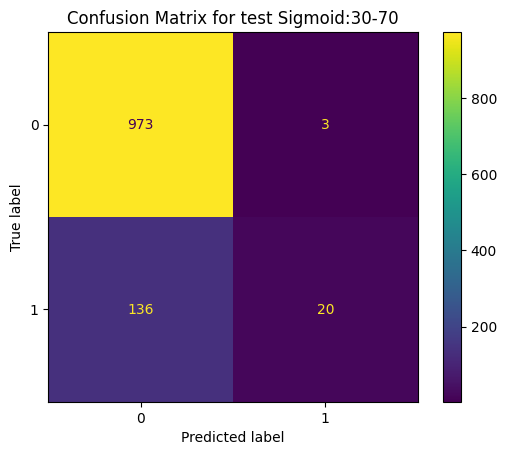

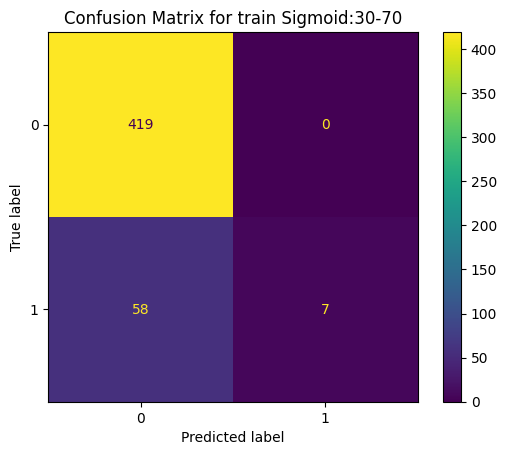

Iteration 8
Training loss Sigmoid:30-70: 0.2602471709251404
Test loss Sigmoid:30-70: 0.2709816098213196
Training accuracy Sigmoid:30-70: 0.8801652789115906
Test accuracy Sigmoid:30-70: 0.8772084712982178
F1 score Sigmoid:30-70: 0.22346368715083798
              precision    recall  f1-score   support

      class1       0.88      1.00      0.93       976
      class2       0.87      0.13      0.22       156

    accuracy                           0.88      1132
   macro avg       0.87      0.56      0.58      1132
weighted avg       0.88      0.88      0.84      1132



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\engine\data_adapter.py:1700: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


16/16 [==============================] - 0s 1ms/step


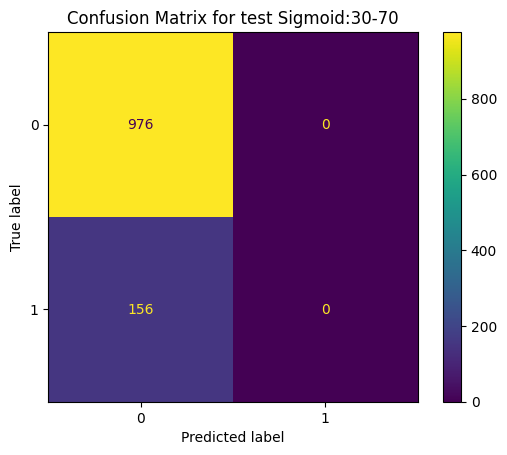

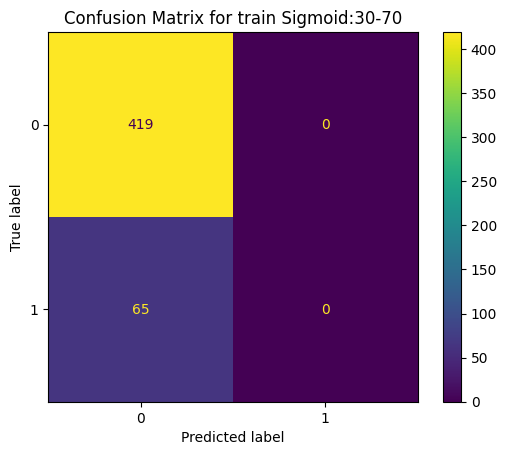

Iteration 9
Training loss Sigmoid:30-70: 0.3609418570995331
Test loss Sigmoid:30-70: 0.3676179051399231
Training accuracy Sigmoid:30-70: 0.8657024502754211
Test accuracy Sigmoid:30-70: 0.8621907830238342
F1 score Sigmoid:30-70: 0.0
              precision    recall  f1-score   support

      class1       0.86      1.00      0.93       976
      class2       0.00      0.00      0.00       156

    accuracy                           0.86      1132
   macro avg       0.43      0.50      0.46      1132
weighted avg       0.74      0.86      0.80      1132



C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf

16/16 [==============================] - 0s 1ms/step


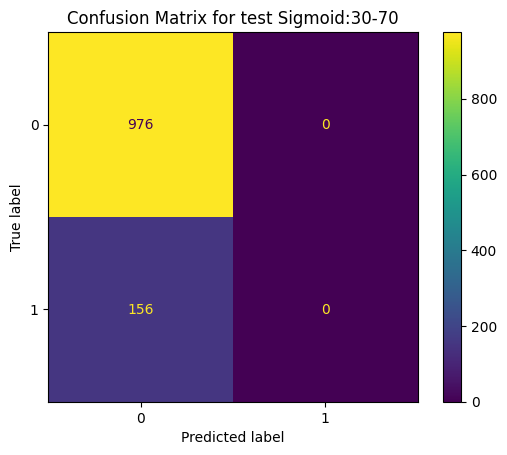

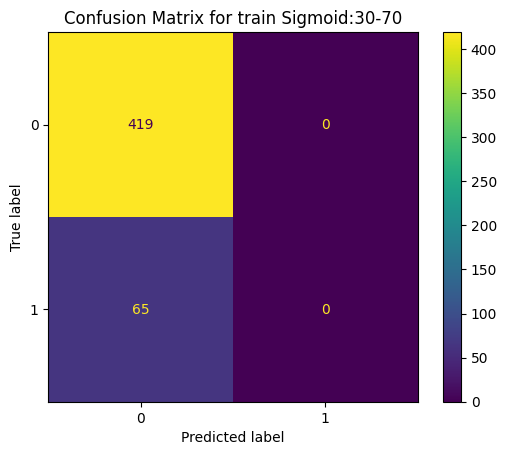

Iteration 10
Training loss Sigmoid:30-70: 0.3371070623397827
Test loss Sigmoid:30-70: 0.34515321254730225
Training accuracy Sigmoid:30-70: 0.8657024502754211
Test accuracy Sigmoid:30-70: 0.8621907830238342
F1 score Sigmoid:30-70: 0.0
              precision    recall  f1-score   support

      class1       0.86      1.00      0.93       976
      class2       0.00      0.00      0.00       156

    accuracy                           0.86      1132
   macro avg       0.43      0.50      0.46      1132
weighted avg       0.74      0.86      0.80      1132

Average Training loss Sigmoid:30-70: 0.31826300323009493
Average Test loss Sigmoid:30-70: 0.3269763305783272
Average Training accuracy Sigmoid:30-70: 0.8706611394882202
Average Test accuracy Sigmoid:30-70: 0.8668727695941925
Average F1 score Sigmoid:30-70: 0.06525795408093746


C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Luke Yeo\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf

In [62]:
# Set what is X and what is Y 
X12 = solid_and_liquid_data_numerical #Top 20 correlation
y12 = solid_and_liquid_data['category']

# split the data into train-test split where 30% of data will be used as the test set
X12_train, X12_test, y12_train, y12_test = train_test_split(X12, y12, test_size=0.7, shuffle=True, random_state=42)

# Apply MinMaxScaler to scale the features, this is because the dataset is not uniformly distributed
scaler = MinMaxScaler()
X12_train_scaled = scaler.fit_transform(X12_train)
X12_test_scaled = scaler.transform(X12_test)

train_loss_total = 0.0
test_loss_total = 0.0
train_accuracy_total = 0.0
test_accuracy_total = 0.0
f1_score_total = 0.0
num_iterations = 10
for i in range(num_iterations):
    # Build a neural network model with sigmoid activation function in the output layer
    model = Sequential()
    model.add(Dense(16, activation='sigmoid', input_shape=(X12_train_scaled.shape[1],)))
    model.add(Dense(8, activation='sigmoid'))
    model.add(Dense(1, activation='sigmoid'))

    # Compile the model
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    # Fit the model to the training data
    history = model.fit(X12_train_scaled, y12_train, epochs=50, batch_size=32, validation_split=0.2, verbose=0)

    # Evaluate the model on the training and test data
    train_loss, train_accuracy = model.evaluate(X12_train_scaled, y12_train, verbose=0)
    test_loss, test_accuracy = model.evaluate(X12_test_scaled, y12_test, verbose=0)

    train_loss_total += train_loss
    test_loss_total += test_loss
    train_accuracy_total += train_accuracy
    test_accuracy_total += test_accuracy

    # Evaluate the model on the test data
    y12_test_pred = model.predict(X12_test_scaled)
    y12_test_pred_binary = np.where(y12_test_pred > 0.5, 1, 0)
    
    f1 = f1_score(y12_test, y12_test_pred_binary)
    f1_score_total += f1

    # Compute confusion matrix
    cm23 = confusion_matrix(y12_test, y12_test_pred_binary)

    # Evaluate the model on the test data
    y12_train_pred = model.predict(X12_train_scaled)
    y12_train_pred_binary = np.where(y12_train_pred > 0.5, 1, 0)

    # Compute confusion matrix
    cm24 = confusion_matrix(y12_train, y12_train_pred_binary)

    # Display confusion matrix
    display = ConfusionMatrixDisplay(confusion_matrix=cm23, display_labels=['0', '1'])
    display.plot()
    plt.title("Confusion Matrix for test Sigmoid:30-70")
    plt.show()

    display2 = ConfusionMatrixDisplay(confusion_matrix=cm24, display_labels=['0', '1'])
    display2.plot()
    plt.title("Confusion Matrix for train Sigmoid:30-70")
    plt.show()


    print('Iteration', i+1)
    print('Training loss Sigmoid:30-70:', train_loss)
    print('Test loss Sigmoid:30-70:', test_loss)
    print('Training accuracy Sigmoid:30-70:', train_accuracy)
    print('Test accuracy Sigmoid:30-70:', test_accuracy)
    print('F1 score Sigmoid:30-70:', f1)

    # Calculate precision, recall, and F1-score
    report = classification_report(y12_test, y12_test_pred_binary, target_names=['class1', 'class2'])
    print(report)

# Calculate the averages
avg_train_loss = train_loss_total / num_iterations
avg_test_loss = test_loss_total / num_iterations
avg_train_accuracy = train_accuracy_total / num_iterations
avg_test_accuracy = test_accuracy_total / num_iterations
avg_f1_score = f1_score_total/ num_iterations

print('Average Training loss Sigmoid:30-70:', avg_train_loss)
print('Average Test loss Sigmoid:30-70:', avg_test_loss)
print('Average Training accuracy Sigmoid:30-70:', avg_train_accuracy)
print('Average Test accuracy Sigmoid:30-70:', avg_test_accuracy)
print('Average F1 score Sigmoid:30-70:', avg_f1_score)

# Random forest

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Set what is X and what is Y 
X6 = solid_and_liquid_data_numerical #Top 20 correlation
y6 = solid_and_liquid_data['category']

# split the data into train-test split where 30% of data will be used as the test set
X6_train, X6_test, y6_train, y6_test = train_test_split(X6, y6, test_size=0.3, shuffle=True, random_state=42)



# Apply MinMaxScaler to scale the features, this is because the dataset is not uniformly distributed
scaler = MinMaxScaler()
X6_train_scaled = scaler.fit_transform(X6_train)
X6_test_scaled = scaler.transform(X6_test)

num_iterations = 11
train_loss_total = 0.0
test_loss_total = 0.0
train_accuracy_total = 0.0
test_accuracy_total = 0.0

for i in range(num_iterations):
    # Build a Random Forest classifier
    model = RandomForestClassifier(n_estimators=100, random_state=42)

    # Fit the model to the training data
    model.fit(X6_train_scaled, y6_train)

    # Evaluate the model on the training and test data
    train_loss = model.score(X6_train_scaled, y6_train)
    test_loss = model.score(X6_test_scaled, y6_test)

    train_loss_total += train_loss
    test_loss_total += test_loss

    # Calculate predictions for train and test sets
    train_predictions = model.predict(X6_train_scaled)
    test_predictions = model.predict(X6_test_scaled)

    # Calculate the confusion matrix for train and test sets
    train_cm = confusion_matrix(y6_train, train_predictions)
    test_cm = confusion_matrix(y6_test, test_predictions)

    # Display the confusion matrix for train and test sets
    train_cm_display = ConfusionMatrixDisplay(confusion_matrix=train_cm, display_labels=np.unique(y6_train))
    test_cm_display = ConfusionMatrixDisplay(confusion_matrix=test_cm, display_labels=np.unique(y6_test))

    print('Iteration', i+1)
    print('Training accuracy:', train_loss)
    print('Test accuracy:', test_loss)
    print('Train Confusion Matrix:')
    train_cm_display.plot()
    plt.show()
    print('Test Confusion Matrix:')
    test_cm_display.plot()
    plt.show()
    print('------------------------------')

# Calculate the averages
avg_train_loss = train_loss_total / num_iterations
avg_test_loss = test_loss_total / num_iterations

print('Average Training accuracy:', avg_train_loss)
print('Average Test accuracy:', avg_test_loss)

# Bagging and Out-Of-Bag Error

In [ ]:
import tensorflow as tf
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn.ensemble import BaggingClassifier

# Set what is X and what is Y 
X6 = solid_and_liquid_data_numerical #Top 20 correlation
y6 = solid_and_liquid_data['category']

# split the data into train-test split where 30% of data will be used as the test set
X6_train, X6_test, y6_train, y6_test = train_test_split(X6, y6, test_size=0.3, shuffle=True, random_state=42)


# Apply MinMaxScaler to scale the features, this is because the dataset is not uniformly distributed
scaler = MinMaxScaler()
X6_train_scaled = scaler.fit_transform(X6_train)
X6_test_scaled = scaler.transform(X6_test)

num_iterations = 11
train_loss_total = 0.0
test_loss_total = 0.0
train_accuracy_total = 0.0
test_accuracy_total = 0.0
oob_accuracy_total = 0.0

for i in range(num_iterations):
    # Build a base neural network model with sigmoid activation function in the output layer
    base_model = Sequential()
    base_model.add(Dense(16, activation='relu', input_shape=(X6_train_scaled.shape[1],)))
    base_model.add(Dense(8, activation='relu'))
    base_model.add(Dense(1, activation='sigmoid'))

    # Compile the base model
    base_model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    # Create a BaggingClassifier with the base model
    bagging_model = BaggingClassifier(base_model, n_estimators=1, oob_score=True, random_state=42)

    # Fit the BaggingClassifier to the training data
    bagging_model.fit(X6_train_scaled, y6_train)

    # Evaluate the base model on the training and test data
    train_loss, train_accuracy = base_model.evaluate(X6_train_scaled, y6_train, verbose=0)
    test_loss, test_accuracy = base_model.evaluate(X6_test_scaled, y6_test, verbose=0)

    # Calculate OOB estimation
    oob_accuracy = bagging_model.oob_score_

    train_loss_total += train_loss
    test_loss_total += test_loss
    train_accuracy_total += train_accuracy
    test_accuracy_total += test_accuracy
    oob_accuracy_total += oob_accuracy

    # Calculate predictions for train and test sets
    train_predictions = base_model.predict_classes(X6_train_scaled)
    test_predictions = base_model.predict_classes(X6_test_scaled)

    # Calculate the confusion matrix for train and test sets
    train_cm = confusion_matrix(y6_train, train_predictions)
    test_cm = confusion_matrix(y6_test, test_predictions)

    # Display the confusion matrix for train and test sets
    train_cm_display = ConfusionMatrixDisplay(confusion_matrix=train_cm, display_labels=np.unique(y6_train))
    test_cm_display = ConfusionMatrixDisplay(confusion_matrix=test_cm, display_labels=np.unique(y6_test))

    print('Iteration', i+1)
    print('Training loss:', train_loss)
    print('Test loss:', test_loss)
    print('Training accuracy:', train_accuracy)
    print('Test accuracy:', test_accuracy)
    print('OOB Estimation:', oob_accuracy)
    print('Train Confusion Matrix:')
    train_cm_display.plot()
    plt.show()
    print('Test Confusion Matrix:')
    test_cm_display.plot()
    plt.show()
    print('------------------------------')

# Calculate the averages
avg_train_loss = train_loss_total / num_iterations
avg_test_loss = test_loss_total / num_iterations
avg_train_accuracy = train_accuracy_total / num_iterations
avg_test_accuracy = test_accuracy_total / num_iterations
avg_oob_accuracy = oob_accuracy_total / num_iterations

print('Average Training loss:', avg_train_loss)
print('Average Test loss:', avg_test_loss)
print('Average Training accuracy:', avg_train_accuracy)
print('Average Test accuracy:', avg_test_accuracy)
print('Average OOB Estimation:', avg_oob_accuracy)

# Dropout

In [ ]:
import tensorflow as tf
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Set what is X and what is Y 
X6 = solid_and_liquid_data_numerical #Top 20 correlation
y6 = solid_and_liquid_data['category']

# split the data into train-test split where 30% of data will be used as the test set
X6_train, X6_test, y6_train, y6_test = train_test_split(X6, y6, test_size=0.3, shuffle=True, random_state=42)


# Apply MinMaxScaler to scale the features, this is because the dataset is not uniformly distributed
scaler = MinMaxScaler()
X6_train_scaled = scaler.fit_transform(X6_train)
X6_test_scaled = scaler.transform(X6_test)

num_iterations = 11
train_loss_total = 0.0
test_loss_total = 0.0
train_accuracy_total = 0.0
test_accuracy_total = 0.0

for i in range(num_iterations):
    # Build a neural network model with sigmoid activation function in the output layer
    model = Sequential()
    model.add(Dense(16, activation='relu', input_shape=(X6_train_scaled.shape[1],)))
    model.add(Dropout(0.2))  # Dropout layer with a dropout rate of 0.2
    model.add(Dense(8, activation='relu'))
    model.add(Dropout(0.2))  # Dropout layer with a dropout rate of 0.2
    model.add(Dense(1, activation='sigmoid'))

    # Compile the model
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    # Fit the model to the training data
    history = model.fit(X6_train_scaled, y6_train, epochs=50, batch_size=32, validation_split=0.2, verbose=0)

    # Evaluate the model on the training and test data
    train_loss, train_accuracy = model.evaluate(X6_train_scaled, y6_train, verbose=0)
    test_loss, test_accuracy = model.evaluate(X6_test_scaled, y6_test, verbose=0)

    train_loss_total += train_loss
    test_loss_total += test_loss
    train_accuracy_total += train_accuracy
    test_accuracy_total += test_accuracy

    # Calculate predictions for train and test sets
    train_predictions = model.predict_classes(X6_train_scaled)
    test_predictions = model.predict_classes(X6_test_scaled)

    # Calculate the confusion matrix for train and test sets
    train_cm = confusion_matrix(y6_train, train_predictions)
    test_cm = confusion_matrix(y6_test, test_predictions)

    # Display the confusion matrix for train and test sets
    train_cm_display = ConfusionMatrixDisplay(confusion_matrix=train_cm, display_labels=np.unique(y6_train))
    test_cm_display = ConfusionMatrixDisplay(confusion_matrix=test_cm, display_labels=np.unique(y6_test))

    print('Iteration', i+1)
    print('Training loss:', train_loss)
    print('Test loss:', test_loss)
    print('Training accuracy:', train_accuracy)
    print('Test accuracy:', test_accuracy)
    print('Train Confusion Matrix:')
    train_cm_display.plot()
    plt.show()
    print('Test Confusion Matrix:')
    test_cm_display.plot()
    plt.show()
    print('------------------------------')

# Calculate the averages
avg_train_loss = train_loss_total / num_iterations
avg_test_loss = test_loss_total / num_iterations
avg_train_accuracy = train_accuracy_total / num_iterations
avg_test_accuracy = test_accuracy_total / num_iterations

print('Average Training loss:', avg_train_loss)
print('Average Test loss:', avg_test_loss)
print('Average Training accuracy:', avg_train_accuracy)
print('Average Test accuracy:', avg_test_accuracy)

# Boosting

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Set what is X and what is Y 
X6 = solid_and_liquid_data_numerical #Top 20 correlation
y6 = solid_and_liquid_data['category']

# split the data into train-test split where 30% of data will be used as the test set
X6_train, X6_test, y6_train, y6_test = train_test_split(X6, y6, test_size=0.3, shuffle=True, random_state=42)


# Apply MinMaxScaler to scale the features, this is because the dataset is not uniformly distributed
scaler = MinMaxScaler()
X6_train_scaled = scaler.fit_transform(X6_train)
X6_test_scaled = scaler.transform(X6_test)

num_iterations = 11
train_loss_total = 0.0
test_loss_total = 0.0
train_accuracy_total = 0.0
test_accuracy_total = 0.0

for i in range(num_iterations):
    # Build a Gradient Boosting classifier
    model = GradientBoostingClassifier(random_state=42)

    # Fit the model to the training data
    model.fit(X6_train_scaled, y6_train)

    # Evaluate the model on the training and test data
    train_loss = model.score(X6_train_scaled, y6_train)
    test_loss = model.score(X6_test_scaled, y6_test)

    train_loss_total += train_loss
    test_loss_total += test_loss

    # Calculate predictions for train and test sets
    train_predictions = model.predict(X6_train_scaled)
    test_predictions = model.predict(X6_test_scaled)

    # Calculate the confusion matrix for train and test sets
    train_cm = confusion_matrix(y6_train, train_predictions)
    test_cm = confusion_matrix(y6_test, test_predictions)

    # Display the confusion matrix for train and test sets
    train_cm_display = ConfusionMatrixDisplay(confusion_matrix=train_cm, display_labels=np.unique(y6_train))
    test_cm_display = ConfusionMatrixDisplay(confusion_matrix=test_cm, display_labels=np.unique(y6_test))

    print('Iteration', i+1)
    print('Training accuracy:', train_loss)
    print('Test accuracy:', test_loss)
    print('Train Confusion Matrix:')
    train_cm_display.plot()
    plt.show()
    print('Test Confusion Matrix:')
    test_cm_display.plot()
    plt.show()
    print('------------------------------')
    
    # Calculate the averages
avg_train_loss = train_loss_total / num_iterations
avg_test_loss = test_loss_total / num_iterations
avg_train_accuracy = train_accuracy_total / num_iterations
avg_test_accuracy = test_accuracy_total / num_iterations

print('Average Training loss:', avg_train_loss)
print('Average Test loss:', avg_test_loss)
print('Average Training accuracy:', avg_train_accuracy)
print('Average Test accuracy:', avg_test_accuracy)